In [89]:
# Standard library
import collections
import random
from copy import deepcopy
from pathlib import Path

# Scientific computing
import numpy as np
import pandas as pd

# Machine learning
from kneed import KneeLocator

# Plotting
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib_venn import venn2
import seaborn as sns
from statannotations.Annotator import Annotator
from scipy import stats

# Bioinformatics
import anndata
import anndata as ad
import scanpy as sc
import scirpy as ir

random.seed(10)

In [2]:
# Paths — relative to this notebook's location (GVHD_Reproducibility-main/Sc&TCR_Pipelines/)
PROJECT_ROOT = Path('../..')

# Input paths
TCELL_ANN_ANNOTATED_PATH        = PROJECT_ROOT / 'adata_file' / 'tcell_ann_concat_Tcell_only_annotated.h5ad'
AIRR_OBS_CSV_PATH               = PROJECT_ROOT / 'adata_file' / 'airr_obs.csv'

# Output paths — adata
TCELL_ANN_CONCAT_MIGRATION_PATH = PROJECT_ROOT / 'adata_file' / 'tcell_ann_concat_Tcell_only_Migration.h5ad'

# Output paths — figures
FIGURES_SC_DIR                  = PROJECT_ROOT / 'Figures' / 'single_cell_figures'


In [3]:
# read in csv files that contains clonotype information
TCR_info = pd.read_csv(AIRR_OBS_CSV_PATH, index_col=0)
TCR_info.index

Index(['R096_Tc17_up_AAACCTGCATCCCACT-1', 'R096_Tc17_up_AAACCTGGTTGGAGGT-1',
       'R096_Tc17_up_AAACGGGAGGATGCGT-1', 'R096_Tc17_up_AAACGGGGTAAATGAC-1',
       'R096_Tc17_up_AAAGATGGTAGCGTGA-1', 'R096_Tc17_up_AAAGATGGTCGTTGTA-1',
       'R096_Tc17_up_AAAGATGTCTATGTGG-1', 'R096_Tc17_up_AAAGCAAAGCTTATCG-1',
       'R096_Tc17_up_AAAGCAAAGTCGTACT-1', 'R096_Tc17_up_AAAGCAACACTCAGGC-1',
       ...
       'UA41_TCTCATACAACACGCC-1', 'UA41_TCTTTCCAGATGTAAC-1',
       'UA41_TGAGAGGAGAGAGCTC-1', 'UA41_TGAGCATAGCGGCTTC-1',
       'UA41_TGATTTCAGGCCGAAT-1', 'UA41_TGCCAAAGTTAGTGGG-1',
       'UA41_TGCCCTAAGTTGTCGT-1', 'UA41_TGGGAAGAGGTGACCA-1',
       'UA41_TTCGGTCAGTTCCACA-1', 'UA41_TTGAACGGTTCAACCA-1'],
      dtype='object', length=51456)

In [4]:
tcell_ann_concat = anndata.read_h5ad(TCELL_ANN_ANNOTATED_PATH)

In [5]:
#merge the TCR_info with T_cells_adata
tcell_ann_concat.obs =tcell_ann_concat.obs.merge(TCR_info, left_index=True, right_index=True, how='left')

In [6]:
TCR_info

,receptor_type,receptor_subtype,chain_pairing,clone_id,clone_id_size,cc_aa_identity,cc_aa_identity_size
R096_Tc17_up_AAACCTGCATCCCACT-1,TCR,TRA+TRB,single pair,0,1,0,1
R096_Tc17_up_AAACCTGGTTGGAGGT-1,TCR,TRA+TRB,single pair,1,1,1,1
R096_Tc17_up_AAACGGGAGGATGCGT-1,TCR,TRA+TRB,single pair,2,1,2,1
R096_Tc17_up_AAACGGGGTAAATGAC-1,TCR,TRA+TRB,single pair,3,2,3,2
R096_Tc17_up_AAAGATGGTAGCGTGA-1,TCR,TRA+TRB,single pair,4,3,4,3
...,...,...,...,...,...,...,...
UA41_TGCCAAAGTTAGTGGG-1,TCR,TRA+TRB,two full chains,25828,2,24668,6
UA41_TGCCCTAAGTTGTCGT-1,TCR,TRA+TRB,single pair,25805,6,24691,6
UA41_TGGGAAGAGGTGACCA-1,TCR,TRA+TRB,single pair,25829,2,24713,2
UA41_TTCGGTCAGTTCCACA-1,TCR,TRA+TRB,single pair,25830,2,24714,2


In [7]:
tcell_ann_concat_tcr = tcell_ann_concat[~tcell_ann_concat.obs['clone_id_size'].isna(),:]
tcell_ann_concat_tcr.obs['clone_id_size']

R096_Tc17_up_AAACCTGGTTGGAGGT-1    1.0
R096_Tc17_up_AAACGGGAGGATGCGT-1    1.0
R096_Tc17_up_AAACGGGGTAAATGAC-1    2.0
R096_Tc17_up_AAAGATGGTAGCGTGA-1    3.0
R096_Tc17_up_AAAGATGGTCGTTGTA-1    1.0
                                  ... 
UA40_TGAGCATAGCGGCTTC-1            4.0
UA40_TGATTTCAGGCCGAAT-1            2.0
UA40_TGCCCTAAGTTGTCGT-1            6.0
UA40_TGGGAAGAGGTGACCA-1            2.0
UA40_TTGAACGGTTCAACCA-1            2.0
Name: clone_id_size, Length: 28362, dtype: float64

In [8]:
Sample_list = ["R096_Tc17_up","R096_Tc17_low","RH01","RH02","RH03","RH04","RH05","RH06","RH07","RH08","RH09","RH10","RH11","RH12","RH13","RH14","UA01","UA02","UA03","UA04","UA05","UA06","UA07","UA08","UA09","UA10","UA11","UA12",'UA13','UA14','UA15','UA19','UA20','UA21','UA22','UA23','UA24','UA26','UA30','UA31','UA32','UA33','UA34','UA35','UA36','UA37','UA38','UA39','UA40','UA41']

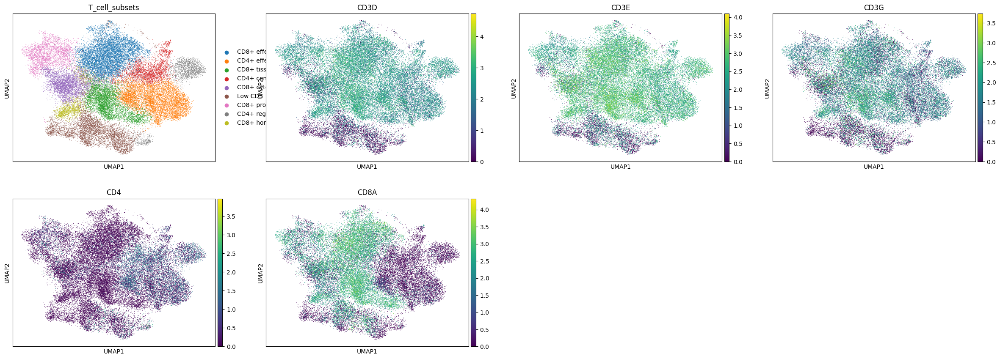

In [9]:
sc.pl.umap(tcell_ann_concat, color=['T_cell_subsets', "CD3D","CD3E","CD3G", 'CD4', 'CD8A'])

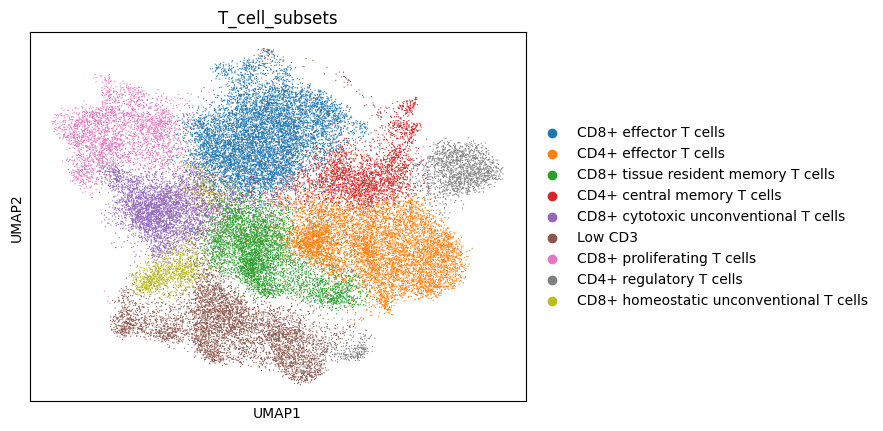

In [10]:
sc.pl.umap(tcell_ann_concat, color=['T_cell_subsets'])

In [11]:
tcell_ann_concat_tcr

View of AnnData object with n_obs × n_vars = 28362 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets', 'PatientID_Time', 'PatientID_Tissue_Loc', 'PatientID_Grade', 'PatientID_Grade_Time_Loc', 'T_cell_subsets_plot', 'T_cell_subsets_reordered', 'SampleID_Grade', 'GVHD_Grade', 'leiden_48', 'ptcy', 'PatientID_Grade_Ptcy', 'SampleID_Ptcy', 'receptor_type', 'receptor_subtype', 'chain_pairing', '

R096_Tc17_up


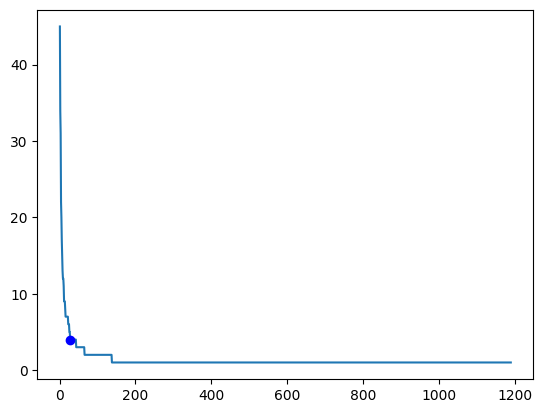

R096_Tc17_up 4
R096_Tc17_low


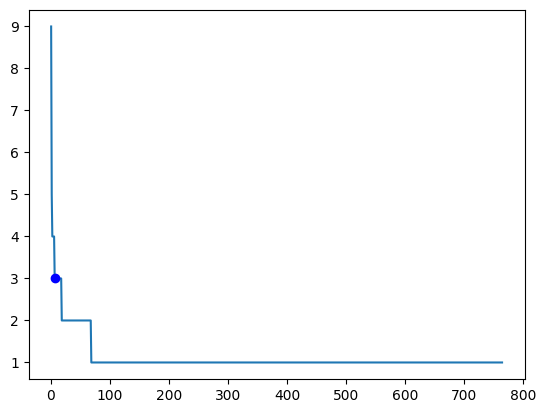

R096_Tc17_low 3
RH01


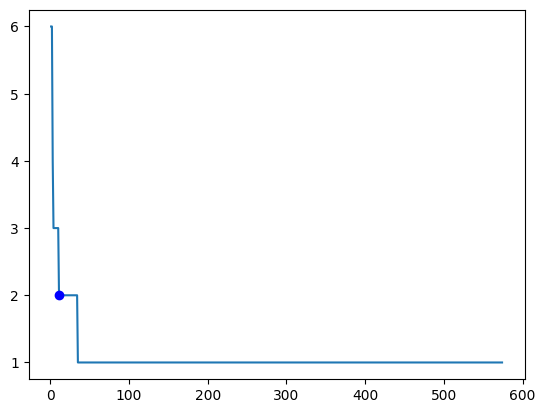

RH01 2
RH02
RH02 2
RH03


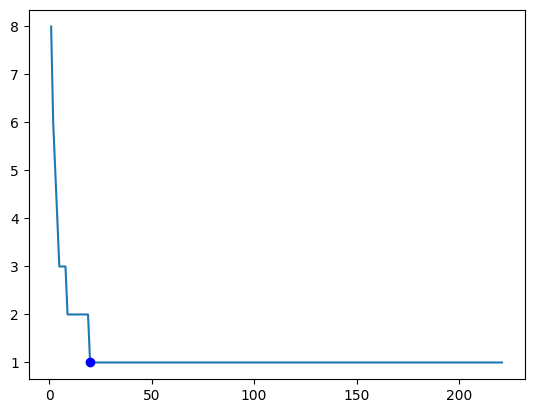

RH03 2
RH04
RH04 2
RH05


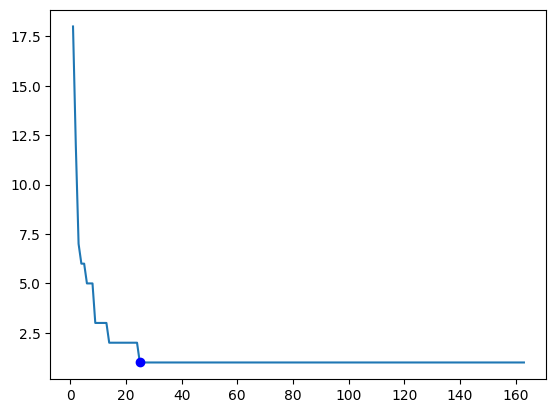

RH05 2
RH06


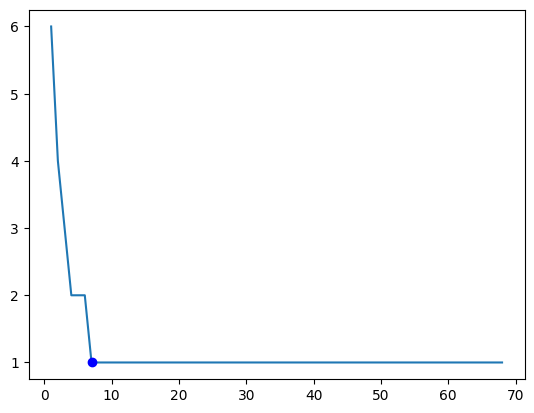

RH06 2
RH07


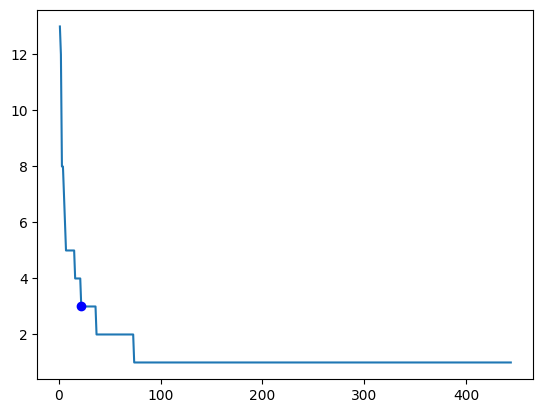

RH07 3
RH08


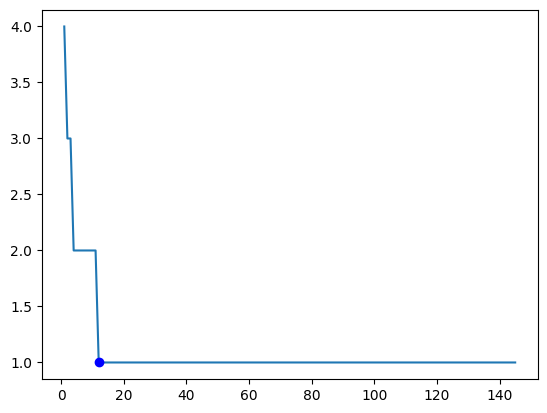

RH08 2
RH09


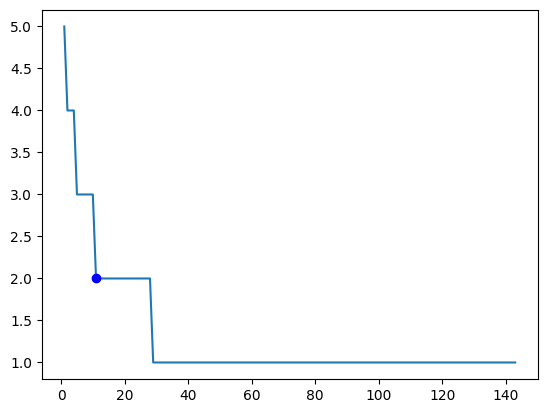

RH09 2
RH10


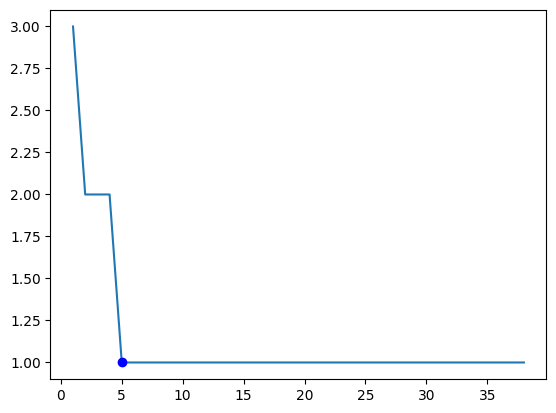

RH10 2
RH11
RH11 2
RH12


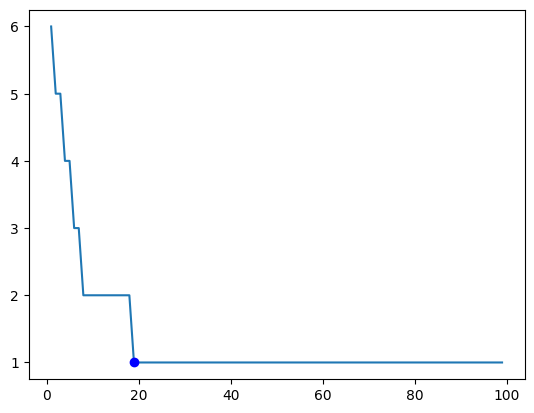

RH12 2
RH13


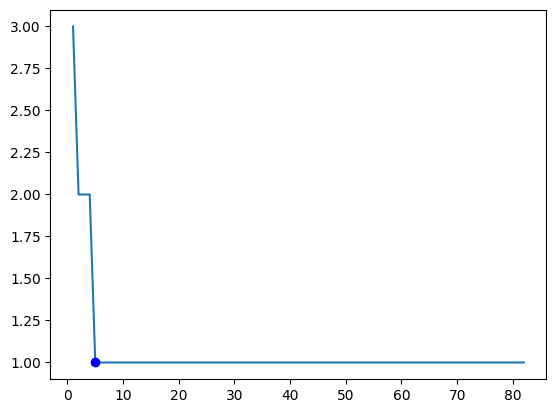

RH13 2
RH14
RH14 2
UA01


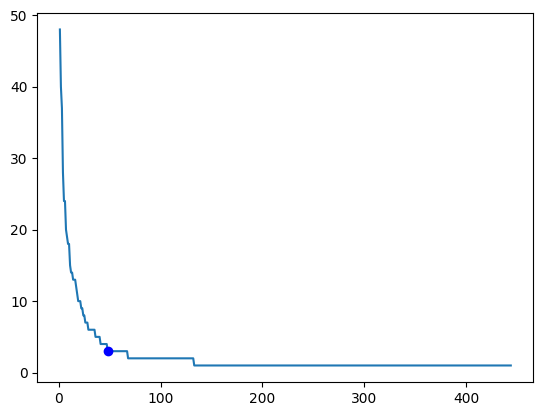

UA01 3
UA02


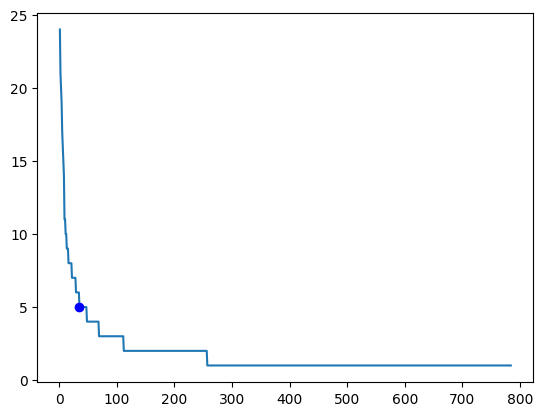

UA02 5
UA03
UA03 2
UA04
UA04 2
UA05
UA05 2
UA06
UA06 2
UA07


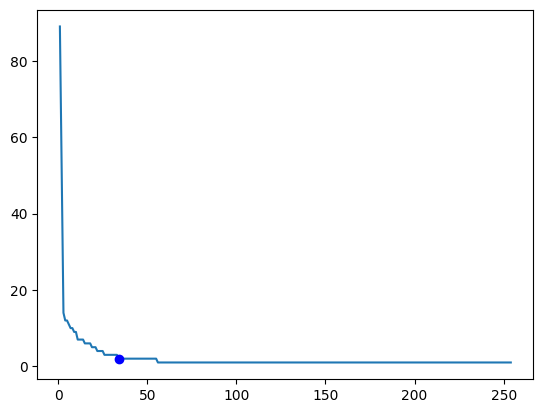

UA07 2
UA08


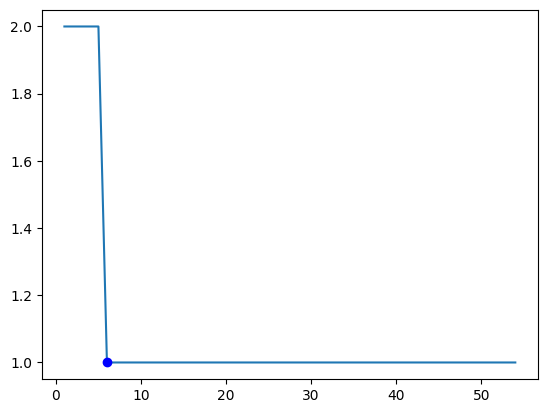

UA08 2
UA09


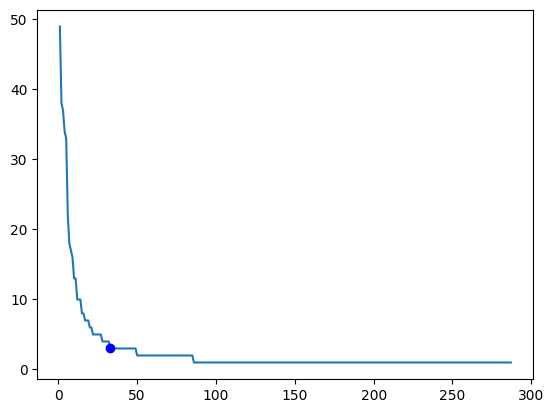

UA09 3
UA10


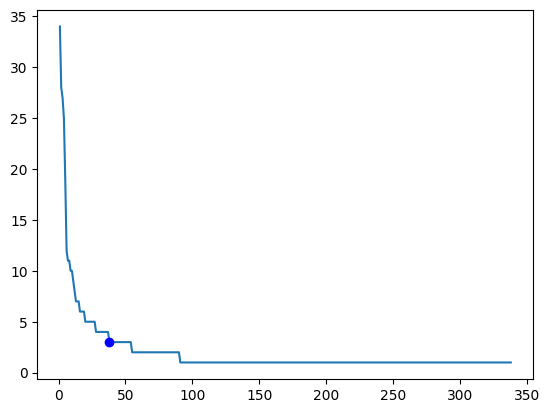

UA10 3
UA11


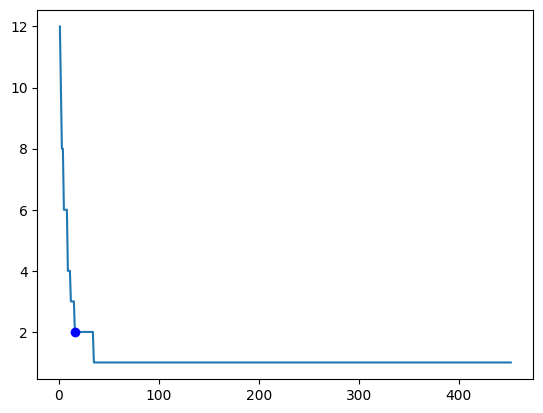

UA11 2
UA12


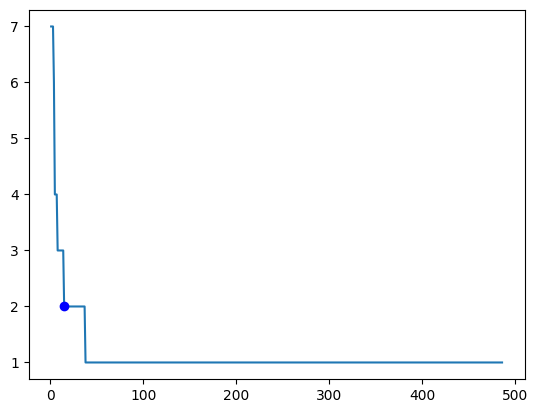

UA12 2
UA13


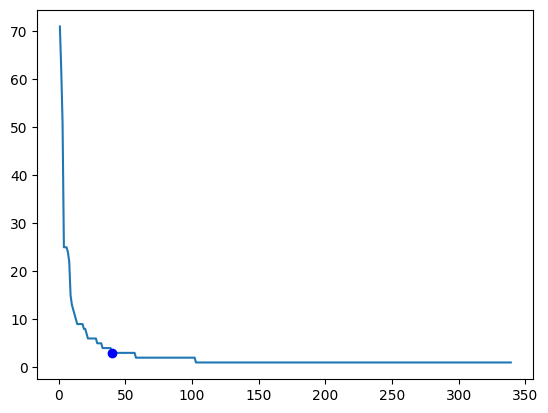

UA13 3
UA14


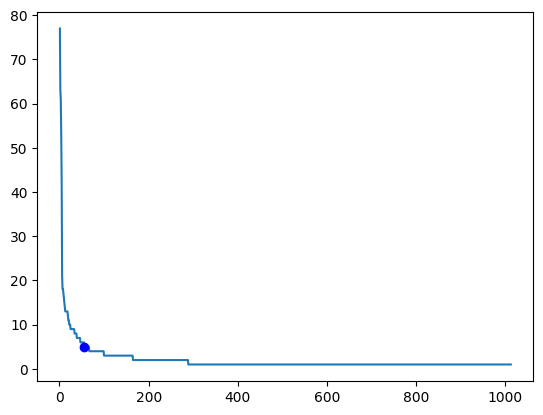

UA14 5
UA15


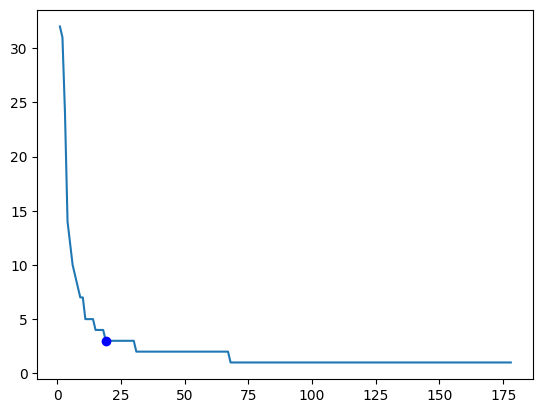

UA15 3
UA19


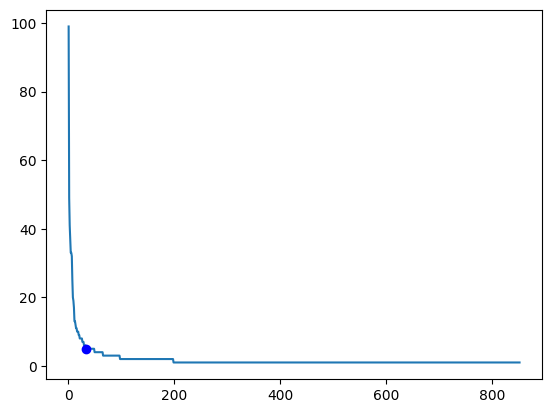

UA19 5
UA20


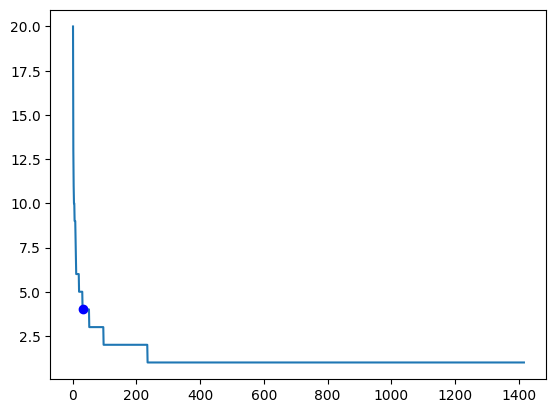

UA20 4
UA21


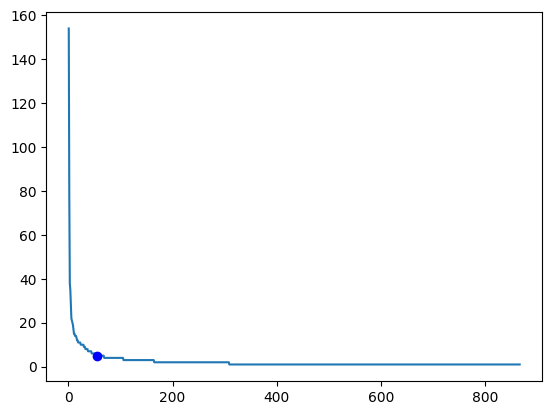

UA21 5
UA22


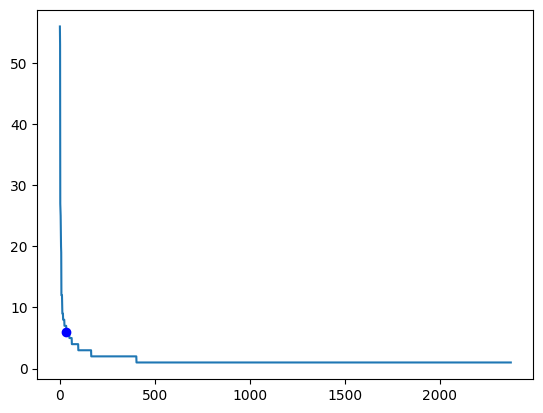

UA22 6
UA23
UA23 2
UA24
UA24 2
UA26
UA26 2
UA30


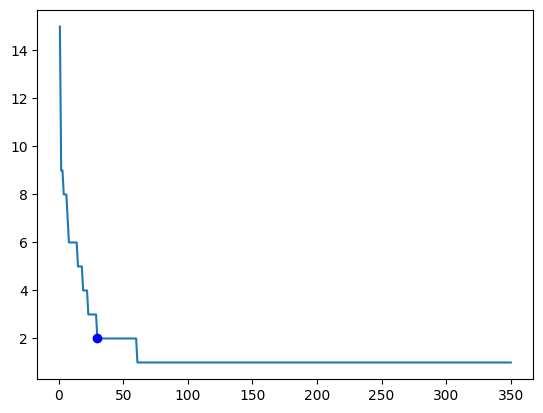

UA30 2
UA31


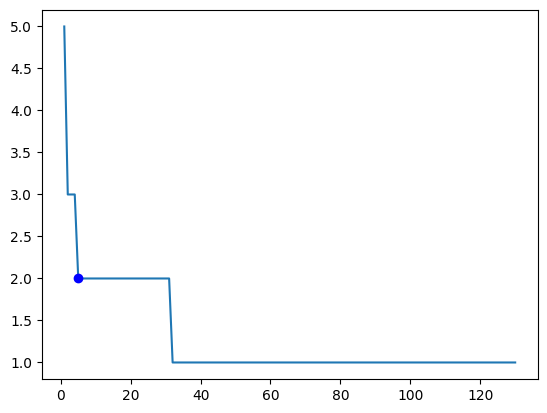

UA31 2
UA32


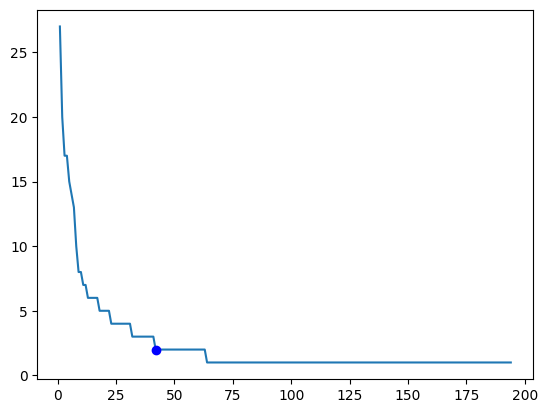

UA32 2
UA33


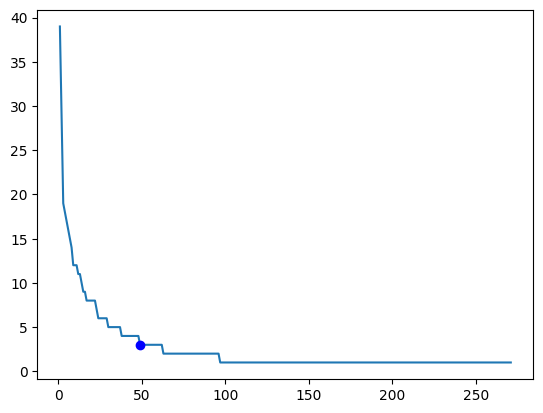

UA33 3
UA34


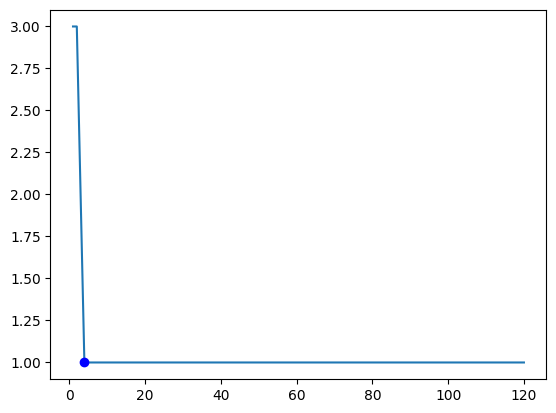

UA34 2
UA35


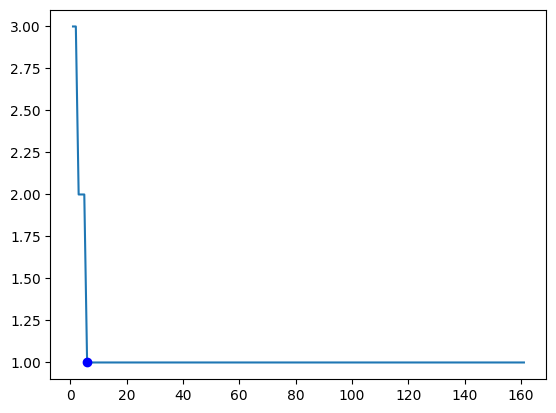

UA35 2
UA36


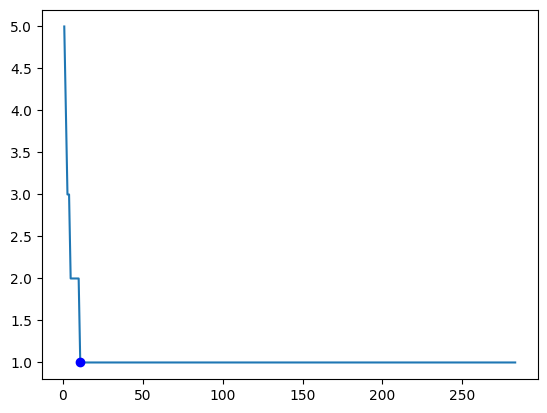

UA36 2
UA37


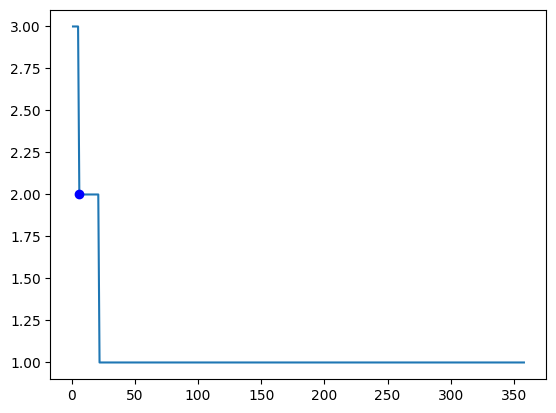

UA37 2
UA38


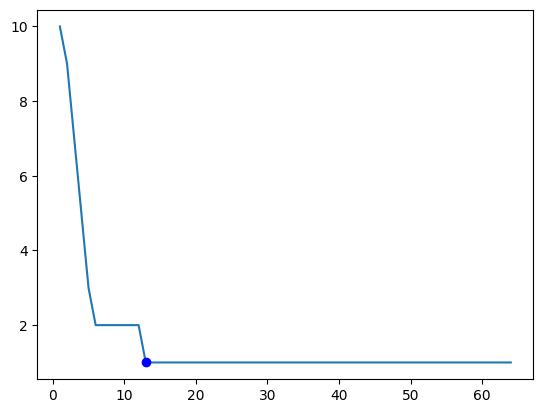

UA38 2
UA39


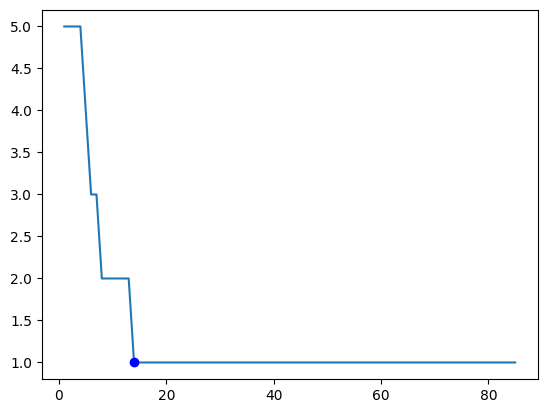

UA39 2
UA40


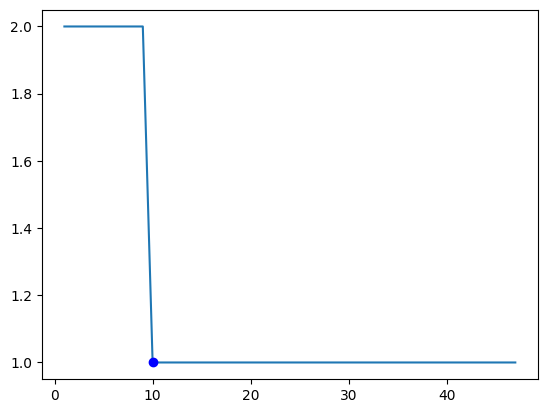

UA40 2
UA41
UA41 2


In [12]:
cut_off = []
for sample in Sample_list:
    print(sample)
    tcell_ann_sample = tcell_ann_concat_tcr[tcell_ann_concat_tcr.obs["SampleID"]==sample]
    count = collections.Counter(tcell_ann_sample.obs['cc_aa_identity'])
    ct_data_df = pd.DataFrame(count.items())
    ct_data_df = ct_data_df.rename(columns={0: 'clonotype_number', 1: 'Freq'})
    if len(ct_data_df) > 0 and len(ct_data_df[1:100]['Freq'].unique())>2: 
        ct_data_df = ct_data_df.sort_values(by=['Freq'],ascending=False)
        length = len(ct_data_df['Freq'].values)
        kn = KneeLocator(range(1,length),ct_data_df[1:length]['Freq'].values, curve='convex', direction='decreasing', S= 10)
        plt.plot(range(1,length),ct_data_df[1:length]['Freq'].values)
        patient_cut_off = ct_data_df[1:100]['Freq'].values[kn.knee]
        plt.plot(kn.knee,patient_cut_off,'bo')
        plt.show()
        
        if patient_cut_off>=2:
            cut_off.append(patient_cut_off)
        else:
            cut_off.append(2)
        
    else:
        cut_off.append(2)
        
    print(sample, cut_off[len(cut_off)-1])


In [13]:
cut_off

[4,
 3,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 5,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 2,
 2,
 3,
 5,
 3,
 5,
 4,
 5,
 6,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2]

In [14]:
TCR_info

,receptor_type,receptor_subtype,chain_pairing,clone_id,clone_id_size,cc_aa_identity,cc_aa_identity_size
R096_Tc17_up_AAACCTGCATCCCACT-1,TCR,TRA+TRB,single pair,0,1,0,1
R096_Tc17_up_AAACCTGGTTGGAGGT-1,TCR,TRA+TRB,single pair,1,1,1,1
R096_Tc17_up_AAACGGGAGGATGCGT-1,TCR,TRA+TRB,single pair,2,1,2,1
R096_Tc17_up_AAACGGGGTAAATGAC-1,TCR,TRA+TRB,single pair,3,2,3,2
R096_Tc17_up_AAAGATGGTAGCGTGA-1,TCR,TRA+TRB,single pair,4,3,4,3
...,...,...,...,...,...,...,...
UA41_TGCCAAAGTTAGTGGG-1,TCR,TRA+TRB,two full chains,25828,2,24668,6
UA41_TGCCCTAAGTTGTCGT-1,TCR,TRA+TRB,single pair,25805,6,24691,6
UA41_TGGGAAGAGGTGACCA-1,TCR,TRA+TRB,single pair,25829,2,24713,2
UA41_TTCGGTCAGTTCCACA-1,TCR,TRA+TRB,single pair,25830,2,24714,2


In [15]:
for i in range(len(Sample_list)):
    print(cut_off[i])
    vars()["tcell_ann_concat" + str(Sample_list[i])] = tcell_ann_concat[tcell_ann_concat.obs["SampleID"]==Sample_list[i]]
    vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
    vars()["tcell_ann_concat" + str(Sample_list[i])].obs.loc[vars()["tcell_ann_concat" + str(Sample_list[i])].obs['cc_aa_identity_size'] >= cut_off[i], "ExpandedorSingleton"] = "Expanded"
    vars()["tcell_ann_concat" + str(Sample_list[i])].obs.loc[vars()["tcell_ann_concat" + str(Sample_list[i])].obs['cc_aa_identity_size'] < cut_off[i], "ExpandedorSingleton"] = "Singleton"
    vars()["tcell_ann_concat" + str(Sample_list[i])].obs['cc_aa_identity_size_norm'] = vars()["tcell_ann_concat" + str(Sample_list[i])].obs['cc_aa_identity_size']/np.sum(vars()["tcell_ann_concat" + str(Sample_list[i])].obs['cc_aa_identity_size'])
    print(Sample_list[i])

4
R096_Tc17_up
3
R096_Tc17_low
2


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


RH01
2
RH02
2
RH03
2


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


RH04
2
RH05
2
RH06
3


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


RH07
2
RH08
2
RH09
2


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


RH10
2
RH11
2
RH12
2


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


RH13
2
RH14
3
UA01
5


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


UA02
2
UA03
2
UA04
2


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


UA05
2
UA06
2
UA07
2


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


UA08
3
UA09
3
UA10
2


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


UA11
2
UA12
3
UA13
5


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


UA14
3
UA15
5
UA19
4


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_a

UA20
5
UA21
6


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


UA22
2
UA23
2
UA24
2


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


UA26
2
UA30
2
UA31
2


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


UA32
3
UA33
2
UA34
2


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


UA35
2
UA36
2
UA37
2


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


UA38
2
UA39
2
UA40
2
UA41


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1609380292.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  vars()["tcell_ann_concat" + str(Sample_list[i])].obs["ExpandedorSingleton"] = "NA"


In [16]:
tcell_ann_concat_con = ad.concat([tcell_ann_concatR096_Tc17_up, tcell_ann_concatR096_Tc17_low, tcell_ann_concatRH01, tcell_ann_concatRH02, tcell_ann_concatRH03, tcell_ann_concatRH04, tcell_ann_concatRH05, tcell_ann_concatRH06, tcell_ann_concatRH07, tcell_ann_concatRH08, tcell_ann_concatRH09,tcell_ann_concatRH10, tcell_ann_concatRH11,tcell_ann_concatRH12,tcell_ann_concatRH13,tcell_ann_concatRH14, tcell_ann_concatUA01, tcell_ann_concatUA02, tcell_ann_concatUA03, tcell_ann_concatUA04, tcell_ann_concatUA05, tcell_ann_concatUA06, tcell_ann_concatUA07, tcell_ann_concatUA08,tcell_ann_concatUA09, tcell_ann_concatUA10, tcell_ann_concatUA11, tcell_ann_concatUA12,tcell_ann_concatUA13, tcell_ann_concatUA14,tcell_ann_concatUA15,tcell_ann_concatUA19,tcell_ann_concatUA20,tcell_ann_concatUA21,tcell_ann_concatUA22,tcell_ann_concatUA23,tcell_ann_concatUA24,tcell_ann_concatUA26,tcell_ann_concatUA30,tcell_ann_concatUA31,tcell_ann_concatUA32,tcell_ann_concatUA33,tcell_ann_concatUA34,tcell_ann_concatUA35,tcell_ann_concatUA36,tcell_ann_concatUA37,tcell_ann_concatUA38,tcell_ann_concatUA39,tcell_ann_concatUA40,tcell_ann_concatUA41], join="outer")

In [17]:
tcell_ann_concat_con

AnnData object with n_obs × n_vars = 38539 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets', 'PatientID_Time', 'PatientID_Tissue_Loc', 'PatientID_Grade', 'PatientID_Grade_Time_Loc', 'T_cell_subsets_plot', 'T_cell_subsets_reordered', 'SampleID_Grade', 'GVHD_Grade', 'leiden_48', 'ptcy', 'PatientID_Grade_Ptcy', 'SampleID_Ptcy', 'receptor_type', 'receptor_subtype', 'chain_pairing', 'clone_id

In [18]:
if list(tcell_ann_concat.obs.index) == list(tcell_ann_concat_con.obs.index):
    print("The lists are identical")
else:
    print("The lists are not identical")

The lists are identical


In [19]:
tcell_ann_concat.obs['cc_aa_identity_size_norm'] = tcell_ann_concat_con.obs['cc_aa_identity_size_norm']
tcell_ann_concat.obs['ExpandedorSingleton'] = tcell_ann_concat_con.obs['ExpandedorSingleton']

In [20]:
tcell_ann_concat.obs['cc_aa_identity_size_norm']

R096_Tc17_up_AAACCTGGTTGGAGGT-1    0.000072
R096_Tc17_up_AAACCTGTCTATCCTA-1         NaN
R096_Tc17_up_AAACGGGAGGATGCGT-1    0.000072
R096_Tc17_up_AAACGGGGTAAATGAC-1    0.000143
R096_Tc17_up_AAAGATGCAAACTGTC-1         NaN
                                     ...   
UA41_TGTTCCGAGGACAGCT-1                 NaN
UA41_TTAGGACGTTGTTTGG-1                 NaN
UA41_TTAGGACTCCCAAGAT-1                 NaN
UA41_TTCGAAGTCCGCATCT-1                 NaN
UA41_TTGCGTCCAAGAAAGG-1                 NaN
Name: cc_aa_identity_size_norm, Length: 38539, dtype: float64

In [21]:
sorter = ['C155','C101','C162','C157','R085','C179','C160','C159','C152','C068','C98','C66','ND001','ND003']

[None]

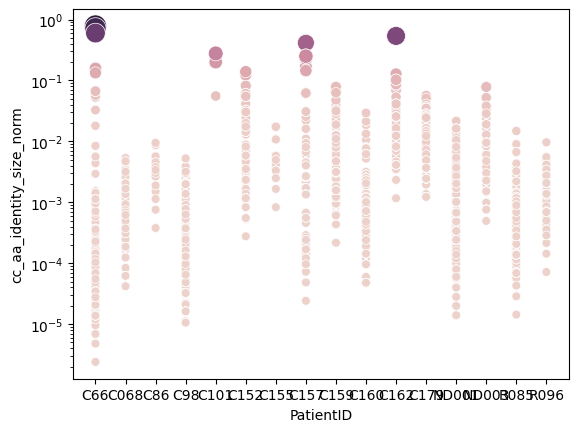

In [22]:
#size
#expanded- stack bar 
clone_size = sns.scatterplot(data=tcell_ann_concat.obs, x="PatientID", y="cc_aa_identity_size_norm", hue ="cc_aa_identity_size_norm", size = "cc_aa_identity_size_norm", sizes=(40, 250), legend= False,hue_order =sorter)
clone_size.set(yscale = 'log')

In [23]:
tcell_ann_concat.obs.columns

Index(['PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant',
       'Tissue_Location', 'LPorIE', 'Enrichment Method',
       'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1',
       'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender',
       'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen',
       'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts',
       'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet',
       'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet',
       'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet',
       'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets',
       'PatientID_Time', 'PatientID_Tissue_Loc', 'PatientID_Grade',
       'PatientID_Grade_Time_Loc', 'T_cell_subsets_plot',
       'T_cell_subsets_reordered', 'SampleID_Grade', 'GVHD_Grade', 'leiden_48',
       'ptcy', 'PatientID_Grade_Ptcy', 'SampleID_Ptcy', 'receptor_type',
       '

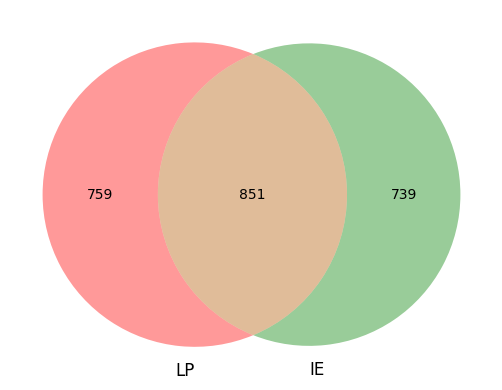

In [24]:
#Mobile vs stationary
expanded_ann = tcell_ann_concat[tcell_ann_concat.obs["ExpandedorSingleton"] =="Expanded"]
LP = expanded_ann[expanded_ann.obs['LPorIE'] == "Lamina Propria Cells"]
IE = expanded_ann[expanded_ann.obs['LPorIE'] == "Intraepithelial Cells"]
set1 = set(LP.obs['cc_aa_identity'])
set2 = set(IE.obs['cc_aa_identity'])

venn2([set1, set2], ('LP', 'IE'))

plt.show()

In [25]:
migrate = set1.intersection(set2) 
print(len(migrate))
LP_stationary = set1.difference(migrate)
print(len(LP_stationary))
IE_stationary = set2.difference(migrate)
print(len(IE_stationary))

851
759
739


In [26]:
tcell_ann_concat_tcr.obs['PatientID_Time_Tissue'] = tcell_ann_concat_tcr.obs['PatientID'].astype(str)+'_'+tcell_ann_concat_tcr.obs['Days_post-Transplant'].astype(str)+'_'+tcell_ann_concat_tcr.obs['Tissue_Location'].astype(str)
tcell_ann_concat_tcr.obs['PatientID_Time_Tissue'].unique()

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/109929369.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_ann_concat_tcr.obs['PatientID_Time_Tissue'] = tcell_ann_concat_tcr.obs['PatientID'].astype(str)+'_'+tcell_ann_concat_tcr.obs['Days_post-Transplant'].astype(str)+'_'+tcell_ann_concat_tcr.obs['Tissue_Location'].astype(str)


array(['R096_27.0_Upper GI', 'R096_27.0_Lower GI', 'C155_27.0_Upper GI',
       'C152_164.0_Upper GI', 'C152_164.0_Lower GI', 'C159_36.0_Upper GI',
       'C159_36.0_Lower GI', 'C162_33.0_Upper GI', 'C162_33.0_Lower GI',
       'C068_140.0_Upper GI', 'C101_32.0_Lower GI', 'C157_23.0_Lower GI',
       'C157_23.0_Upper GI', 'ND001_nan_Upper GI', 'ND001_nan_Lower GI',
       'C98_119.0_Upper GI', 'C98_119.0_Lower GI', 'R085_76.0_Upper GI',
       'C66_375.0_Upper GI', 'C66_444.0_Upper GI', 'C66_444.0_Lower GI',
       'C86_248.0_Lower GI', 'C160_28.0_Lower GI', 'C160_196.0_Upper GI',
       'C179_45.0_Lower GI', 'C179_45.0_Upper GI', 'ND003_nan_Lower GI',
       'ND003_nan_Upper GI'], dtype=object)

In [27]:
tcell_ann_concat.obs['PatientID_Time_Tissue'] = tcell_ann_concat.obs['PatientID'].astype(str)+'_'+tcell_ann_concat.obs['Days_post-Transplant'].astype(str)+'_'+tcell_ann_concat.obs['Tissue_Location'].astype(str)
tcell_ann_concat.obs['PatientID_Time_Tissue'].unique()

array(['R096_27.0_Upper GI', 'R096_27.0_Lower GI', 'C155_27.0_Upper GI',
       'C152_164.0_Upper GI', 'C152_164.0_Lower GI', 'C159_36.0_Upper GI',
       'C159_36.0_Lower GI', 'C162_33.0_Upper GI', 'C162_33.0_Lower GI',
       'C068_140.0_Upper GI', 'C101_32.0_Lower GI', 'C157_23.0_Lower GI',
       'C157_23.0_Upper GI', 'ND001_nan_Upper GI', 'ND001_nan_Lower GI',
       'C98_119.0_Upper GI', 'C98_119.0_Lower GI', 'R085_76.0_Upper GI',
       'C66_375.0_Upper GI', 'C66_444.0_Upper GI', 'C66_444.0_Lower GI',
       'C86_248.0_Lower GI', 'C160_28.0_Lower GI', 'C160_196.0_Upper GI',
       'C179_45.0_Lower GI', 'C179_45.0_Upper GI', 'ND003_nan_Lower GI',
       'ND003_nan_Upper GI'], dtype=object)

In [28]:
tcell_ann_concat

AnnData object with n_obs × n_vars = 38539 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets', 'PatientID_Time', 'PatientID_Tissue_Loc', 'PatientID_Grade', 'PatientID_Grade_Time_Loc', 'T_cell_subsets_plot', 'T_cell_subsets_reordered', 'SampleID_Grade', 'GVHD_Grade', 'leiden_48', 'ptcy', 'PatientID_Grade_Ptcy', 'SampleID_Ptcy', 'receptor_type', 'receptor_subtype', 'chain_pairing', 'clone_id

R096_27.0_Upper GI


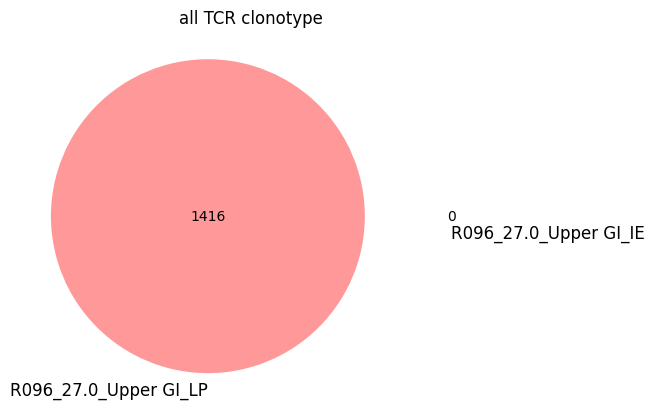

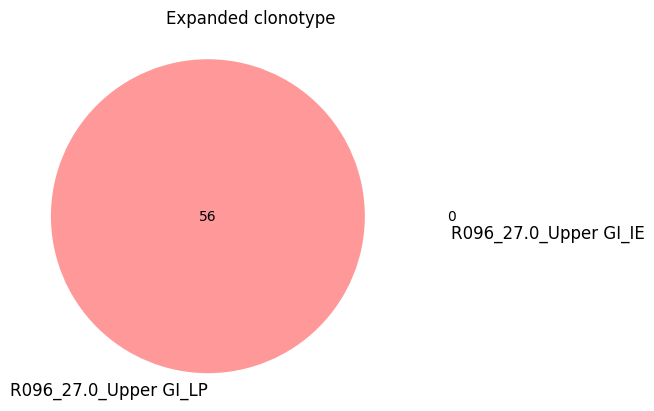

len: 1955
len: 0
R096_27.0_Lower GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:21: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = 'NA'
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/merge.py:1309: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  concat_annot = pd.concat(
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/merge.py:1309: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before t

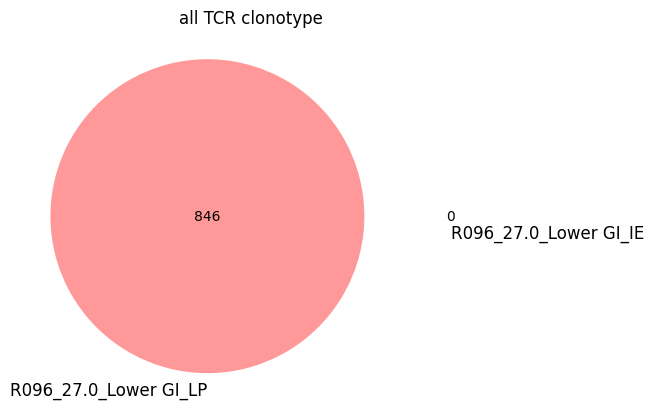

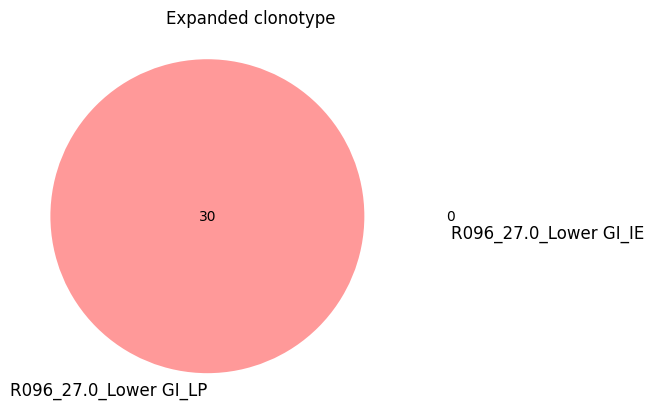

len: 954
len: 0
C155_27.0_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:21: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = 'NA'


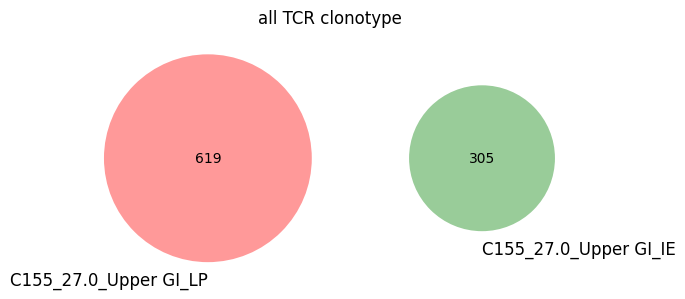

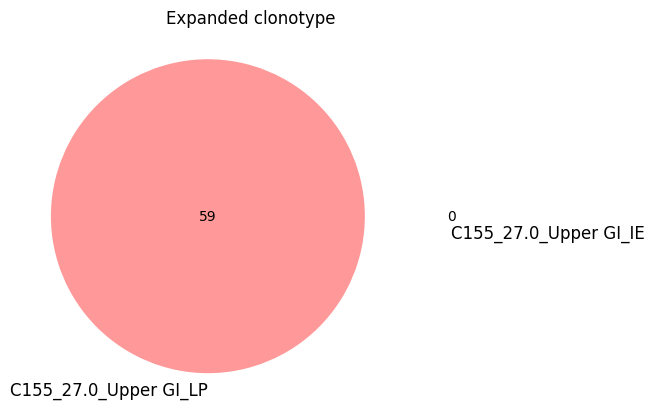

len: 684
len: 305
normal C155_27.0_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


C152_164.0_Upper GI


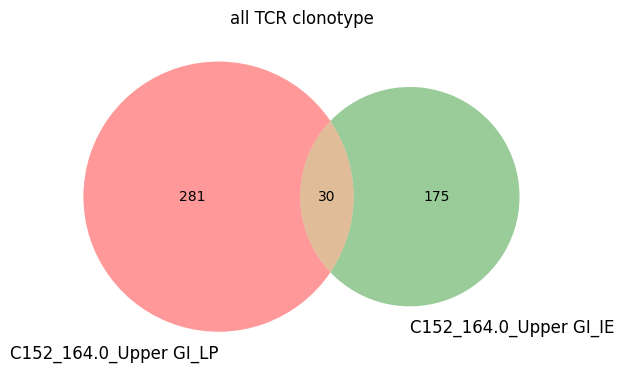

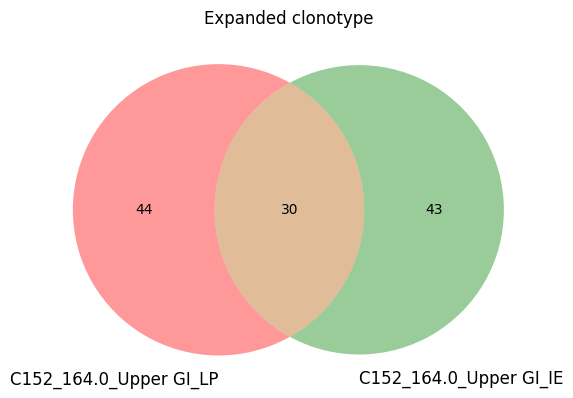

len: 358
len: 308
normal C152_164.0_Upper GI
C152_164.0_Lower GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


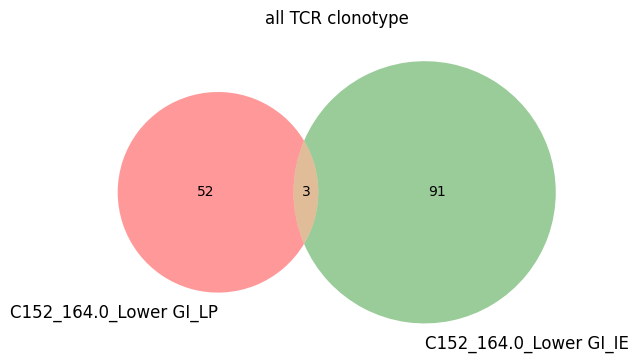

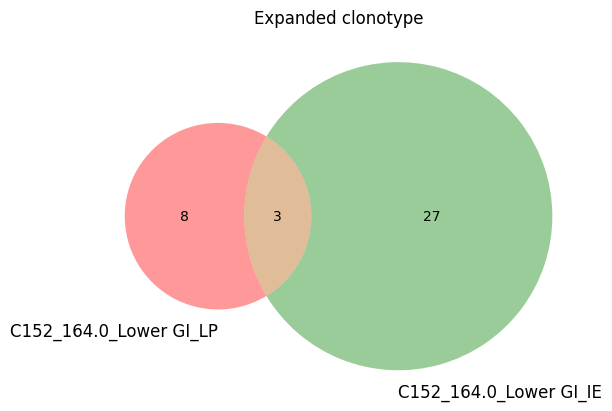

len: 56
len: 113
normal C152_164.0_Lower GI
C159_36.0_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


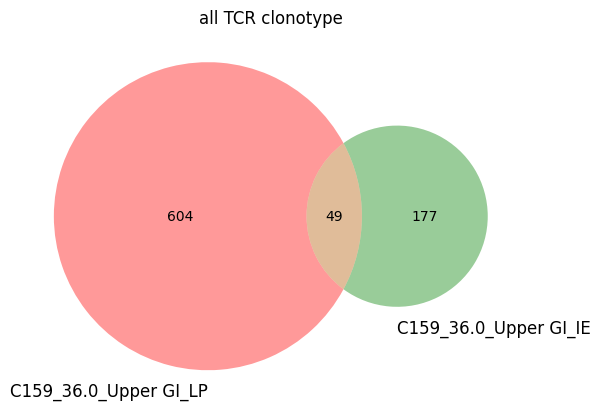

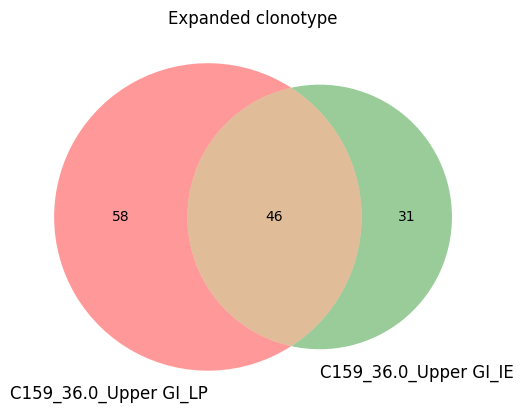

len: 835
len: 275
normal C159_36.0_Upper GI
C159_36.0_Lower GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


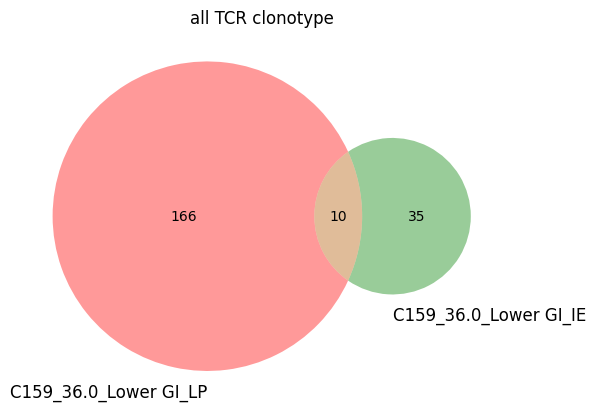

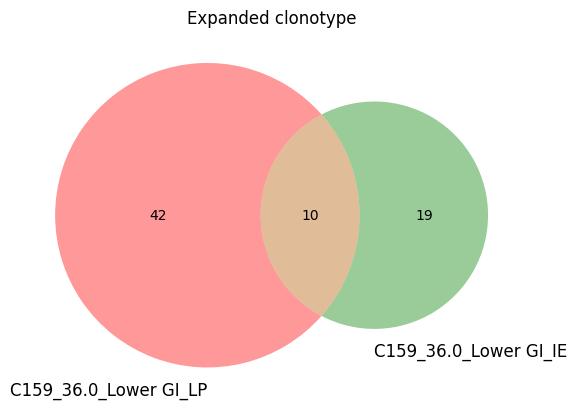

len: 194
len: 54
normal C159_36.0_Lower GI
C162_33.0_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


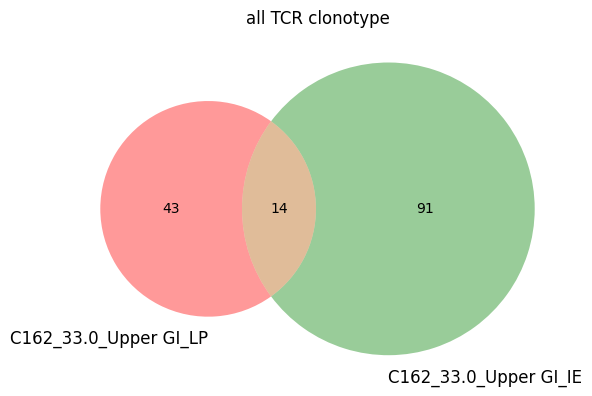

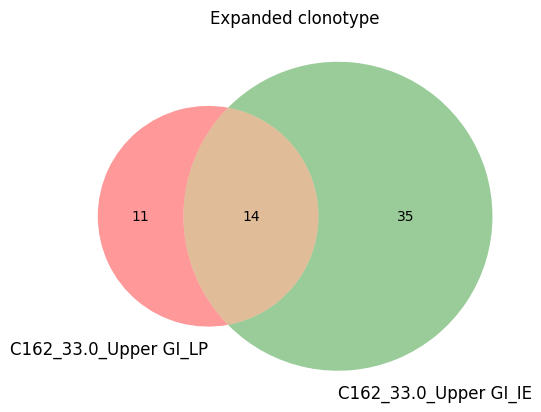

len: 65
len: 147
normal C162_33.0_Upper GI
C162_33.0_Lower GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


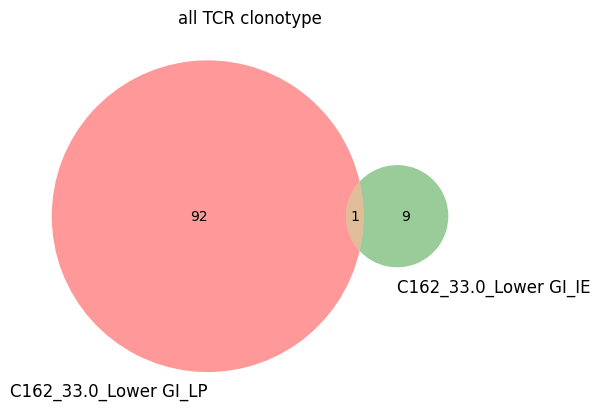

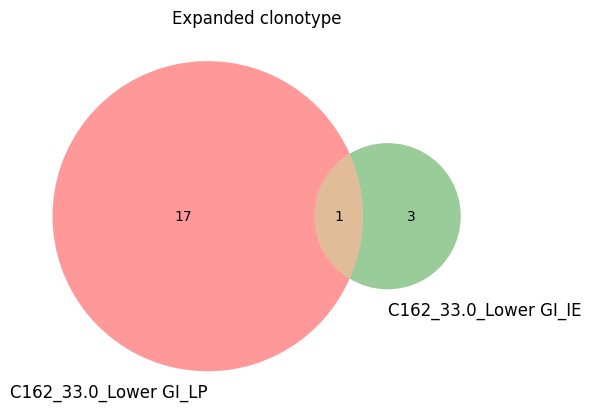

len: 101
len: 10
normal C162_33.0_Lower GI
C068_140.0_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


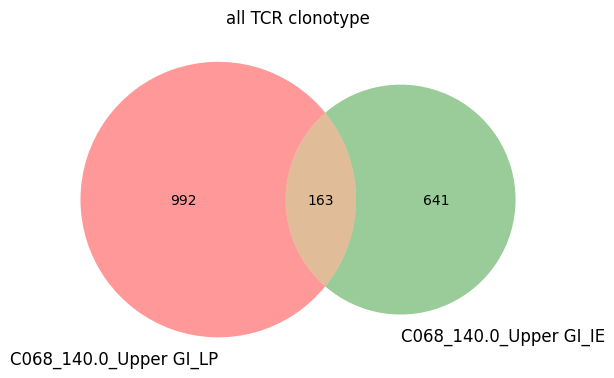

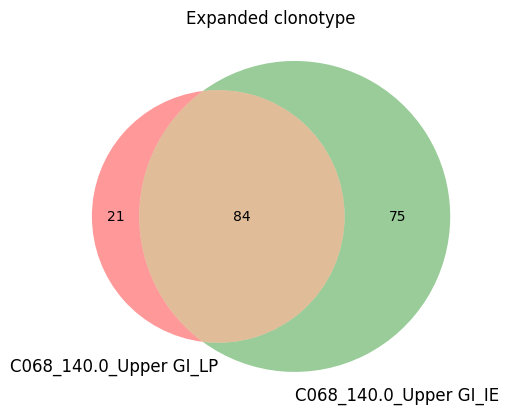

len: 1864
len: 1474
normal C068_140.0_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


C101_32.0_Lower GI


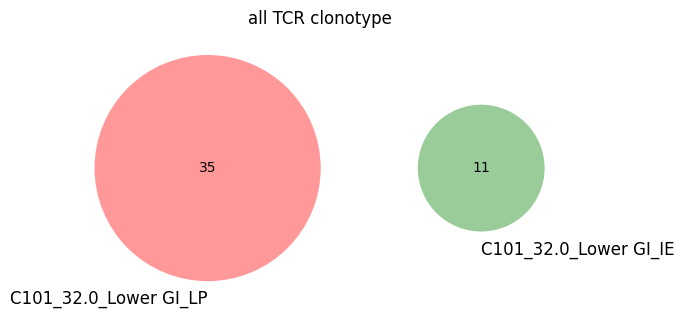

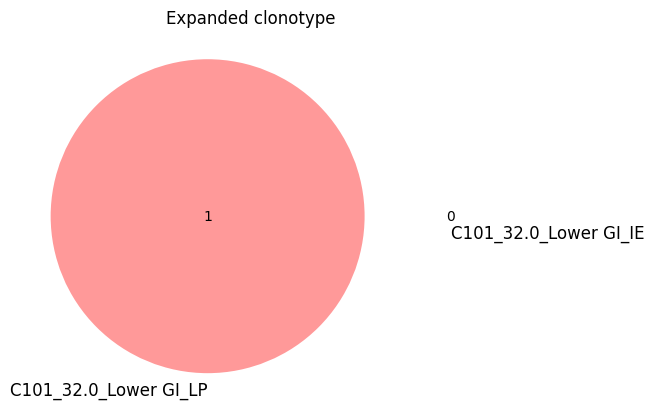

len: 35
len: 11
normal C101_32.0_Lower GI
C157_23.0_Lower GI

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


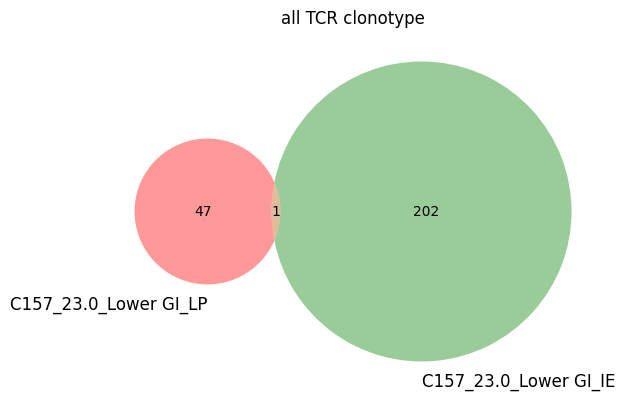

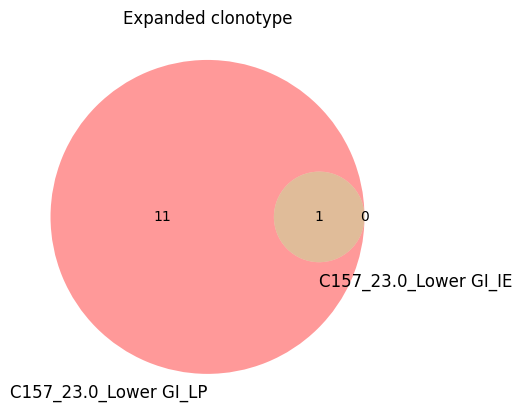

len: 51
len: 203
normal C157_23.0_Lower GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


C157_23.0_Upper GI


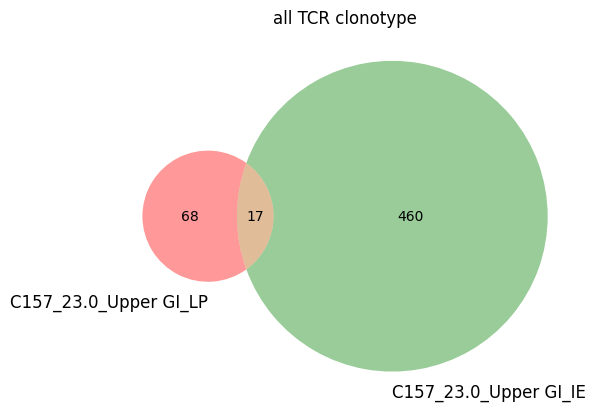

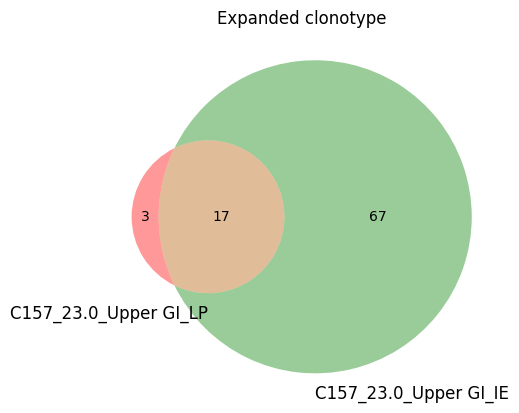

len: 94
len: 936
normal C157_23.0_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


ND001_nan_Upper GI


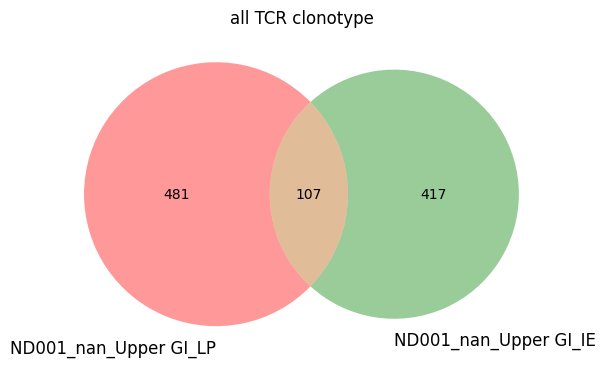

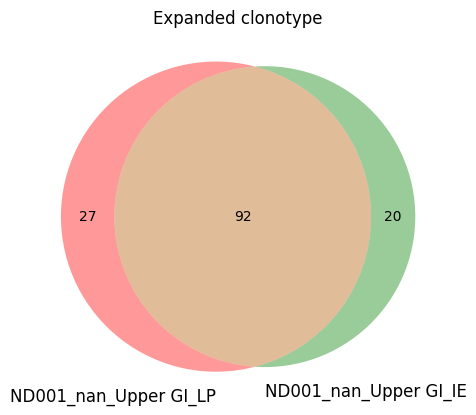

len: 1052
len: 1128
normal ND001_nan_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


ND001_nan_Lower GI


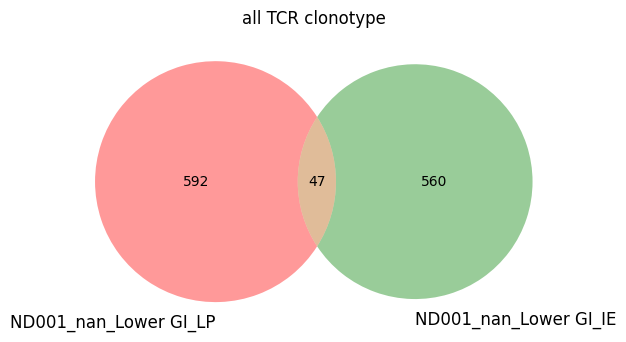

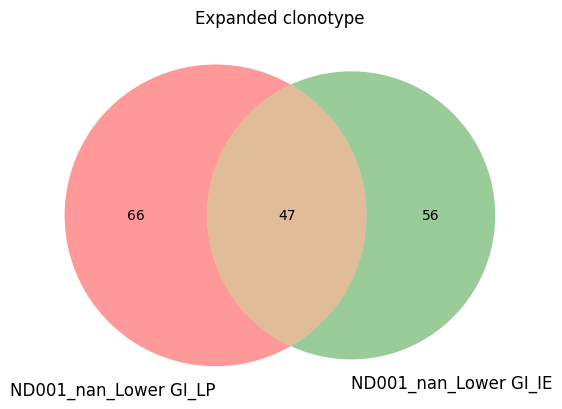

len: 718
len: 712
normal ND001_nan_Lower GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


C98_119.0_Upper GI


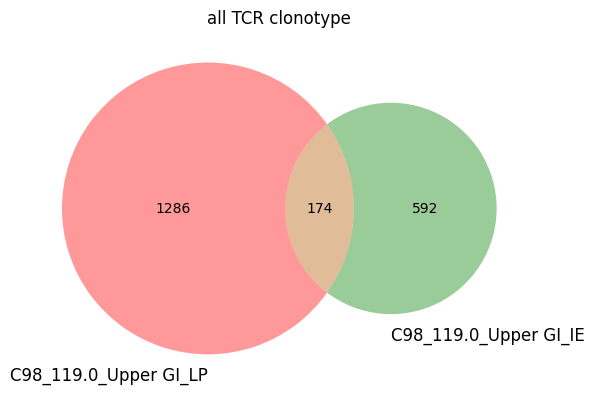

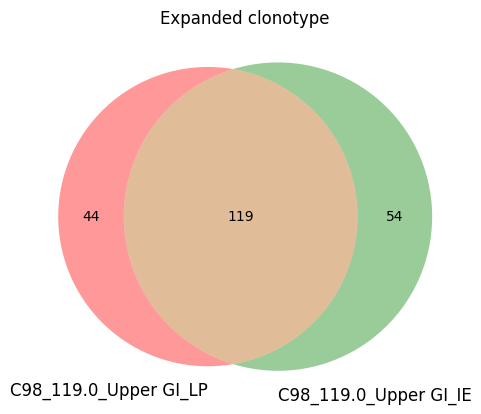

len: 2692
len: 1439
normal C98_119.0_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


C98_119.0_Lower GI


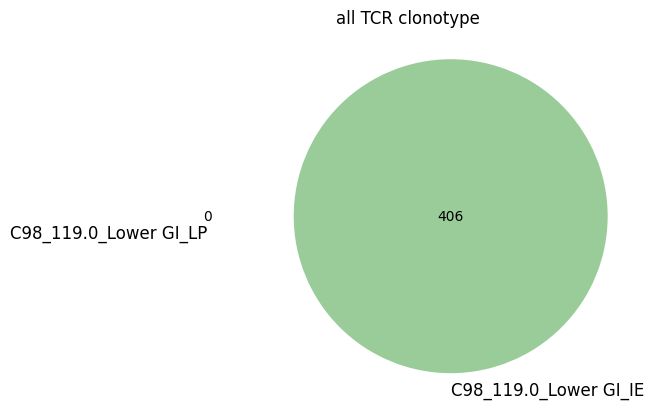

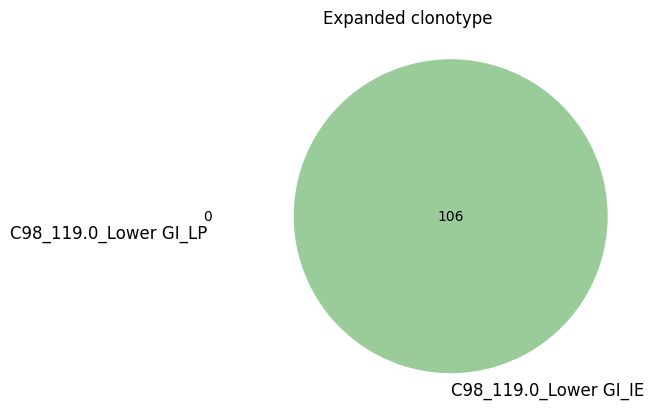

len: 0
len: 762


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:21: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = 'NA'


R085_76.0_Upper GI


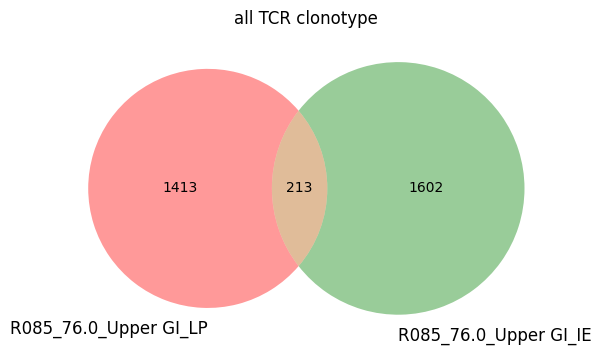

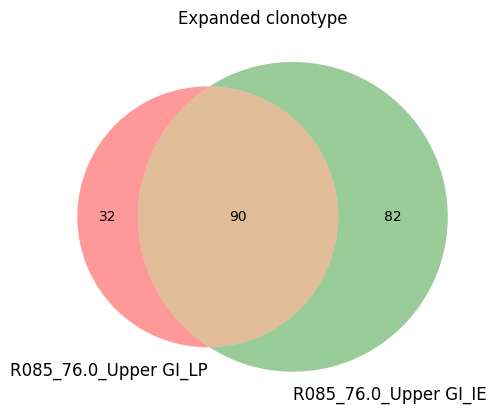

len: 2630
len: 2332
normal R085_76.0_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


C66_375.0_Upper GI


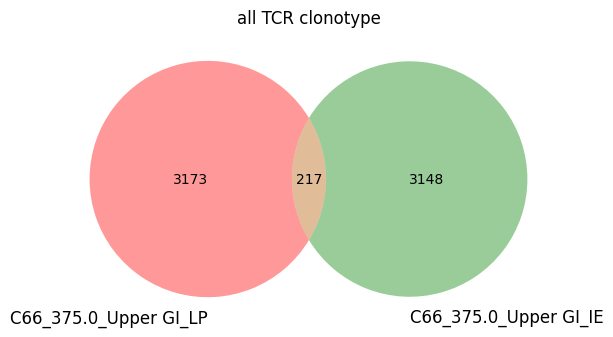

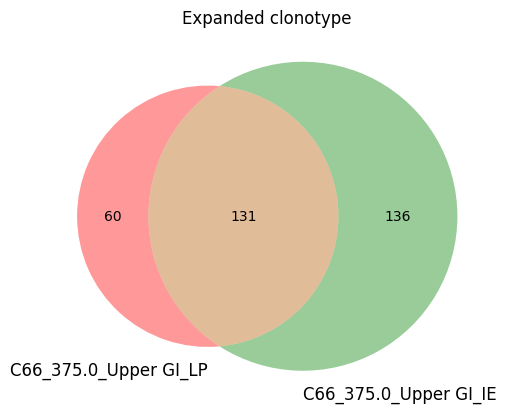

len: 4539
len: 4841
normal C66_375.0_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


C66_444.0_Upper GI


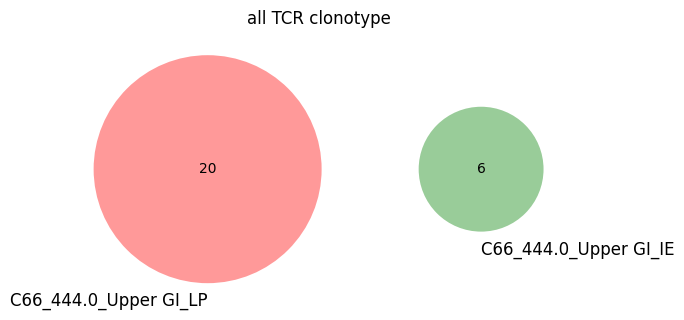

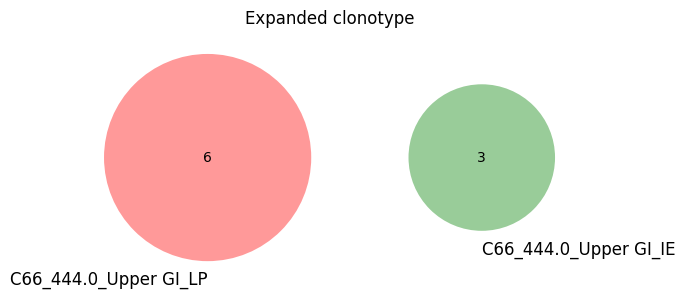

len: 20
len: 6
normal C66_444.0_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


C66_444.0_Lower GI


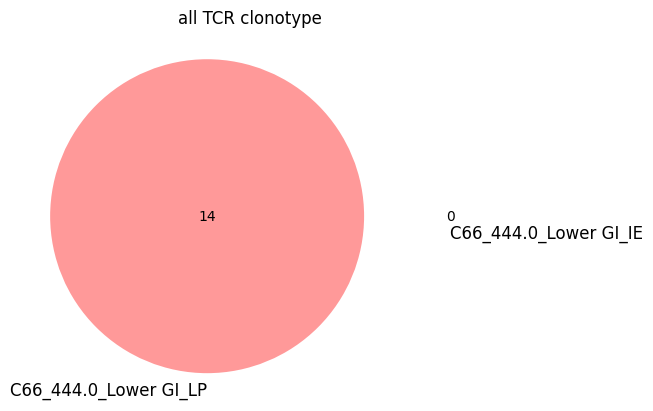

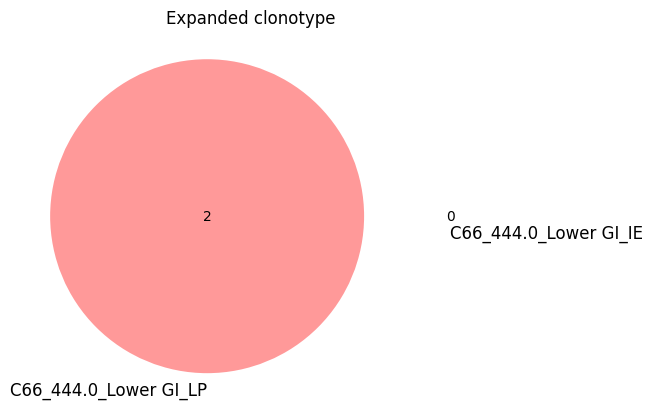

len: 14
len: 0


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:21: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = 'NA'


C86_248.0_Lower GI


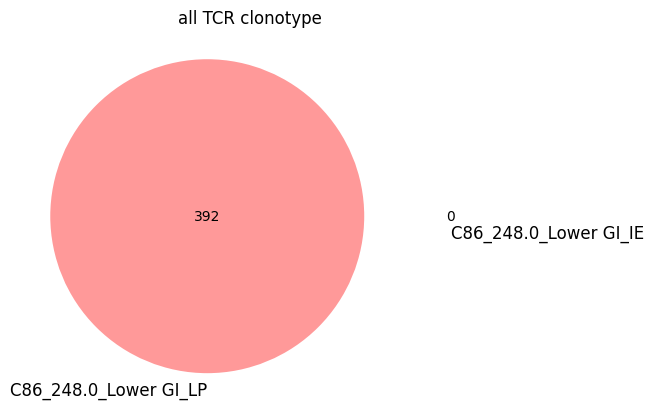

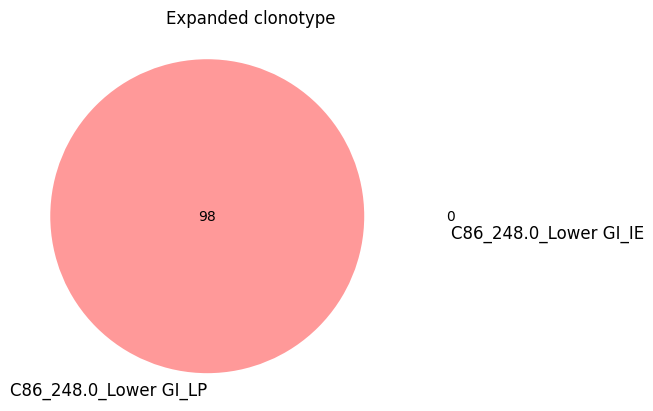

len: 572
len: 0


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:21: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = 'NA'


C160_28.0_Lower GI


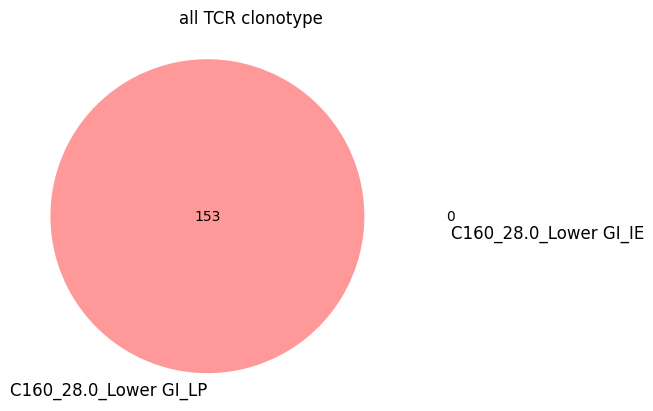

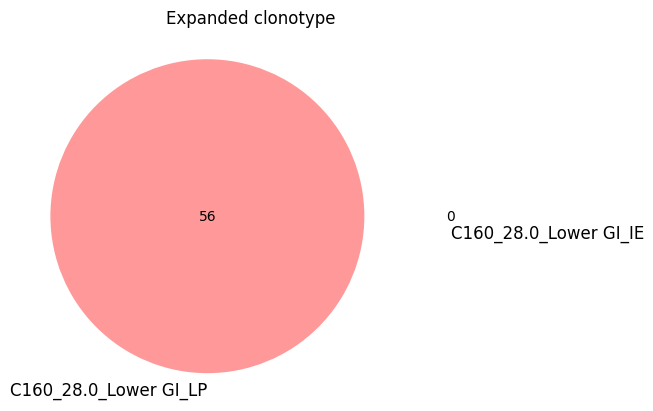

len: 194
len: 0


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:21: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = 'NA'


C160_196.0_Upper GI


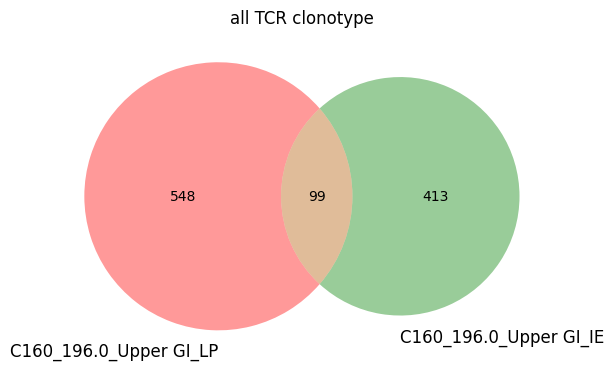

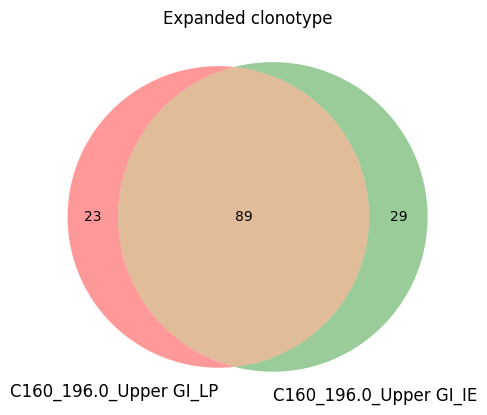

len: 1133
len: 823
normal C160_196.0_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


C179_45.0_Lower GI


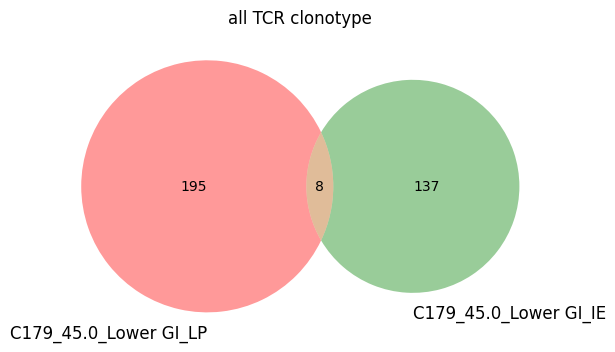

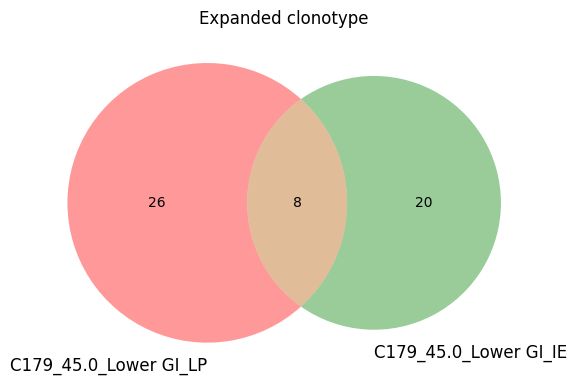

len: 217
len: 152
normal C179_45.0_Lower GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


C179_45.0_Upper GI


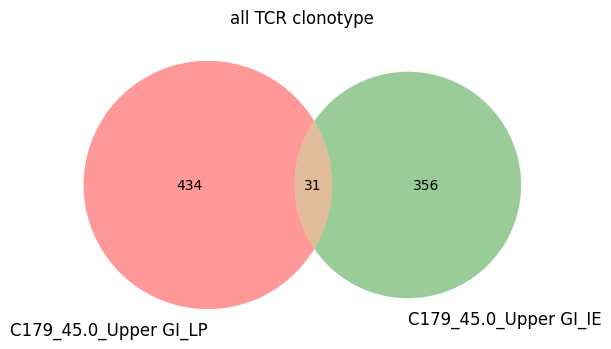

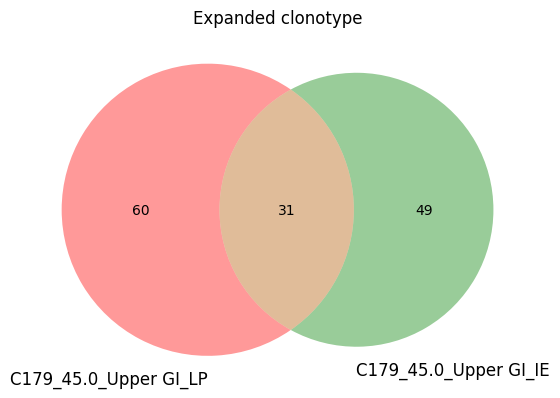

len: 496
len: 408
normal C179_45.0_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


ND003_nan_Lower GI


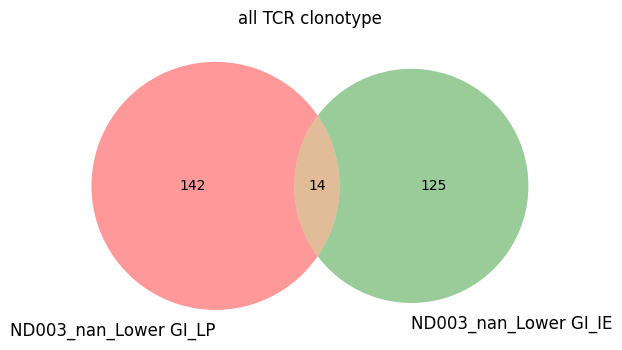

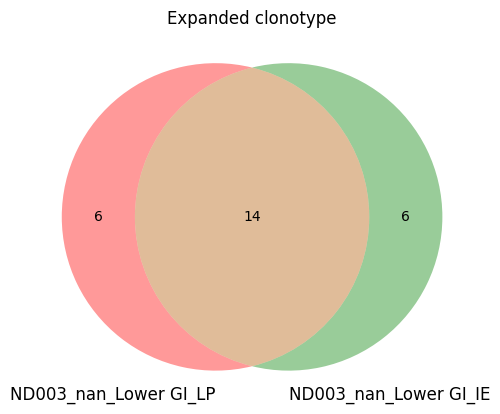

len: 190
len: 184
normal ND003_nan_Lower GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


ND003_nan_Upper GI


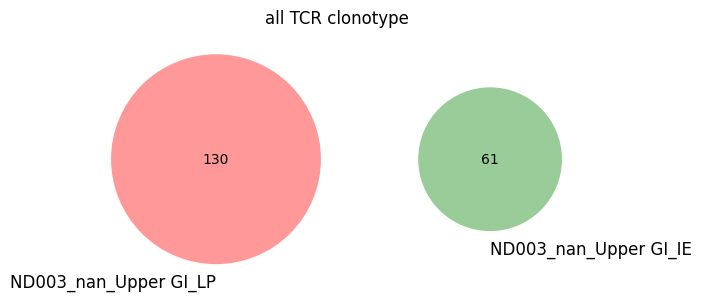

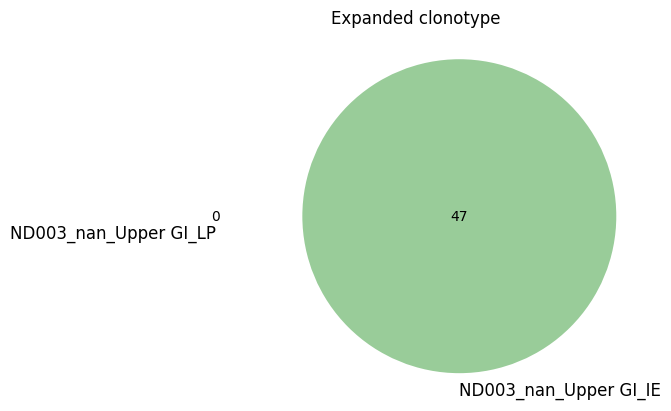

len: 130
len: 73
normal ND003_nan_Upper GI


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2472155097.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  patient_ann.obs['Migration'] = "No_info"


In [29]:
tcell_ann_concat_con2 = tcell_ann_concat[tcell_ann_concat.obs['PatientID'] =="NA"]
for patient in tcell_ann_concat.obs['PatientID_Time_Tissue'].unique():
    print(patient)
    patient_ann = tcell_ann_concat[tcell_ann_concat.obs['PatientID_Time_Tissue']==patient]
    patient_ann_LP = patient_ann[patient_ann.obs['LPorIE']=="Lamina Propria Cells"]
    patient_ann_IE = patient_ann[patient_ann.obs['LPorIE']=="Intraepithelial Cells"]
    expanded_patient_ann = patient_ann[patient_ann.obs["ExpandedorSingleton"] =="Expanded"]
    set_LP = set(patient_ann_LP.obs['cc_aa_identity'].tolist())
    set_IE = set(patient_ann_IE.obs['cc_aa_identity'].tolist())
    venn2([set_LP, set_IE],(patient+"_LP",patient+"_IE"))
    plt.title("all TCR clonotype")
    plt.show()
    set_LP_ex = set(patient_ann_LP[patient_ann_LP.obs["ExpandedorSingleton"] =="Expanded"].obs['cc_aa_identity'].tolist())
    set_IE_ex = set(patient_ann_IE[patient_ann_IE.obs["ExpandedorSingleton"] =="Expanded"].obs['cc_aa_identity'].tolist())
    venn2([set_LP_ex, set_IE_ex],(patient+"_LP",patient+"_IE"))
    plt.title("Expanded clonotype")
    plt.show()
    print('len:',len(patient_ann_LP.obs.index))
    print('len:',len(patient_ann_IE.obs.index))
    if len(patient_ann_LP.obs.index) == 0 or len(patient_ann_IE.obs.index) == 0:
        patient_ann.obs['Migration'] = 'NA'
        patient_ann.obs['Migration_all'] = 'NA'
    else:
        print('normal',patient)
        patient_ann.obs['Migration'] = "No_info"
        
        patient_ann.obs.loc[patient_ann.obs['clone_id']!= "nan","Migration"] = "Not_expanded"
        migrate = set_LP_ex.intersection(set_IE_ex)
        # Step 2: Drop NaN values from the result
        # Convert the set to a list and filter out NaN values
        migrate = {x for x in migrate if pd.notna(x)}
        
        # Display the result without NaN values

        LP_stationary = set_LP_ex.difference(migrate)
        LP_stationary = {x for x in LP_stationary if pd.notna(x)}
        IE_stationary = set_IE_ex.difference(migrate)
        IE_stationary = {x for x in IE_stationary if pd.notna(x)}
        patient_ann.obs.loc[patient_ann.obs['cc_aa_identity'].isin(migrate),"Migration"] = "Mobile"
        patient_ann.obs.loc[patient_ann.obs['cc_aa_identity'].isin(LP_stationary),"Migration"] = "LP_Stationary"
        patient_ann.obs.loc[patient_ann.obs['cc_aa_identity'].isin(IE_stationary),"Migration"] = "IE_Stationary"
        patient_ann.obs['Migration_all'] = "No_info"
        migrate_all = set_LP.intersection(set_IE)
        migrate_all = {x for x in migrate_all if pd.notna(x)}
        LP_stationary_all = set_LP.difference(migrate_all)
        LP_stationary_all = {x for x in LP_stationary_all if pd.notna(x)}
        IE_stationary_all = set_IE.difference(migrate_all)
        IE_stationary_all = {x for x in IE_stationary_all if pd.notna(x)}
        patient_ann.obs.loc[patient_ann.obs['cc_aa_identity'].isin(migrate_all),'Migration_all'] = "Mobile"
        patient_ann.obs.loc[patient_ann.obs['cc_aa_identity'].isin(LP_stationary_all),'Migration_all'] = "LP_Stationary"
        patient_ann.obs.loc[patient_ann.obs['cc_aa_identity'].isin(IE_stationary_all),'Migration_all'] = "IE_Stationary"

    tcell_ann_concat_con2 = ad.concat([tcell_ann_concat_con2, patient_ann], join="outer")


In [30]:
tcell_ann_concat_con2.obs['Migration_all']

R096_Tc17_up_AAACCTGGTTGGAGGT-1         NA
R096_Tc17_up_AAACCTGTCTATCCTA-1         NA
R096_Tc17_up_AAACGGGAGGATGCGT-1         NA
R096_Tc17_up_AAACGGGGTAAATGAC-1         NA
R096_Tc17_up_AAAGATGCAAACTGTC-1         NA
                                    ...   
UA41_TGTTCCGAGGACAGCT-1            No_info
UA41_TTAGGACGTTGTTTGG-1            No_info
UA41_TTAGGACTCCCAAGAT-1            No_info
UA41_TTCGAAGTCCGCATCT-1            No_info
UA41_TTGCGTCCAAGAAAGG-1            No_info
Name: Migration_all, Length: 38539, dtype: object

In [31]:
tcell_ann_concat_tcr

AnnData object with n_obs × n_vars = 28362 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets', 'PatientID_Time', 'PatientID_Tissue_Loc', 'PatientID_Grade', 'PatientID_Grade_Time_Loc', 'T_cell_subsets_plot', 'T_cell_subsets_reordered', 'SampleID_Grade', 'GVHD_Grade', 'leiden_48', 'ptcy', 'PatientID_Grade_Ptcy', 'SampleID_Ptcy', 'receptor_type', 'receptor_subtype', 'chain_pairing', 'clone_id

In [32]:
table = pd.pivot_table(tcell_ann_concat_con2[tcell_ann_concat_con2.obs['PatientID']=="C66"].obs,index = 'Days_post-Transplant',columns= 'Migration',aggfunc='count')
table

B_doublet                                           \
Migration            IE_Stationary LP_Stationary  Mobile    NA Not_expanded   
Days_post-Transplant                                                          
375.0                        396.0         222.0  2003.0   NaN       6759.0   
444.0                          3.0           6.0     NaN  14.0         17.0   

                     Dates_from_Transplantation                              \
Migration                         IE_Stationary LP_Stationary  Mobile    NA   
Days_post-Transplant                                                          
375.0                                     396.0         222.0  2003.0   NaN   
444.0                                       3.0           6.0     NaN  14.0   

                                   ...  total_counts                        \
Migration            Not_expanded  ... IE_Stationary LP_Stationary  Mobile   
Days_post-Transplant               ...                                       
375.0                      6759.0  ...         396.0         222.0  2003.0   
444.0                        17.0  ...           3.0           6.0     NaN   

                                        total_counts_mt                        \
Migration               NA Not_expanded   IE_Stationary LP_Stationary  Mobile   
Days_post-Transplant                                                            
375.0                  NaN       6759.0           396.0         222.0  2003.0   
444.0                 14.0         17.0             3.0           6.0     NaN   

                                         
Migration               NA Not_expanded  
Days_post-Transplant                     
375.0                  NaN       6759.0  
444.0                 14.0         17.0  

[2 rows x 295 columns]

In [33]:
if list(tcell_ann_concat.obs.index) == list(tcell_ann_concat_con2[tcell_ann_concat.obs.index].obs.index):
    print("The lists are identical")
else:
    print("The lists are not identical")

The lists are identical


In [34]:
tcell_ann_concat_con2 = tcell_ann_concat_con2[tcell_ann_concat.obs.index]

In [35]:
tcell_ann_concat.obs['Migration'] = tcell_ann_concat_con2.obs['Migration'] 
tcell_ann_concat.obs['Migration_all'] = tcell_ann_concat_con2.obs['Migration_all'] 


In [36]:
tcell_ann_concat.obs['Migration_all'] 

R096_Tc17_up_AAACCTGGTTGGAGGT-1         NA
R096_Tc17_up_AAACCTGTCTATCCTA-1         NA
R096_Tc17_up_AAACGGGAGGATGCGT-1         NA
R096_Tc17_up_AAACGGGGTAAATGAC-1         NA
R096_Tc17_up_AAAGATGCAAACTGTC-1         NA
                                    ...   
UA41_TGTTCCGAGGACAGCT-1            No_info
UA41_TTAGGACGTTGTTTGG-1            No_info
UA41_TTAGGACTCCCAAGAT-1            No_info
UA41_TTCGAAGTCCGCATCT-1            No_info
UA41_TTGCGTCCAAGAAAGG-1            No_info
Name: Migration_all, Length: 38539, dtype: object

In [37]:
tcell_ann_concat.obs['Migration'] 

R096_Tc17_up_AAACCTGGTTGGAGGT-1              NA
R096_Tc17_up_AAACCTGTCTATCCTA-1              NA
R096_Tc17_up_AAACGGGAGGATGCGT-1              NA
R096_Tc17_up_AAACGGGGTAAATGAC-1              NA
R096_Tc17_up_AAAGATGCAAACTGTC-1              NA
                                       ...     
UA41_TGTTCCGAGGACAGCT-1            Not_expanded
UA41_TTAGGACGTTGTTTGG-1            Not_expanded
UA41_TTAGGACTCCCAAGAT-1            Not_expanded
UA41_TTCGAAGTCCGCATCT-1            Not_expanded
UA41_TTGCGTCCAAGAAAGG-1            Not_expanded
Name: Migration, Length: 38539, dtype: object

expanded_ann.obs["Migration"] = "LP_Stationary"
expanded_ann.obs.loc[expanded_ann.obs['cc_aa_alignment_same_v'].isin(migrate),"Migration"] = "Mobile"
expanded_ann.obs.loc[expanded_ann.obs['cc_aa_alignment_same_v'].isin(IE_stationary),"Migration"] = "IE_Stationary"
Mob = expanded_ann[expanded_ann.obs['Migration'] =="Mobile"].obs['cc_aa_alignment_same_v'].values
LP_Sta = expanded_ann[expanded_ann.obs['Migration'] =="LP_Stationary"].obs['cc_aa_alignment_same_v'].values
IE_Sta = expanded_ann[expanded_ann.obs['Migration'] =="IE_Stationary"].obs['cc_aa_alignment_same_v'].values

tcell_ann_concat.obs['Migration'] = "Not_expanded"
tcell_ann_concat.obs.loc[tcell_ann_concat.obs['cc_aa_alignment_same_v'].isin(Mob),"Migration"] = "Mobile"
tcell_ann_concat.obs.loc[tcell_ann_concat.obs['cc_aa_alignment_same_v'].isin(LP_Sta),"Migration"] = "LP_Stationary"
tcell_ann_concat.obs.loc[tcell_ann_concat.obs['cc_aa_alignment_same_v'].isin(IE_Sta),"Migration"] = "IE_Stationary"
tcell_ann_concat.obs.loc[tcell_ann_concat.obs['PatientID']== "R096","Migration"] = "R096"

In [38]:
tcell_ann_concat_con2.obs['Migration'].unique()

array(['NA', 'Not_expanded', 'LP_Stationary', 'Mobile', 'IE_Stationary'],
      dtype=object)

In [39]:
tcell_ann_concat_con2.obs['Migration_all'].unique()

array(['NA', 'LP_Stationary', 'No_info', 'Mobile', 'IE_Stationary'],
      dtype=object)

In [40]:
tcell_ann_concat_sel = tcell_ann_concat_con2[tcell_ann_concat_con2.obs['Migration'].isin(['LP_Stationary','IE_Stationary','Mobile'])]

In [41]:
tcell_ann_concat_sel_all = tcell_ann_concat_con2[tcell_ann_concat_con2.obs['Migration_all'].isin(['LP_Stationary','IE_Stationary','Mobile'])]

In [42]:
tcell_ann_concat_sel.obs['Migration']

RH01_AACTCAGGTACCCAAT-1    LP_Stationary
RH01_AACTCTTTCATTATCC-1    LP_Stationary
RH01_AACTTTCCAGACTCGC-1    LP_Stationary
RH01_AAGACCTGTCTCTCGT-1    LP_Stationary
RH01_AATCGGTCATCCCACT-1    LP_Stationary
                               ...      
UA40_TGAGCATAGCGGCTTC-1    IE_Stationary
UA40_TGATTTCAGGCCGAAT-1    IE_Stationary
UA40_TGCCCTAAGTTGTCGT-1    IE_Stationary
UA40_TGGGAAGAGGTGACCA-1    IE_Stationary
UA40_TTGAACGGTTCAACCA-1    IE_Stationary
Name: Migration, Length: 12777, dtype: object

In [43]:
tcell_ann_concat_sel

View of AnnData object with n_obs × n_vars = 12777 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets', 'PatientID_Time', 'PatientID_Tissue_Loc', 'PatientID_Grade', 'PatientID_Grade_Time_Loc', 'T_cell_subsets_plot', 'T_cell_subsets_reordered', 'SampleID_Grade', 'GVHD_Grade', 'leiden_48', 'ptcy', 'PatientID_Grade_Ptcy', 'SampleID_Ptcy', 'receptor_type', 'receptor_subtype', 'chain_pairing', '

In [44]:
tcell_ann_concat_con2

View of AnnData object with n_obs × n_vars = 38539 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets', 'PatientID_Time', 'PatientID_Tissue_Loc', 'PatientID_Grade', 'PatientID_Grade_Time_Loc', 'T_cell_subsets_plot', 'T_cell_subsets_reordered', 'SampleID_Grade', 'GVHD_Grade', 'leiden_48', 'ptcy', 'PatientID_Grade_Ptcy', 'SampleID_Ptcy', 'receptor_type', 'receptor_subtype', 'chain_pairing', '

In [45]:
tcell_ann_concat_sel_all.obs['Migration_all']

RH01_AAACCTGGTTCACCTC-1    LP_Stationary
RH01_AAACGGGAGACAGAGA-1    LP_Stationary
RH01_AAACGGGAGATGCCTT-1    LP_Stationary
RH01_AAACGGGGTTATCCGA-1    LP_Stationary
RH01_AAAGATGAGTTAGGTA-1    LP_Stationary
                               ...      
UA40_TGAGCATAGCGGCTTC-1    IE_Stationary
UA40_TGATTTCAGGCCGAAT-1    IE_Stationary
UA40_TGCCCTAAGTTGTCGT-1    IE_Stationary
UA40_TGGGAAGAGGTGACCA-1    IE_Stationary
UA40_TTGAACGGTTCAACCA-1    IE_Stationary
Name: Migration_all, Length: 24517, dtype: object

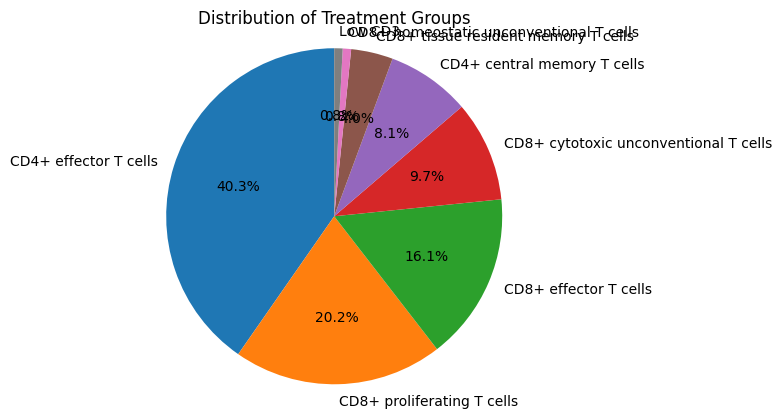

In [46]:
C179= tcell_ann_concat_sel_all[tcell_ann_concat_sel_all.obs['PatientID']=='C179']
C179_mob= C179[C179.obs['Migration_all'] =='Mobile']

treatment_counts = C179_mob.obs['T_cell_subsets'].value_counts()

plt.pie(treatment_counts, labels=treatment_counts.index, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Distribution of Treatment Groups')
plt.show()

In [47]:
C179.obs['Migration_all']

UA34_AAACGGGGTTATGCGT-1    IE_Stationary
UA34_AAAGATGCAGGTCGTC-1           Mobile
UA34_AAATGCCAGAGTGAGA-1    IE_Stationary
UA34_AACCGCGGTGAGGGAG-1    IE_Stationary
UA34_AACGTTGAGGGTCTCC-1    IE_Stationary
                               ...      
UA37_TTCCCAGTCGCCTGAG-1    LP_Stationary
UA37_TTCGAAGGTAAATGAC-1    LP_Stationary
UA37_TTTACTGAGTGAACGC-1    LP_Stationary
UA37_TTTACTGCAGAGCCAA-1    LP_Stationary
UA37_TTTGGTTGTCTGCGGT-1    LP_Stationary
Name: Migration_all, Length: 999, dtype: object

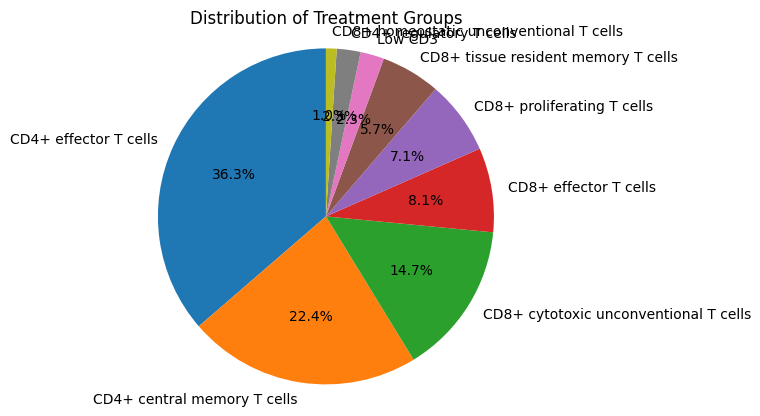

In [48]:

C179_sta= C179[C179.obs['Migration_all'].isin(['IE_Stationary', 'LP_Stationary'])]



treatment_counts = C179_sta.obs['T_cell_subsets'].value_counts()

plt.pie(treatment_counts, labels=treatment_counts.index, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Distribution of Treatment Groups')
plt.show()

C155


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

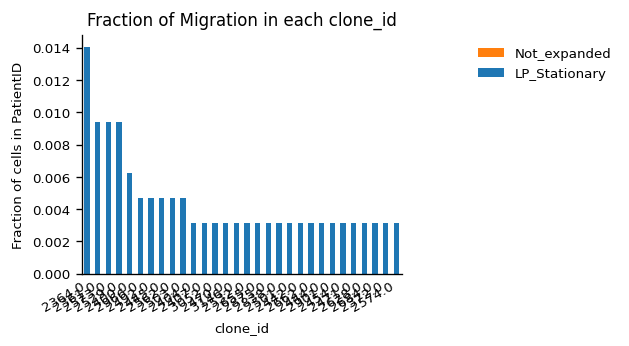

C101


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

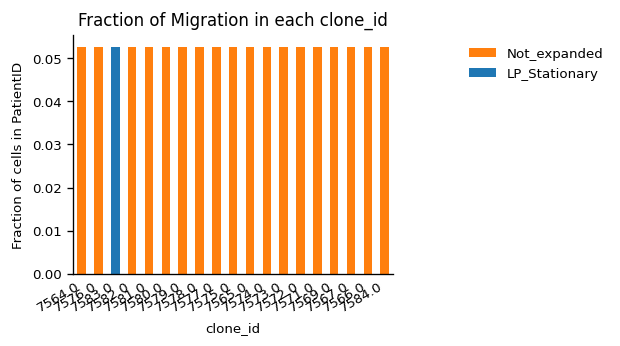

C162


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

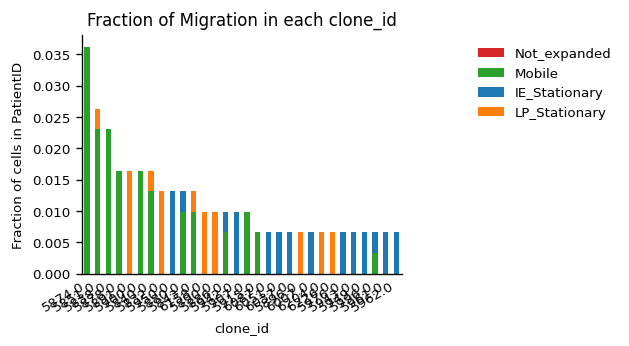

C157


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

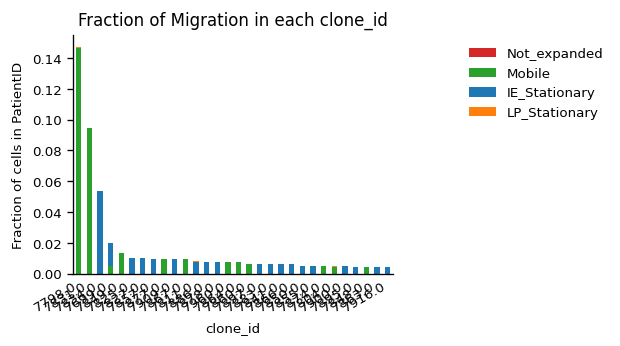

/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)


R085


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view

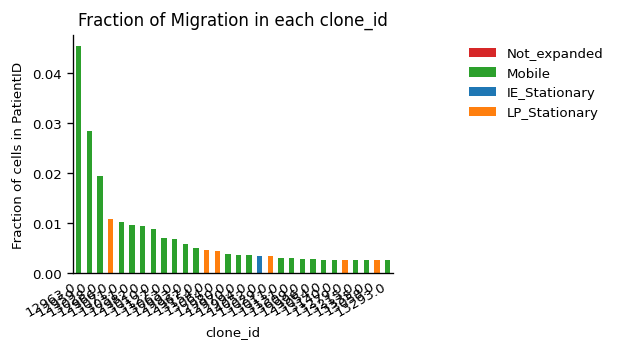

C179


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

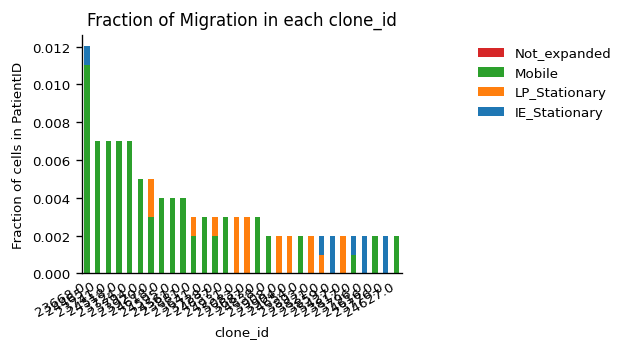

C160


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

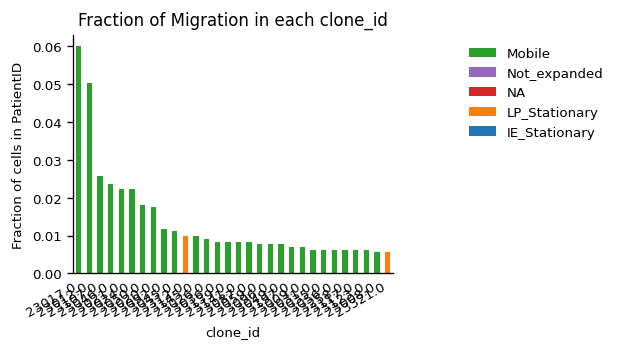

C159


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

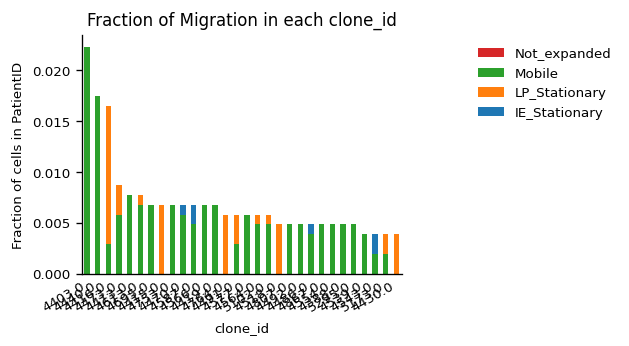

C152


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

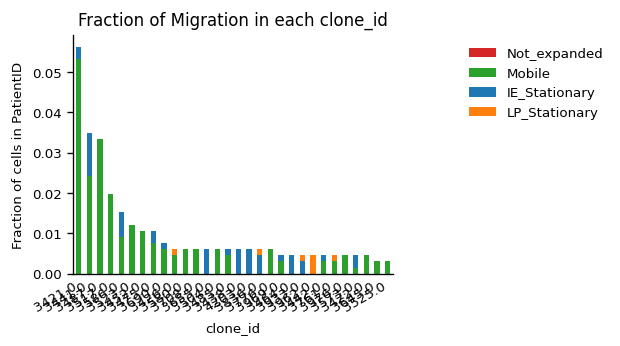

C068


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

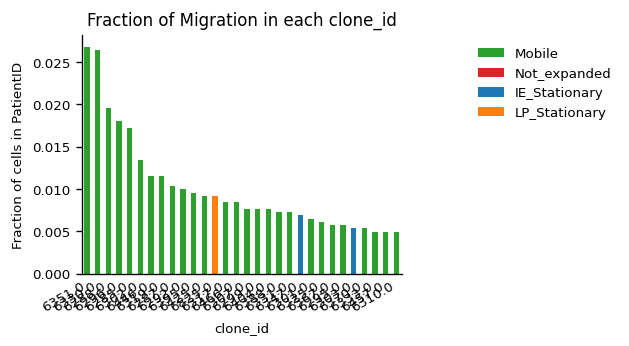

C98


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

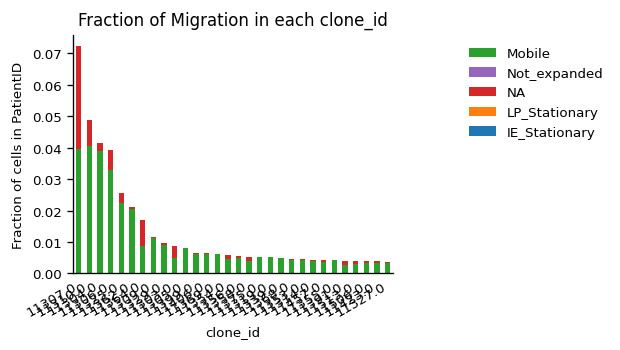

C66


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

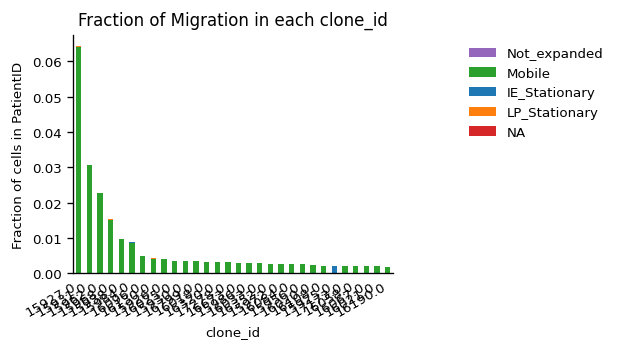

ND001


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

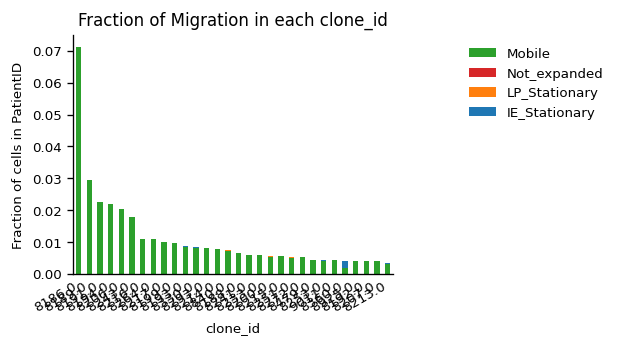

ND003


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

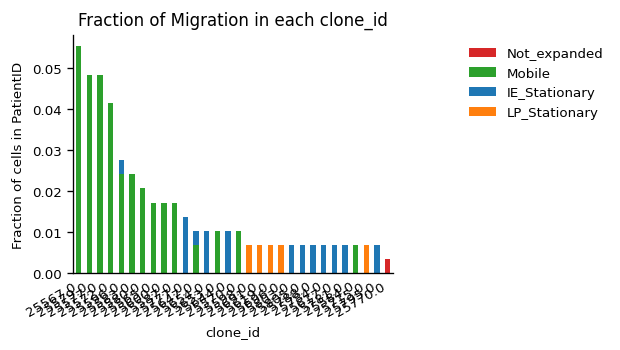

In [49]:
Patients_list = ['C155','C101','C162','C157','R085','C179','C160','C159','C152','C068','C98','C66','ND001','ND003']
for patient in Patients_list:
    print(patient)
    vars()["tcell_ann_concat" + str(patient)] = tcell_ann_concat_con2[tcell_ann_concat_con2.obs["PatientID"]==patient]
    ir.pl.group_abundance(vars()["tcell_ann_concat" + str(patient)], groupby="clone_id", target_col="Migration", max_cols=30,normalize="PatientID")
    plt.show()
 
    #axs.hist(vars()["tcell_ann_concat" + str(patient)].obs['clone_id_size'], bins = 100)
    

C155


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

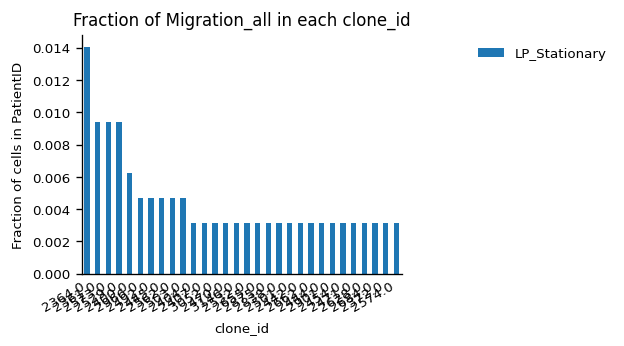

C101


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

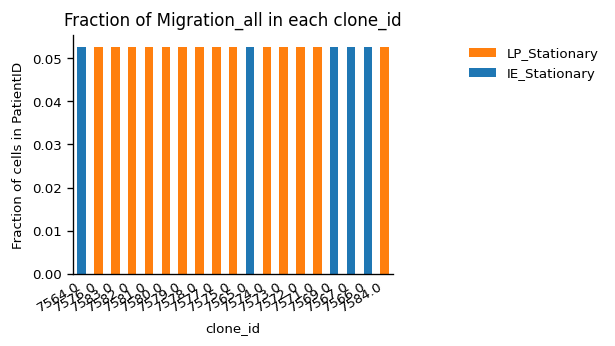

C162


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

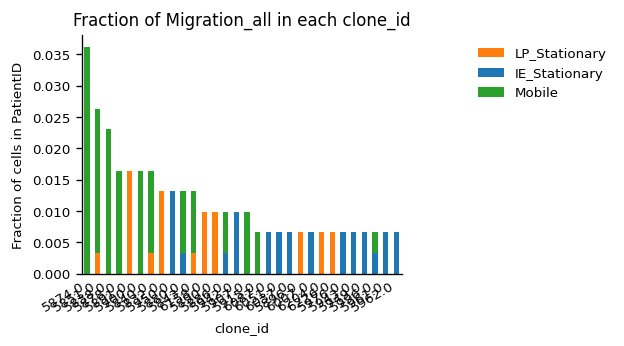

C157


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

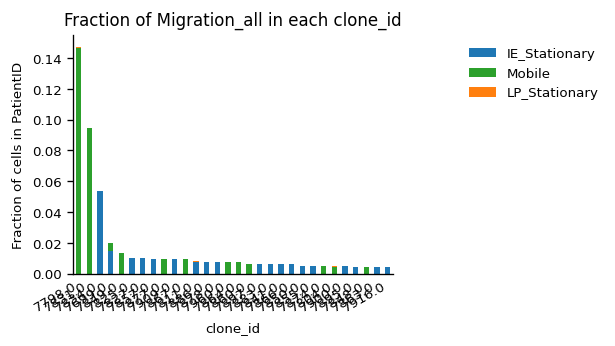

/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)


R085


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view

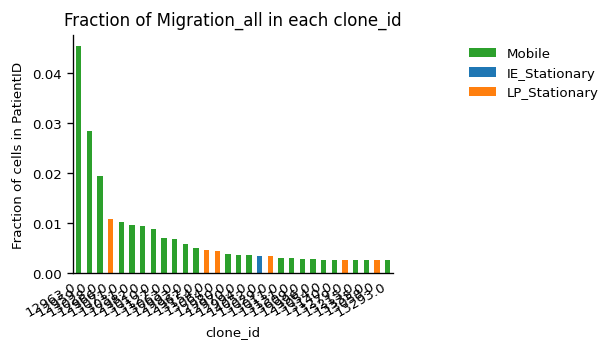

/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

C179


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


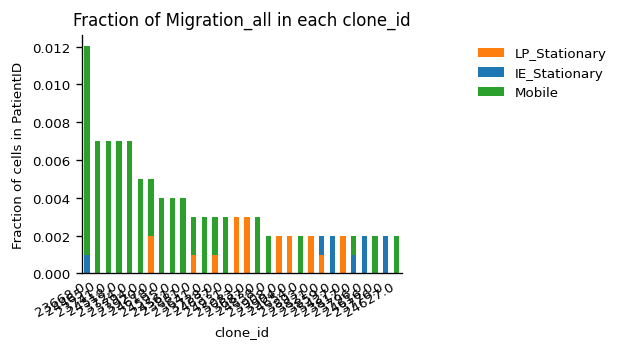

C160


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

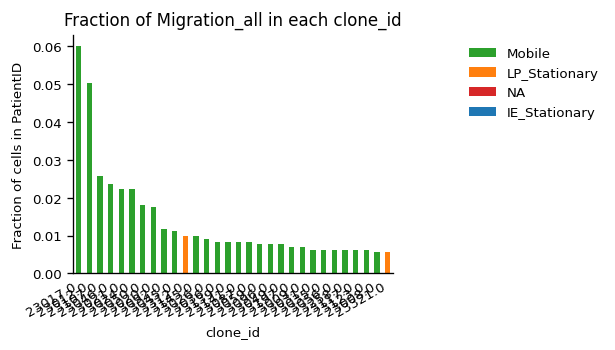

/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

C159


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


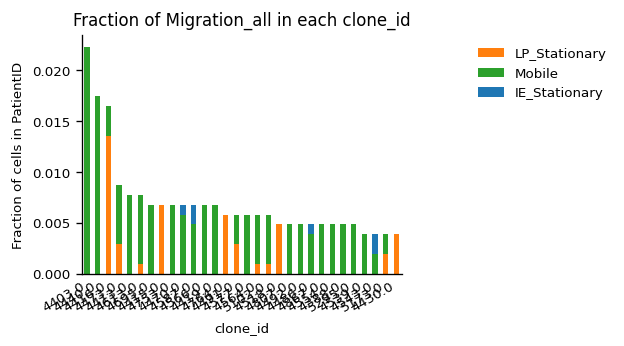

/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

C152


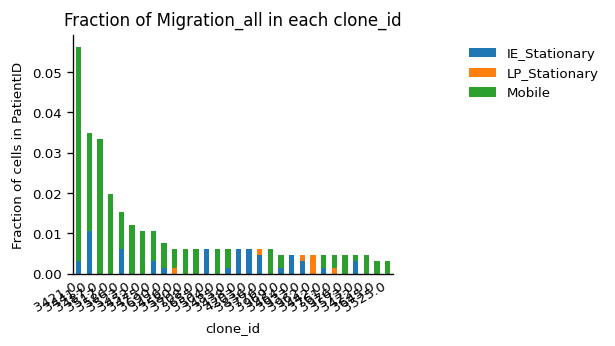

C068


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

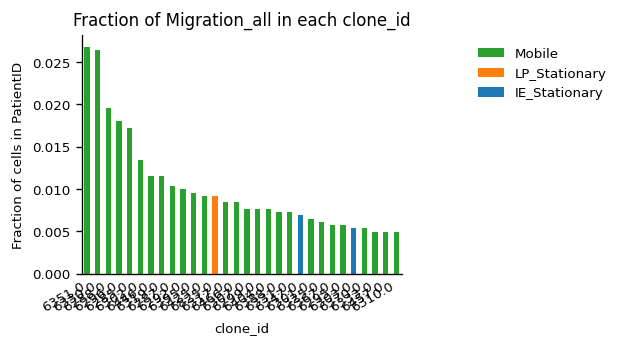

C98


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

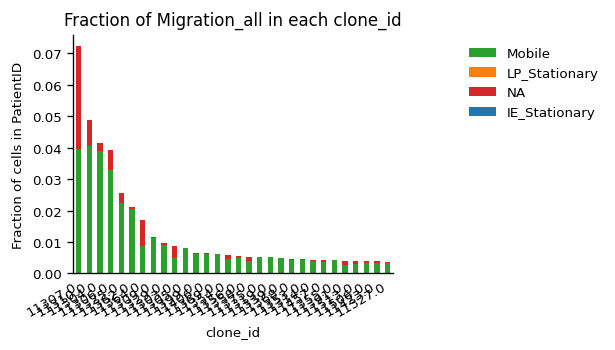

C66


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

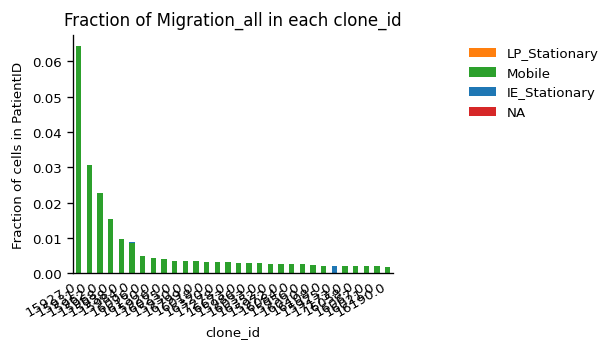

ND001


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

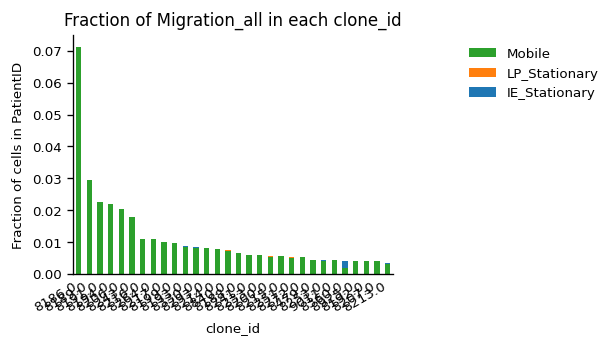

ND003


/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/scirpy/util/__init__.py:458: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return 1 / cast(np.ndarray, obs.groupby(normalize_col)[normalize_col].transform("count").values)
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs

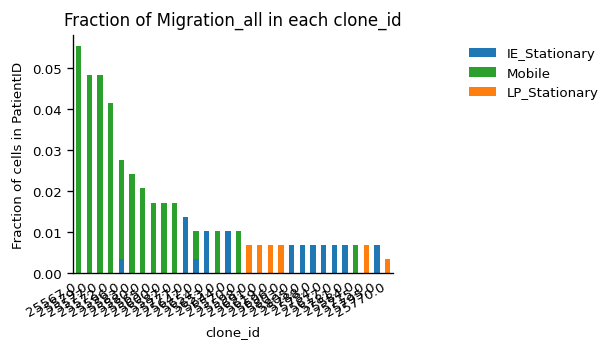

In [50]:
Patients_list = ['C155','C101','C162','C157','R085','C179','C160','C159','C152','C068','C98','C66','ND001','ND003']
for patient in Patients_list:
    print(patient)
    vars()["tcell_ann_concat" + str(patient)] = tcell_ann_concat_con2[tcell_ann_concat_con2.obs["PatientID"]==patient]
    ir.pl.group_abundance(vars()["tcell_ann_concat" + str(patient)], groupby="clone_id", target_col="Migration_all", max_cols=30,normalize="PatientID")
    plt.show()

In [51]:
#make 'clone_id' category
tcell_ann_concat.obs['clone_id_size'] = tcell_ann_concat.obs['clone_id_size'].astype('category')

In [52]:
tcell_ann_concat_con2.obs['Migration'].unique()

array(['NA', 'Not_expanded', 'LP_Stationary', 'Mobile', 'IE_Stationary'],
      dtype=object)

In [53]:
tcell_ann_concat.obs['Dates_from_Transplantation'].unique()

array([   0., -102.,    2.,   -9.,   11.,   nan,   84.,  -88.,   69.,
        218.,  168.])

In [54]:
tcell_ann_concat_sel.obs["Migration"]=tcell_ann_concat_sel.obs["Migration"].astype("category")
tcell_ann_concat_sel.obs["PatientID"]=tcell_ann_concat_sel.obs["PatientID"].astype("category")
tcell_ann_concat_sel.obs['PatientID_Time_Tissue']= tcell_ann_concat_sel.obs['PatientID_Time_Tissue'].astype("category")
#tcell_ann_concat_sel.obs['PatientID_TimeOS_Tissue']= tcell_ann_concat_sel.obs['PatientID_TimeOS_Tissue'].astype("category")
#tcell_ann_concat_sel.obs['PatientID_Timediff_Tissue']= tcell_ann_concat_sel.obs['PatientID_Timediff_Tissue'].astype("category")

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/1852248298.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_ann_concat_sel.obs["Migration"]=tcell_ann_concat_sel.obs["Migration"].astype("category")


In [55]:
tcell_ann_concat_sel_all.obs["Migration_all"] = tcell_ann_concat_sel_all.obs["Migration_all"].astype("category")
tcell_ann_concat_sel_all.obs['PatientID_Time_Tissue']= tcell_ann_concat_sel_all.obs['PatientID_Time_Tissue'].astype("category")

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/3453815956.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_ann_concat_sel_all.obs["Migration_all"] = tcell_ann_concat_sel_all.obs["Migration_all"].astype("category")


In [56]:
tcell_ann_concat_sel_Upper = tcell_ann_concat_sel[tcell_ann_concat_sel.obs['Tissue_Location']=='Upper GI']
tcell_ann_concat_sel_Lower = tcell_ann_concat_sel[tcell_ann_concat_sel.obs['Tissue_Location']=='Lower GI']

In [57]:
tcell_ann_concat_sel_all_Upper = tcell_ann_concat_sel_all[tcell_ann_concat_sel_all.obs['Tissue_Location']=='Upper GI']
tcell_ann_concat_sel_all_Lower = tcell_ann_concat_sel_all[tcell_ann_concat_sel_all.obs['Tissue_Location']=='Lower GI']

In [58]:
tcell_ann_concat_sel_all_Upper 

View of AnnData object with n_obs × n_vars = 22234 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets', 'PatientID_Time', 'PatientID_Tissue_Loc', 'PatientID_Grade', 'PatientID_Grade_Time_Loc', 'T_cell_subsets_plot', 'T_cell_subsets_reordered', 'SampleID_Grade', 'GVHD_Grade', 'leiden_48', 'ptcy', 'PatientID_Grade_Ptcy', 'SampleID_Ptcy', 'receptor_type', 'receptor_subtype', 'chain_pairing', '

In [59]:
list(tcell_ann_concat_sel.obs['PatientID_Time_Tissue'].unique())

['C155_27.0_Upper GI',
 'C152_164.0_Upper GI',
 'C152_164.0_Lower GI',
 'C159_36.0_Upper GI',
 'C159_36.0_Lower GI',
 'C162_33.0_Upper GI',
 'C162_33.0_Lower GI',
 'C068_140.0_Upper GI',
 'C101_32.0_Lower GI',
 'C157_23.0_Lower GI',
 'C157_23.0_Upper GI',
 'ND001_nan_Upper GI',
 'ND001_nan_Lower GI',
 'C98_119.0_Upper GI',
 'R085_76.0_Upper GI',
 'C66_375.0_Upper GI',
 'C66_444.0_Upper GI',
 'C160_196.0_Upper GI',
 'C179_45.0_Lower GI',
 'C179_45.0_Upper GI',
 'ND003_nan_Lower GI',
 'ND003_nan_Upper GI']

In [60]:
list(tcell_ann_concat_sel_all.obs['PatientID_Time_Tissue'].unique())

['C155_27.0_Upper GI',
 'C152_164.0_Upper GI',
 'C152_164.0_Lower GI',
 'C159_36.0_Upper GI',
 'C159_36.0_Lower GI',
 'C162_33.0_Upper GI',
 'C162_33.0_Lower GI',
 'C068_140.0_Upper GI',
 'C101_32.0_Lower GI',
 'C157_23.0_Lower GI',
 'C157_23.0_Upper GI',
 'ND001_nan_Upper GI',
 'ND001_nan_Lower GI',
 'C98_119.0_Upper GI',
 'R085_76.0_Upper GI',
 'C66_375.0_Upper GI',
 'C66_444.0_Upper GI',
 'C160_196.0_Upper GI',
 'C179_45.0_Lower GI',
 'C179_45.0_Upper GI',
 'ND003_nan_Lower GI',
 'ND003_nan_Upper GI']

In [61]:
list(tcell_ann_concat_sel_all.obs['PatientID_Grade_Time_Loc'].unique())

['C155_No_27.0_Upper GI',
 'C152_Severe_164.0_Upper GI',
 'C152_Severe_164.0_Lower GI',
 'C159_Severe_36.0_Upper GI',
 'C159_Severe_36.0_Lower GI',
 'C162_No_33.0_Upper GI',
 'C162_Mild_33.0_Lower GI',
 'C068_Severe_140.0_Upper GI',
 'C101_Mild_32.0_Lower GI',
 'C157_Mild_23.0_Lower GI',
 'C157_Mild_23.0_Upper GI',
 'ND001_ND_nan_Upper GI',
 'ND001_ND_nan_Lower GI',
 'C98_Severe_119.0_Upper GI',
 'R085_No_76.0_Upper GI',
 'C66_Severe_375.0_Upper GI',
 'C66_No_444.0_Upper GI',
 'C160_No_196.0_Upper GI',
 'C179_Mild_45.0_Lower GI',
 'C179_Mild_45.0_Upper GI',
 'ND003_ND_nan_Lower GI',
 'ND003_ND_nan_Upper GI']

In [62]:
sorter_time_Upper = ['ND001_ND_nan_Upper GI','ND003_ND_nan_Upper GI','C66_No_444.0_Upper GI','C157_Mild_23.0_Upper GI','C155_No_27.0_Upper GI','C162_No_33.0_Upper GI','C179_Mild_45.0_Upper GI','R085_No_76.0_Upper GI','C160_No_196.0_Upper GI','C159_Severe_36.0_Upper GI','C98_Severe_119.0_Upper GI','C068_Severe_140.0_Upper GI', 'C152_Severe_164.0_Upper GI','C66_Severe_375.0_Upper GI']

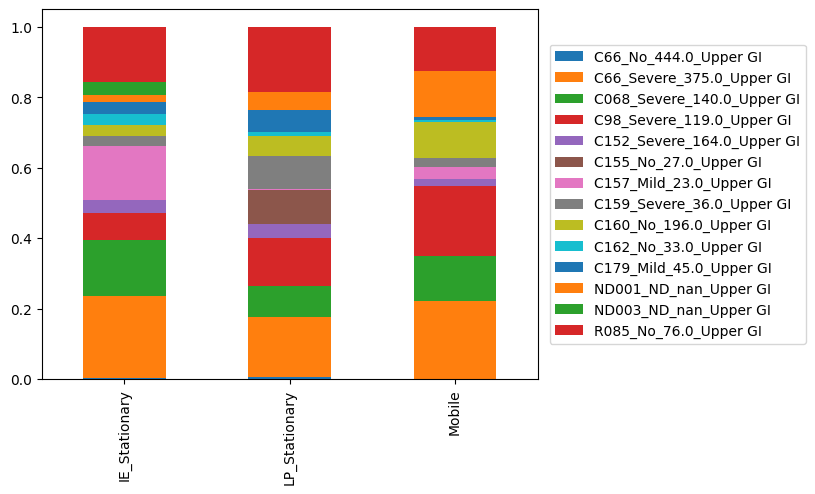

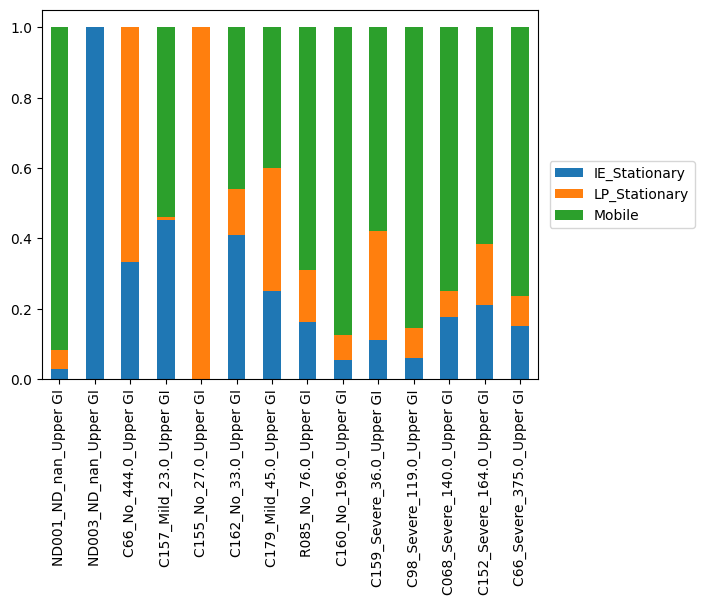

In [63]:

# Is there difference between Upper and Lower
#savepath = '/Users/lingtingshi/Documents/Azizi_lab/GVHD/'

#tcell_ann_concat.obs.loc[tcell_ann_concat.obs['cc_aa_alignment_same_v']== 'nan','cc_aa_alignment_same_v'] = 'none'
obs_2 = 'PatientID_Grade_Time_Loc'
obs_1 = 'Migration'

n_categories = {x : len(tcell_ann_concat_sel_Upper.obs[x].cat.categories) for x in [obs_1, obs_2]}
df = tcell_ann_concat_sel_Upper.obs[[obs_2, obs_1]].values

obs2_clusters = tcell_ann_concat_sel_Upper.obs[obs_2].cat.categories.tolist()
obs1_clusters = tcell_ann_concat_sel_Upper.obs[obs_1].cat.categories.tolist()

obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i")
                   for k in obs1_clusters}
obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i")
                   for k in obs2_clusters}

for b, l in df:
  obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
  obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1

obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))

for i, k in enumerate(obs2_clusters):
  obs2_to_obs1_array[i, :] = deepcopy(obs2_to_obs1[k])
for i, k in enumerate(obs1_clusters):
  obs1_to_obs2_array[i, :] = deepcopy(obs1_to_obs2[k])

sums = np.sum(obs2_to_obs1_array, 0)
for col in range(np.size(obs2_to_obs1_array, 1)):
  for row in range(np.size(obs2_to_obs1_array, 0)):
    obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

sums2 = np.sum(obs1_to_obs2_array, 0)
for col in range(np.size(obs1_to_obs2_array, 1)):
  for row in range(np.size(obs1_to_obs2_array, 0)):
    obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

df_obs2 = pd.DataFrame(obs2_to_obs1_array)
df_obs2.index = obs2_clusters
df_obs2.columns = obs1_clusters

df_obs2.T.plot(kind="bar", stacked=True)
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')


df_obs1 = pd.DataFrame(obs1_to_obs2_array)
df_obs1.index = obs1_clusters
df_obs1.columns = obs2_clusters
df_obs1 = df_obs1.reindex(columns=sorter_time_Upper)

df_obs1.T.plot(kind="bar", stacked=True)
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

In [64]:
df_obs1

,ND001_ND_nan_Upper GI,ND003_ND_nan_Upper GI,C66_No_444.0_Upper GI,C157_Mild_23.0_Upper GI,C155_No_27.0_Upper GI,C162_No_33.0_Upper GI,C179_Mild_45.0_Upper GI,R085_No_76.0_Upper GI,C160_No_196.0_Upper GI,C159_Severe_36.0_Upper GI,C98_Severe_119.0_Upper GI,C068_Severe_140.0_Upper GI,C152_Severe_164.0_Upper GI,C66_Severe_375.0_Upper GI
IE_Stationary,0.028997,1.0,0.333333,0.452797,0.0,0.411290,0.251121,0.162963,0.054475,0.112219,0.061816,0.177097,0.212121,0.151087
LP_Stationary,0.054075,0.0,0.666667,0.006993,1.0,0.129032,0.349776,0.146296,0.070039,0.309227,0.084641,0.074567,0.171717,0.084700
Mobile,0.916928,0.0,0.000000,0.540210,0.0,0.459677,0.399103,0.690741,0.875486,0.578554,0.853543,0.748336,0.616162,0.764212


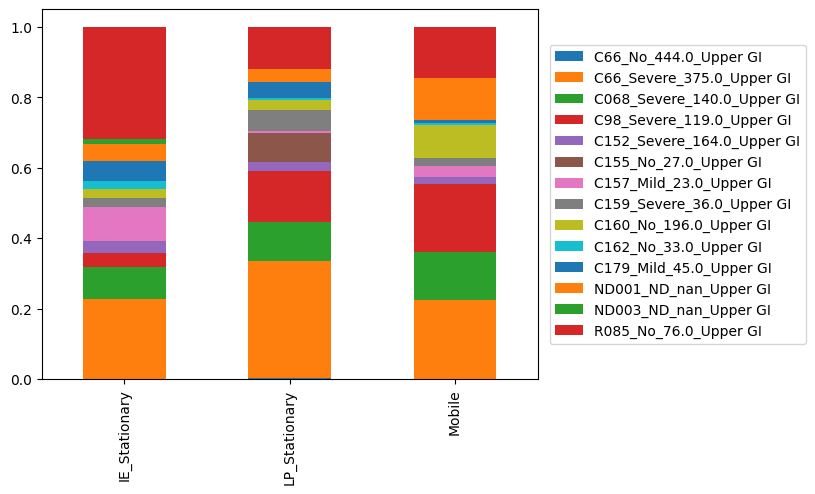

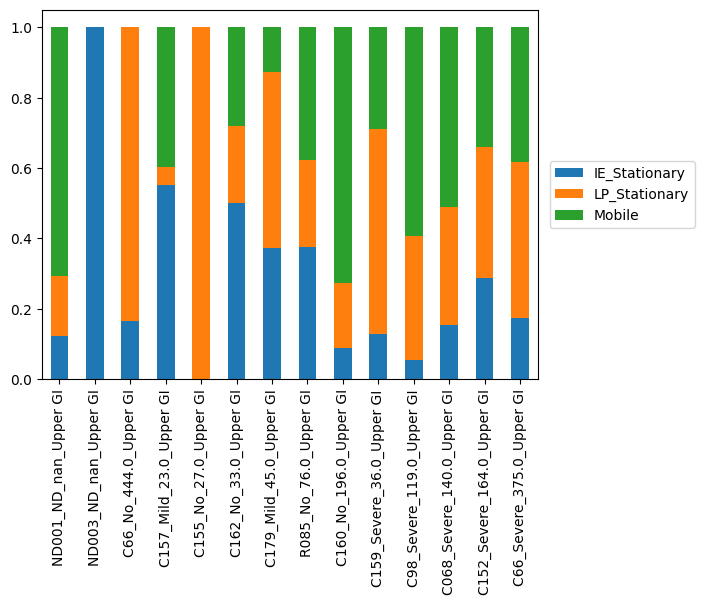

In [65]:

# Is there difference between Upper and Lower
#savepath = '/Users/lingtingshi/Documents/Azizi_lab/GVHD/'

#tcell_ann_concat.obs.loc[tcell_ann_concat.obs['cc_aa_alignment_same_v']== 'nan','cc_aa_alignment_same_v'] = 'none'
obs_2 = 'PatientID_Grade_Time_Loc'
obs_1 = 'Migration_all'

n_categories = {x : len(tcell_ann_concat_sel_all_Upper.obs[x].cat.categories) for x in [obs_1, obs_2]}
df = tcell_ann_concat_sel_all_Upper.obs[[obs_2, obs_1]].values

obs2_clusters = tcell_ann_concat_sel_all_Upper.obs[obs_2].cat.categories.tolist()
obs1_clusters = tcell_ann_concat_sel_all_Upper.obs[obs_1].cat.categories.tolist()

obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i")
                   for k in obs1_clusters}
obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i")
                   for k in obs2_clusters}

for b, l in df:
  obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
  obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1

obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))

for i, k in enumerate(obs2_clusters):
  obs2_to_obs1_array[i, :] = deepcopy(obs2_to_obs1[k])
for i, k in enumerate(obs1_clusters):
  obs1_to_obs2_array[i, :] = deepcopy(obs1_to_obs2[k])

sums = np.sum(obs2_to_obs1_array, 0)
for col in range(np.size(obs2_to_obs1_array, 1)):
  for row in range(np.size(obs2_to_obs1_array, 0)):
    obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

sums2 = np.sum(obs1_to_obs2_array, 0)
for col in range(np.size(obs1_to_obs2_array, 1)):
  for row in range(np.size(obs1_to_obs2_array, 0)):
    obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

df_obs2 = pd.DataFrame(obs2_to_obs1_array)
df_obs2.index = obs2_clusters
df_obs2.columns = obs1_clusters

df_obs2.T.plot(kind="bar", stacked=True)
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')


df_obs1 = pd.DataFrame(obs1_to_obs2_array)
df_obs1.index = obs1_clusters
df_obs1.columns = obs2_clusters
df_obs1 = df_obs1.reindex(columns=sorter_time_Upper)

df_obs1.T.plot(kind="bar", stacked=True)
plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')

/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/lingting/ENTER/envs/scirpy/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view

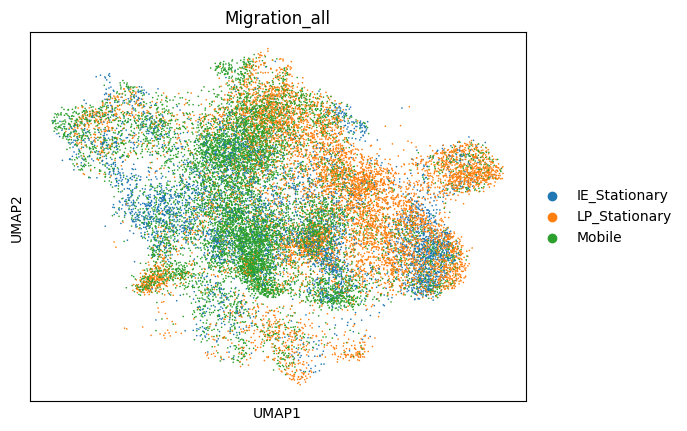

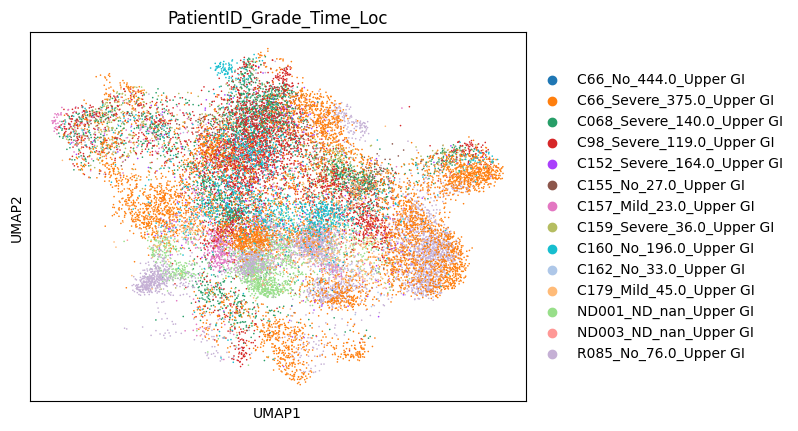

In [66]:
sc.pl.umap(tcell_ann_concat_sel_all_Upper, color=['Migration_all'])
sc.pl.umap(tcell_ann_concat_sel_all_Upper, color=['PatientID_Grade_Time_Loc'])

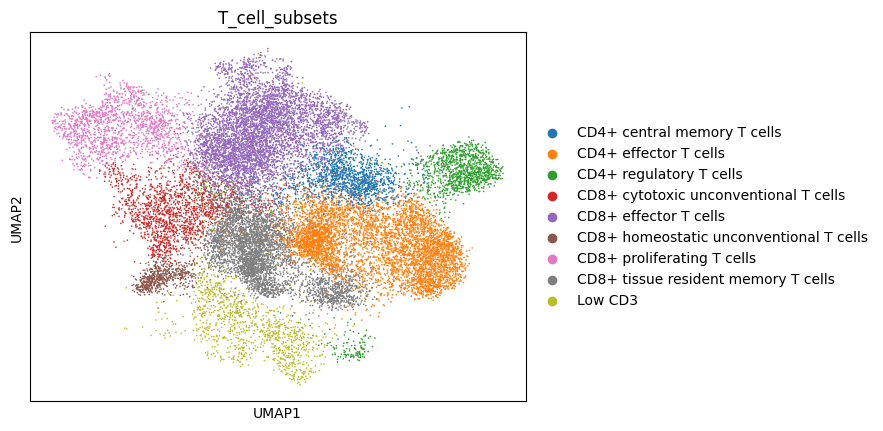

In [67]:
sc.pl.umap(tcell_ann_concat_sel_all_Upper, color=['T_cell_subsets'])

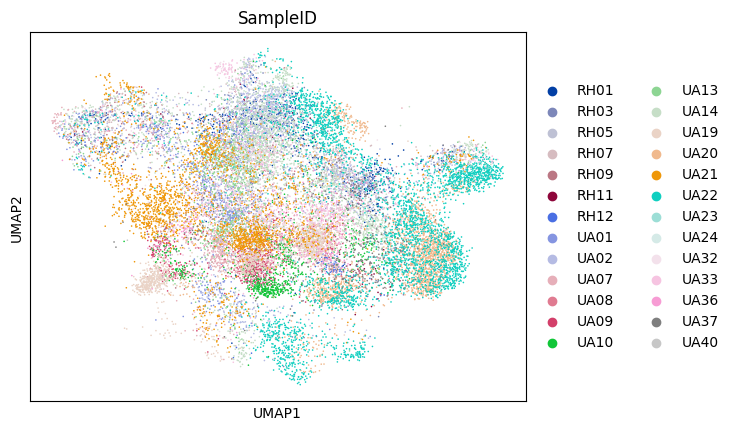

In [68]:
sc.pl.umap(tcell_ann_concat_sel_all_Upper, color=['SampleID'])

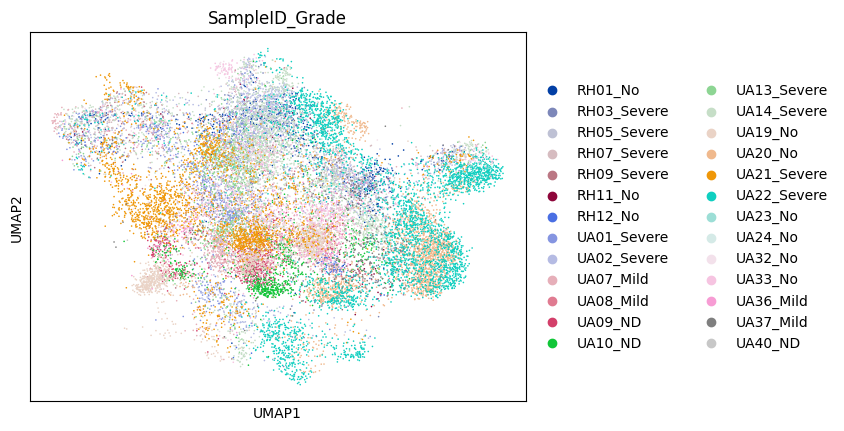

In [69]:
sc.pl.umap(tcell_ann_concat_sel_all_Upper, color=['SampleID_Grade'])

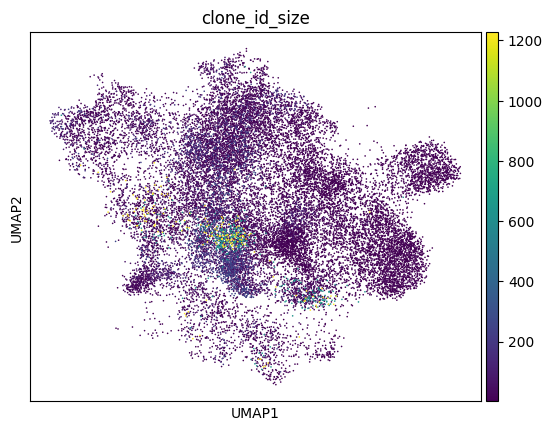

In [70]:
sc.pl.umap(tcell_ann_concat_sel_all_Upper, color=['clone_id_size'])

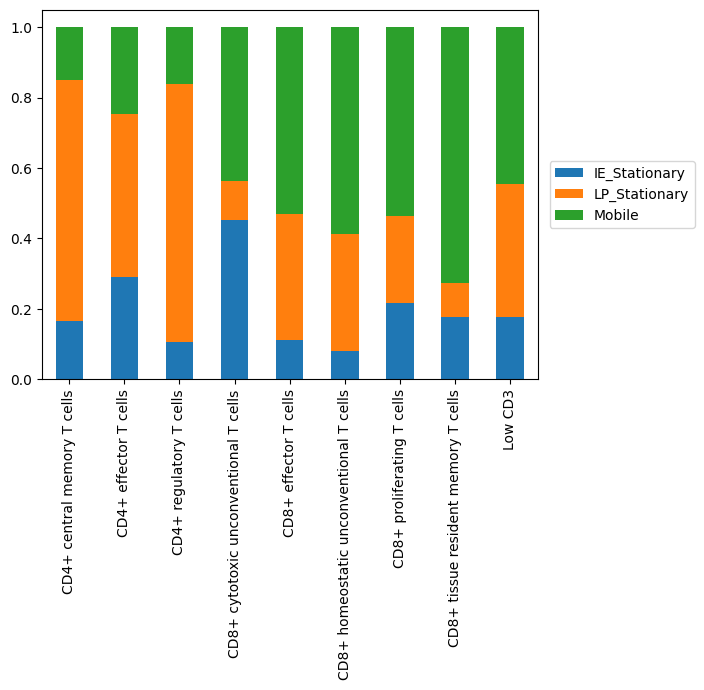

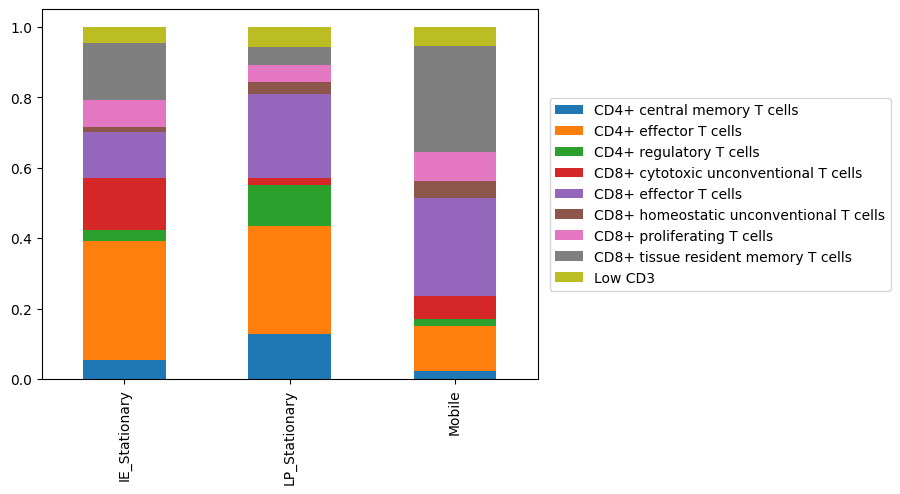

In [71]:

# Assuming adata is already defined and contains the necessary data
obs_2 = 'Migration_all'
obs_1 = 'T_cell_subsets'
num = 1

for adata in [tcell_ann_concat_sel_all_Upper]:
    n_categories = {x: len(adata.obs[x].cat.categories) for x in [obs_1, obs_2]}
    df = adata.obs[[obs_2, obs_1]].values

    obs2_clusters = adata.obs[obs_2].cat.categories.tolist()
    obs1_clusters = adata.obs[obs_1].cat.categories.tolist()

    # Mapping between obs1 and obs2 clusters
    obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i") for k in obs1_clusters}
    obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i") for k in obs2_clusters}
    for b, l in df:
        obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
        obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1
    obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
    obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))
    for i, k in enumerate(obs2_clusters):
        obs2_to_obs1_array[i, :] = np.array(obs2_to_obs1[k])
    for i, k in enumerate(obs1_clusters):
        obs1_to_obs2_array[i, :] = np.array(obs1_to_obs2[k])

    # Normalize the counts
    sums = np.sum(obs2_to_obs1_array, axis=0)
    obs2_to_obs1_array = obs2_to_obs1_array / sums

    sums2 = np.sum(obs1_to_obs2_array, axis=0)
    obs1_to_obs2_array = obs1_to_obs2_array / sums2

    # Create DataFrame for obs2 to obs1
    df_obs2 = pd.DataFrame(obs2_to_obs1_array)
    df_obs2.index = obs2_clusters
    df_obs2.columns = obs1_clusters

    # Apply cd8_colors to the columns of df_obs2
    df_obs2.T.plot(kind="bar", stacked=True, color=tcell_ann_concat_sel_all_Upper.uns[obs_2 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    # Create DataFrame for obs1 to obs2
    df_obs1 = pd.DataFrame(obs1_to_obs2_array)
    df_obs1.index = obs1_clusters
    df_obs1.columns = obs2_clusters

    # Apply cd8_colors to the columns of df_obs1
    df_obs1.T.plot(kind="bar", stacked=True, color=tcell_ann_concat_sel_all_Upper.uns[obs_1 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()


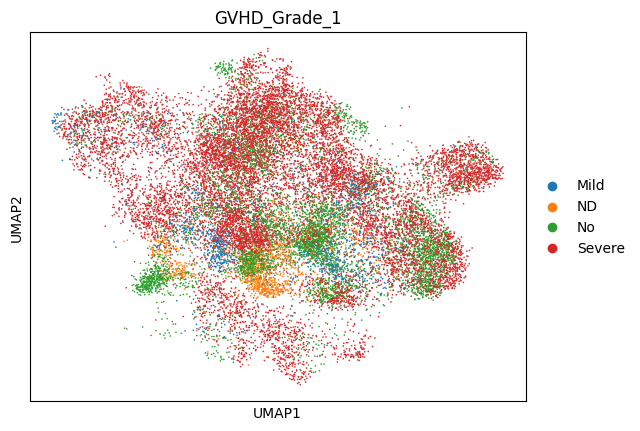

In [72]:
sc.pl.umap(tcell_ann_concat_sel_all_Upper, color=['GVHD_Grade_1'])

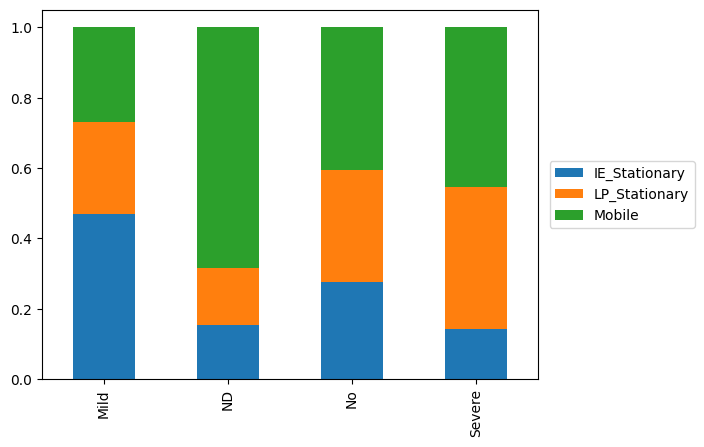

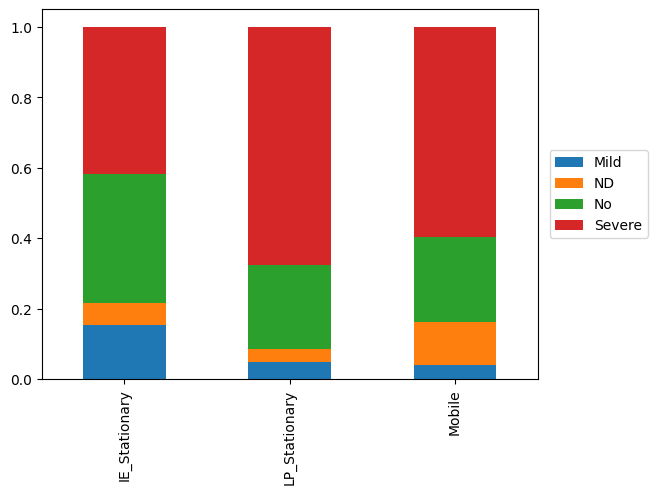

In [73]:
# Assuming adata is already defined and contains the necessary data
obs_2 = 'Migration_all'
obs_1 = 'GVHD_Grade_1'
num = 1

for adata in [tcell_ann_concat_sel_all_Upper]:
    n_categories = {x: len(adata.obs[x].cat.categories) for x in [obs_1, obs_2]}
    df = adata.obs[[obs_2, obs_1]].values

    obs2_clusters = adata.obs[obs_2].cat.categories.tolist()
    obs1_clusters = adata.obs[obs_1].cat.categories.tolist()

    # Mapping between obs1 and obs2 clusters
    obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i") for k in obs1_clusters}
    obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i") for k in obs2_clusters}
    for b, l in df:
        obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
        obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1
    obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
    obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))
    for i, k in enumerate(obs2_clusters):
        obs2_to_obs1_array[i, :] = np.array(obs2_to_obs1[k])
    for i, k in enumerate(obs1_clusters):
        obs1_to_obs2_array[i, :] = np.array(obs1_to_obs2[k])

    # Normalize the counts
    sums = np.sum(obs2_to_obs1_array, axis=0)
    obs2_to_obs1_array = obs2_to_obs1_array / sums

    sums2 = np.sum(obs1_to_obs2_array, axis=0)
    obs1_to_obs2_array = obs1_to_obs2_array / sums2

    # Create DataFrame for obs2 to obs1
    df_obs2 = pd.DataFrame(obs2_to_obs1_array)
    df_obs2.index = obs2_clusters
    df_obs2.columns = obs1_clusters

    # Apply cd8_colors to the columns of df_obs2
    df_obs2.T.plot(kind="bar", stacked=True, color=tcell_ann_concat_sel_all_Upper.uns[obs_2 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    # Create DataFrame for obs1 to obs2
    df_obs1 = pd.DataFrame(obs1_to_obs2_array)
    df_obs1.index = obs1_clusters
    df_obs1.columns = obs2_clusters

    # Apply cd8_colors to the columns of df_obs1
    df_obs1.T.plot(kind="bar", stacked=True, color=tcell_ann_concat_sel_all_Upper.uns[obs_1 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

In [74]:
leiden_clusters = tcell_ann_concat.obs['T_cell_subsets']

# Create a color map based on the UMAP plot
leiden_colors = tcell_ann_concat.uns['T_cell_subsets_colors']

# Map the colors to the clusters
cluster_to_color = {cluster: color for cluster, color in zip(leiden_clusters.cat.categories, leiden_colors)}

In [75]:
cluster_to_color

{'CD8+ effector T cells': '#1f77b4',
 'CD4+ effector T cells': '#ff7f0e',
 'CD8+ tissue resident memory T cells': '#2ca02c',
 'CD4+ central memory T cells': '#d62728',
 'CD8+ cytotoxic unconventional T cells': '#9467bd',
 'Low CD3': '#8c564b',
 'CD8+ proliferating T cells': '#e377c2',
 'CD4+ regulatory T cells': '#7f7f7f',
 'CD8+ homeostatic unconventional T cells': '#bcbd22'}

## 

In [76]:
# with singleton and expanded info and migration info so just 1 file.
tcell_ann_concat.write(TCELL_ANN_CONCAT_MIGRATION_PATH)

In [77]:
tcell_ann_concat_Mobile = tcell_ann_concat[tcell_ann_concat.obs['Migration_all'] =="Mobile"]

In [78]:
tcell_ann_concat_Mobile

View of AnnData object with n_obs × n_vars = 10359 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets', 'PatientID_Time', 'PatientID_Tissue_Loc', 'PatientID_Grade', 'PatientID_Grade_Time_Loc', 'T_cell_subsets_plot', 'T_cell_subsets_reordered', 'SampleID_Grade', 'GVHD_Grade', 'leiden_48', 'ptcy', 'PatientID_Grade_Ptcy', 'SampleID_Ptcy', 'receptor_type', 'receptor_subtype', 'chain_pairing', '

In [79]:
tcell_ann_concat_Mobile.obs['LPorIE']

RH03_AAAGCAAAGAGGTACC-1    Lamina Propria Cells
RH03_AACGTTGAGGCACATG-1    Lamina Propria Cells
RH03_AATCGGTGTCATACTG-1    Lamina Propria Cells
RH03_ACAGCCGTCCTTTCGG-1    Lamina Propria Cells
RH03_ACATACGAGATAGCAT-1    Lamina Propria Cells
                                   ...         
UA39_TGGTTCCTCTGATACG-1    Lamina Propria Cells
UA39_TGTGTTTAGATAGTCA-1    Lamina Propria Cells
UA39_TTCTCAAAGTTGTCGT-1    Lamina Propria Cells
UA39_TTGTAGGAGAGCTGGT-1    Lamina Propria Cells
UA39_TTGTAGGTCGTTGACA-1    Lamina Propria Cells
Name: LPorIE, Length: 10359, dtype: category
Categories (2, object): ['Intraepithelial Cells', 'Lamina Propria Cells']

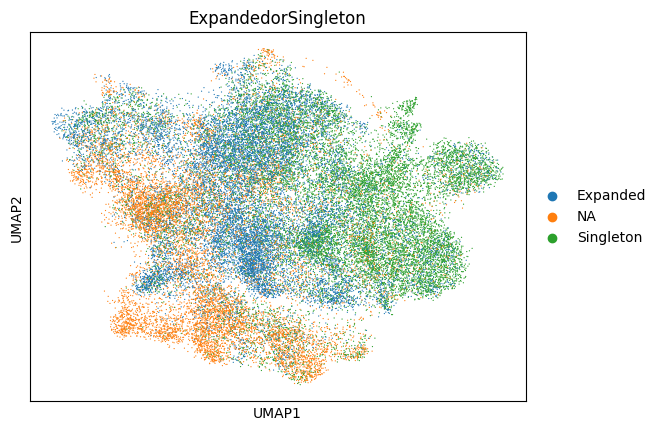

In [80]:
sc.pl.umap(tcell_ann_concat, color='ExpandedorSingleton')

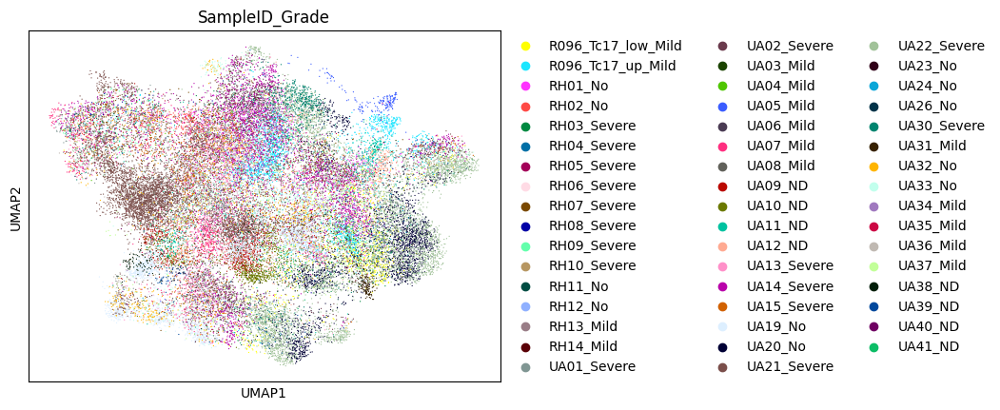

In [81]:
sc.pl.umap(tcell_ann_concat, color='SampleID_Grade')

In [82]:
tcell_ann_concat_tcr = tcell_ann_concat[~tcell_ann_concat.obs['clone_id'].isna(),:]

In [83]:
tcell_ann_concat_tcr

View of AnnData object with n_obs × n_vars = 28362 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'T_cell_subsets', 'PatientID_Time', 'PatientID_Tissue_Loc', 'PatientID_Grade', 'PatientID_Grade_Time_Loc', 'T_cell_subsets_plot', 'T_cell_subsets_reordered', 'SampleID_Grade', 'GVHD_Grade', 'leiden_48', 'ptcy', 'PatientID_Grade_Ptcy', 'SampleID_Ptcy', 'receptor_type', 'receptor_subtype', 'chain_pairing', '

In [84]:
### Remove small clusters
# Get the value counts
cluster_counts = tcell_ann_concat.obs['T_cell_subsets'].value_counts()

# Filter out clusters with counts lower than 200
filtered_clusters = cluster_counts[cluster_counts >= 200]

# Get the names of the clusters to keep
clusters_to_keep = filtered_clusters.index

# Filter the AnnData object to keep only the cells in those clusters
filtered_tcell_ann_concat = tcell_ann_concat[tcell_ann_concat.obs['T_cell_subsets'].isin(clusters_to_keep)]

# Optionally, view the filtered counts
filtered_counts = filtered_tcell_ann_concat.obs['T_cell_subsets'].value_counts()
filtered_counts

tcell_ann_concat = filtered_tcell_ann_concat


In [85]:
tcell_ann_concat.obs['T_cell_subsets'].cat.categories

Index(['CD8+ effector T cells', 'CD4+ effector T cells',
       'CD8+ tissue resident memory T cells', 'CD4+ central memory T cells',
       'CD8+ cytotoxic unconventional T cells', 'Low CD3',
       'CD8+ proliferating T cells', 'CD4+ regulatory T cells',
       'CD8+ homeostatic unconventional T cells'],
      dtype='object')

In [86]:
# Calculate cell counts per sample
cell_counts = tcell_ann_concat.obs['SampleID'].value_counts()

# Get samples with at least 100 cells
valid_samples = cell_counts[cell_counts >= 100].index

# Subset AnnData to retain only valid samples
tcell_ann_concat_f = tcell_ann_concat[tcell_ann_concat.obs['SampleID'].isin(valid_samples), :]

# Verify filtering
print(f"Remaining samples: {tcell_ann_concat_f.obs['SampleID'].nunique()}")
print(f"Remaining cells: {tcell_ann_concat_f.n_obs}")

Remaining samples: 38
Remaining cells: 38050


In [87]:
tcell_ann_concat_tcr_f = tcell_ann_concat_f[~tcell_ann_concat_f.obs['clone_id'].isna(),:]

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  normalized_value_counts = df.groupby('SampleID_Grade')['cc_aa_identity'].value_counts(normalize=True)
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for group, counts in normalized_value_counts.groupby(level=0):
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

SampleID_Grade      cc_aa_identity
R096_Tc17_low_Mild  1767.0            0.034884
                    1447.0            0.023256
                    1416.0            0.011628
                    1453.0            0.011628
                    1455.0            0.011628
                                        ...   
UA39_ND             24436.0           0.000000
                    24503.0           0.000000
                    24526.0           0.000000
                    24533.0           0.000000
                    24552.0           0.000000
Name: proportion, Length: 76527, dtype: float64
                    Gini Index
SampleID_Grade                
R096_Tc17_low_Mild    0.034183
R096_Tc17_up_Mild     0.068377
RH01_No               0.020529
RH03_Severe           0.000000
RH05_Severe           0.088889
RH06_Severe           0.000000
RH07_Severe           0.160525
RH08_Severe           0.036256
RH09_Severe           0.028520
RH13_Mild             0.000000
UA01_Severe           0.1363

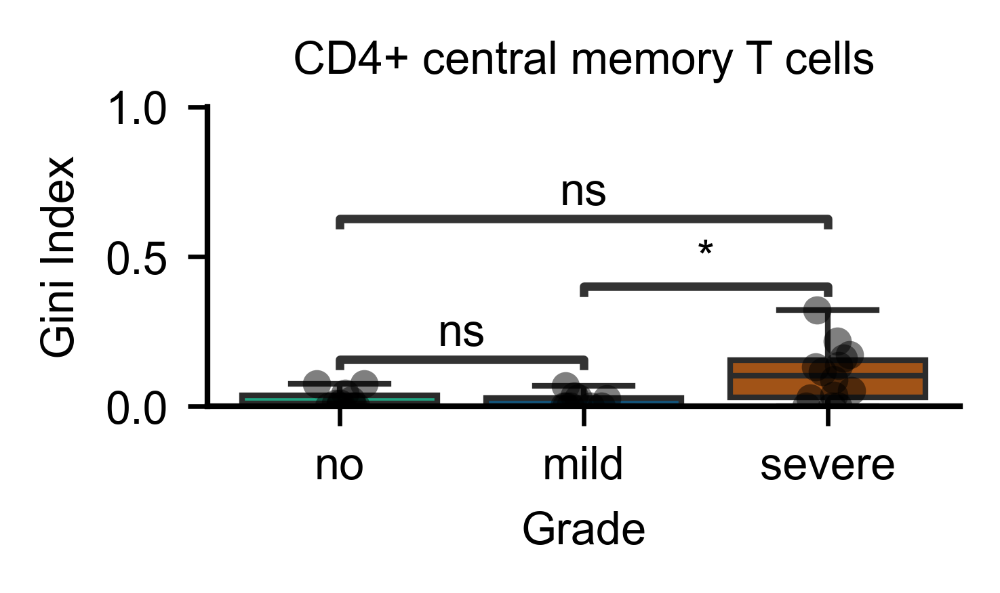

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  normalized_value_counts = df.groupby('SampleID_Grade')['cc_aa_identity'].value_counts(normalize=True)
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for group, counts in normalized_value_counts.groupby(level=0):
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

SampleID_Grade      cc_aa_identity
R096_Tc17_low_Mild  1677.0            0.074074
                    1406.0            0.037037
                    1567.0            0.037037
                    1625.0            0.037037
                    1645.0            0.037037
                                        ...   
UA39_ND             24432.0           0.000000
                    24464.0           0.000000
                    24534.0           0.000000
                    24547.0           0.000000
                    24553.0           0.000000
Name: proportion, Length: 117540, dtype: float64
                    Gini Index
SampleID_Grade                
R096_Tc17_low_Mild    0.035613
R096_Tc17_up_Mild     0.486625
RH01_No               0.128785
RH03_Severe           0.184707
RH05_Severe           0.180328
RH06_Severe           0.182653
RH07_Severe           0.245243
RH08_Severe           0.170408
RH09_Severe           0.036923
RH12_No               0.183333
RH13_Mild             0.170

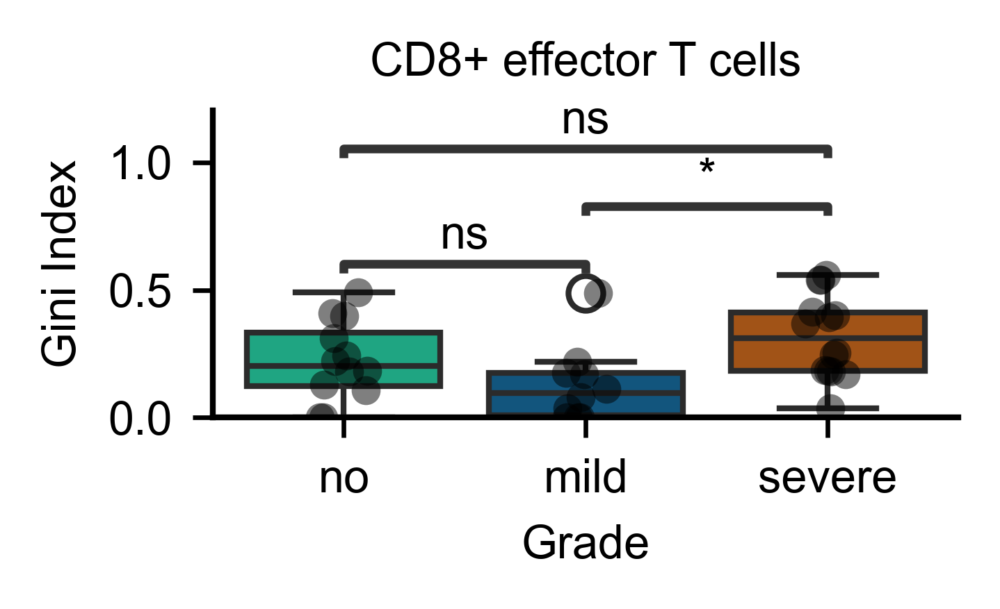

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  normalized_value_counts = df.groupby('SampleID_Grade')['cc_aa_identity'].value_counts(normalize=True)
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for group, counts in normalized_value_counts.groupby(level=0):
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

SampleID_Grade      cc_aa_identity
R096_Tc17_low_Mild  1713.0            0.015414
                    1530.0            0.007707
                    1619.0            0.007707
                    1764.0            0.007707
                    1415.0            0.005780
                                        ...   
UA39_ND             24532.0           0.000000
                    24543.0           0.000000
                    24548.0           0.000000
                    24549.0           0.000000
                    24550.0           0.000000
Name: proportion, Length: 174580, dtype: float64
                    Gini Index
SampleID_Grade                
R096_Tc17_low_Mild    0.084436
R096_Tc17_up_Mild     0.132036
RH01_No               0.000000
RH03_Severe           0.032184
RH05_Severe           0.039855
RH06_Severe           0.000000
RH07_Severe           0.000000
RH08_Severe           0.000000
RH12_No               0.236171
RH13_Mild             0.035613
UA01_Severe           0.107

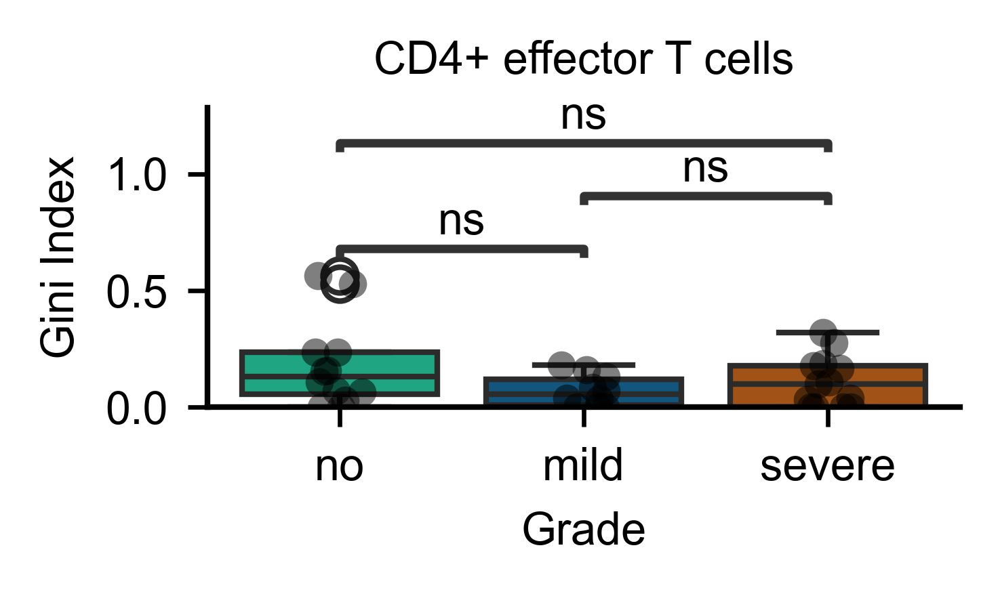

SampleID_Grade      cc_aa_identity
R096_Tc17_low_Mild  1422.0            0.076923
                    1590.0            0.076923
                    1599.0            0.076923
                    1602.0            0.076923
                    1713.0            0.076923
                                        ...   
UA39_ND             24014.0           0.000000
                    24032.0           0.000000
                    24112.0           0.000000
                    24254.0           0.000000
                    24257.0           0.000000
Name: proportion, Length: 34528, dtype: float64


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  normalized_value_counts = df.groupby('SampleID_Grade')['cc_aa_identity'].value_counts(normalize=True)
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for group, counts in normalized_value_counts.groupby(level=0):
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

                    Gini Index
SampleID_Grade                
R096_Tc17_low_Mild    0.000000
R096_Tc17_up_Mild     0.048123
RH01_No               0.057332
RH03_Severe           0.000000
RH05_Severe           0.085213
RH06_Severe           0.000000
RH07_Severe           0.254563
RH08_Severe           0.030242
RH09_Severe           0.234855
RH12_No               0.285714
UA01_Severe           0.387108
UA02_Severe           0.239756
UA07_Mild             0.536228
UA09_ND               0.000000
UA10_ND               0.000000
UA11_ND               0.097222
UA12_ND               0.000000
UA13_Severe           0.413983
UA14_Severe           0.353290
UA15_Severe           0.718457
UA19_No               0.000000
UA20_No               0.000000
UA21_Severe           0.485652
UA22_Severe           0.198630
UA30_Severe           0.339345
UA32_No               0.263158
UA33_No               0.153509
UA34_Mild             0.116071
UA35_Mild             0.198257
UA36_Mild             0.043290
UA37_Mil

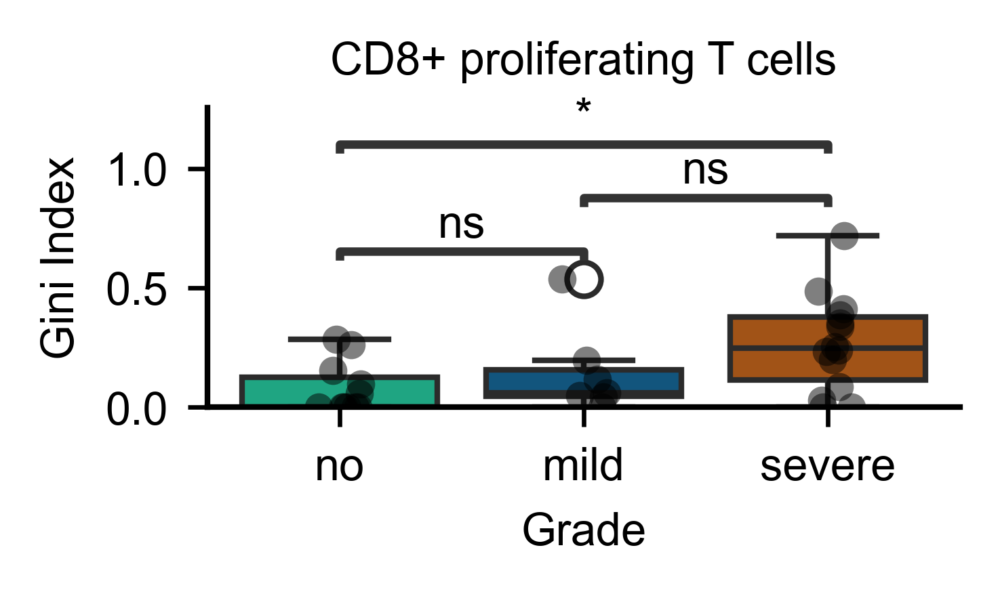

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  normalized_value_counts = df.groupby('SampleID_Grade')['cc_aa_identity'].value_counts(normalize=True)
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for group, counts in normalized_value_counts.groupby(level=0):
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

SampleID_Grade      cc_aa_identity
R096_Tc17_low_Mild  1488.0            0.062500
                    1411.0            0.041667
                    1705.0            0.041667
                    1734.0            0.041667
                    1420.0            0.020833
                                        ...   
UA37_Mild           23292.0           0.000000
                    23407.0           0.000000
                    23467.0           0.000000
                    23500.0           0.000000
                    23543.0           0.000000
Name: proportion, Length: 37851, dtype: float64
                    Gini Index
SampleID_Grade                
R096_Tc17_low_Mild    0.095930
R096_Tc17_up_Mild     0.050738
RH01_No               0.034392
RH03_Severe           0.075758
RH05_Severe           0.000000
RH06_Severe           0.000000
RH07_Severe           0.088972
RH08_Severe           0.000000
RH09_Severe           0.000000
UA01_Severe           0.000000
UA02_Severe           0.2306

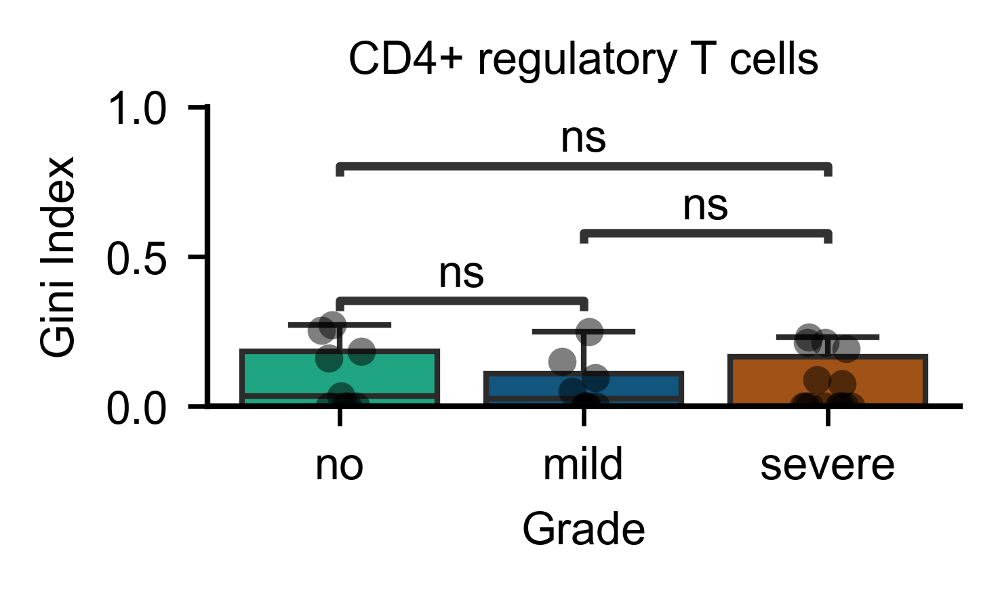

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  normalized_value_counts = df.groupby('SampleID_Grade')['cc_aa_identity'].value_counts(normalize=True)
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for group, counts in normalized_value_counts.groupby(level=0):
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

SampleID_Grade      cc_aa_identity
R096_Tc17_low_Mild  1423.0            0.109375
                    1840.0            0.062500
                    1592.0            0.046875
                    1823.0            0.031250
                    1424.0            0.015625
                                        ...   
UA39_ND             24497.0           0.000000
                    24501.0           0.000000
                    24525.0           0.000000
                    24531.0           0.000000
                    24555.0           0.000000
Name: proportion, Length: 45395, dtype: float64
                    Gini Index
SampleID_Grade                
R096_Tc17_low_Mild    0.177885
R096_Tc17_up_Mild     0.545833
RH01_No               0.000000
RH03_Severe           0.305195
RH05_Severe           0.484302
RH06_Severe           0.000000
RH07_Severe           0.000000
RH08_Severe           0.000000
RH09_Severe           0.000000
RH12_No               0.250000
UA01_Severe           0.5370

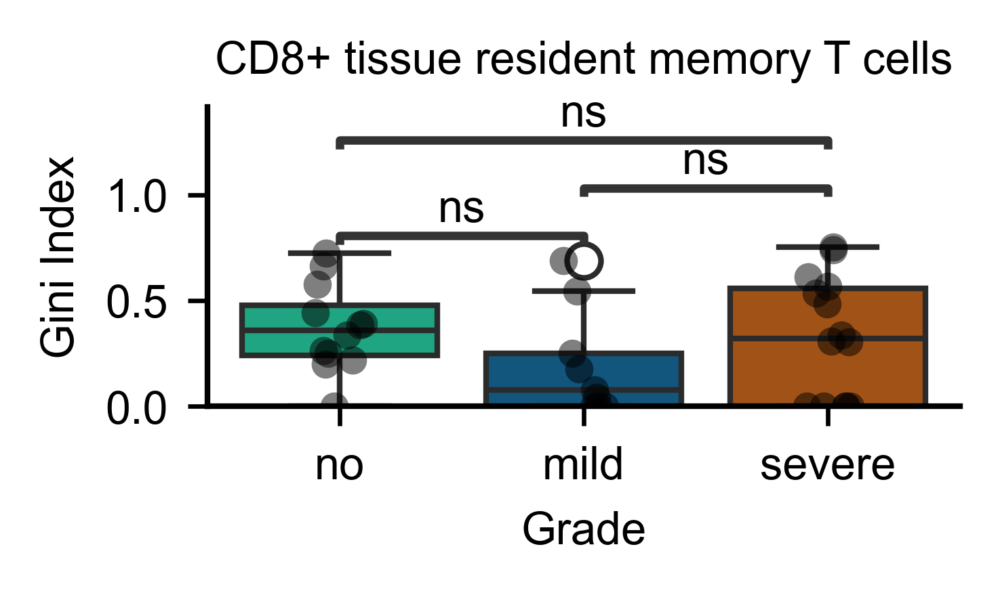

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  normalized_value_counts = df.groupby('SampleID_Grade')['cc_aa_identity'].value_counts(normalize=True)
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for group, counts in normalized_value_counts.groupby(level=0):
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

SampleID_Grade      cc_aa_identity
R096_Tc17_low_Mild  1918.0            1.0
                    115.0             0.0
                    550.0             0.0
                    923.0             0.0
                    2374.0            0.0
                                     ... 
UA38_ND             24393.0           0.0
                    24402.0           0.0
                    24415.0           0.0
                    24430.0           0.0
                    24438.0           0.0
Name: proportion, Length: 31456, dtype: float64
                    Gini Index
SampleID_Grade                
R096_Tc17_low_Mild    0.000000
R096_Tc17_up_Mild     0.166667
RH01_No               0.000000
RH03_Severe           0.000000
RH05_Severe           0.181250
RH06_Severe           0.094444
RH07_Severe           0.150000
RH08_Severe           0.000000
RH09_Severe           0.161616
RH12_No               0.000000
UA01_Severe           0.150000
UA02_Severe           0.000000
UA07_Mild            

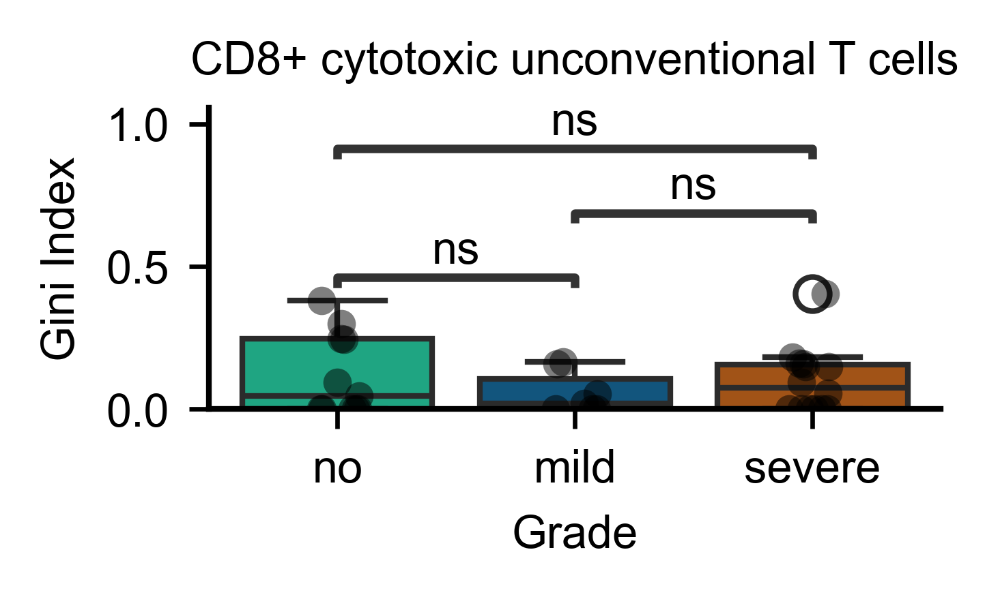

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  normalized_value_counts = df.groupby('SampleID_Grade')['cc_aa_identity'].value_counts(normalize=True)
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for group, counts in normalized_value_counts.groupby(level=0):
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

SampleID_Grade      cc_aa_identity
R096_Tc17_low_Mild  1423.0            0.037383
                    1714.0            0.018692
                    1406.0            0.009346
                    1408.0            0.009346
                    1413.0            0.009346
                                        ...   
UA39_ND             24364.0           0.000000
                    24420.0           0.000000
                    24469.0           0.000000
                    24537.0           0.000000
                    24541.0           0.000000
Name: proportion, Length: 37135, dtype: float64
                    Gini Index
SampleID_Grade                
R096_Tc17_low_Mild    0.036839
R096_Tc17_up_Mild     0.000000
RH01_No               0.000000
RH03_Severe           0.000000
RH05_Severe           0.000000
RH06_Severe           0.133333
RH07_Severe           0.000000
RH08_Severe           0.000000
RH09_Severe           0.000000
RH12_No               0.000000
RH13_Mild             0.0000

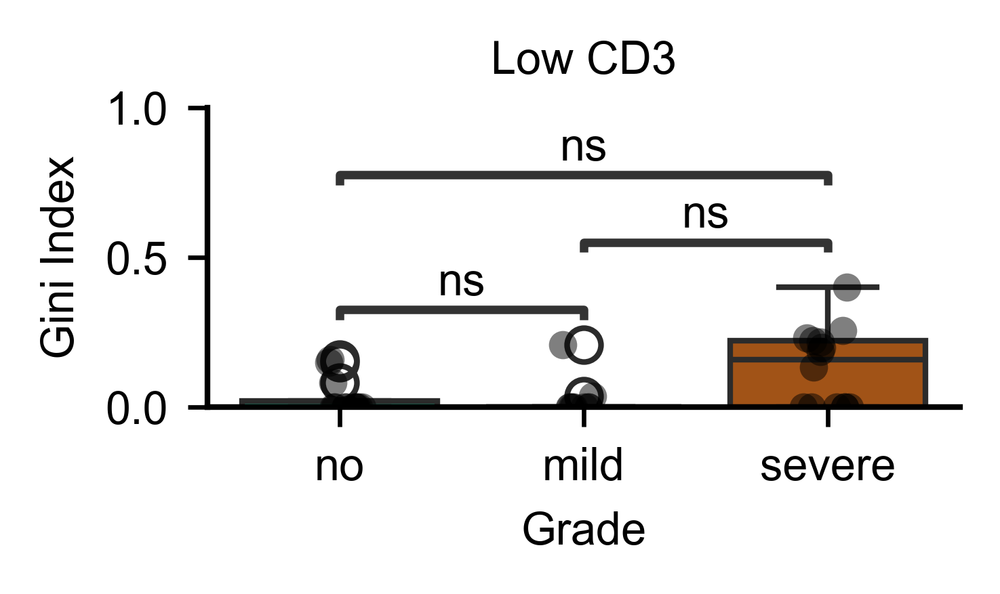

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  normalized_value_counts = df.groupby('SampleID_Grade')['cc_aa_identity'].value_counts(normalize=True)
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for group, counts in normalized_value_counts.groupby(level=0):
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_8243/2303334576.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign t

SampleID_Grade      cc_aa_identity
R096_Tc17_low_Mild  1516.0            0.375
                    1404.0            0.125
                    1491.0            0.125
                    1727.0            0.125
                    2032.0            0.125
                                      ...  
UA39_ND             24513.0           0.000
                    24516.0           0.000
                    24536.0           0.000
                    24539.0           0.000
                    24545.0           0.000
Name: proportion, Length: 7209, dtype: float64
                    Gini Index
SampleID_Grade                
R096_Tc17_low_Mild    0.208333
RH03_Severe           0.000000
RH05_Severe           0.000000
RH06_Severe           0.000000
RH07_Severe           0.000000
RH09_Severe           0.000000
UA01_Severe           0.447641
UA02_Severe           0.280543
UA07_Mild             0.393665
UA09_ND               0.653727
UA10_ND               0.609677
UA11_ND               0.491597


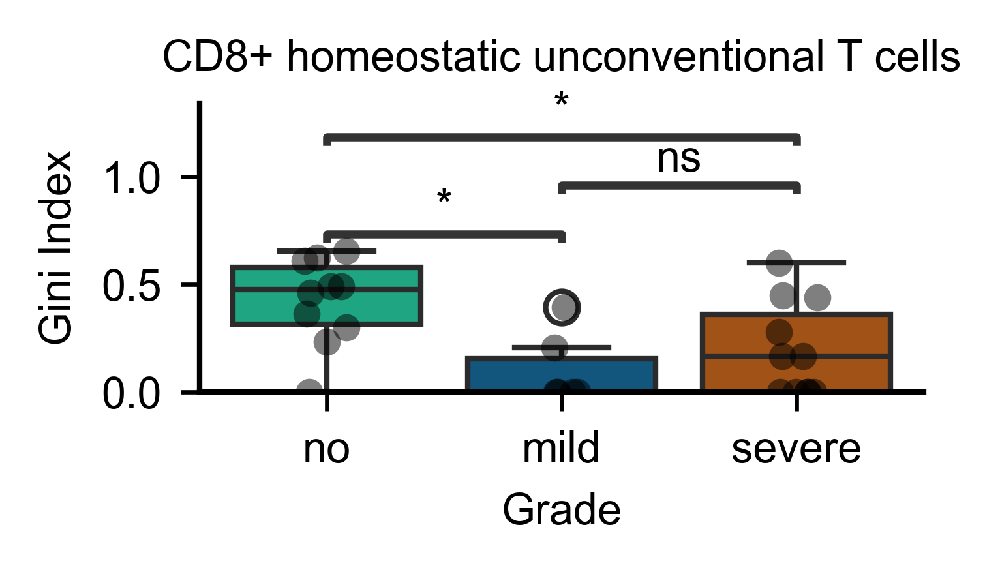

In [90]:
from statannotations.Annotator import Annotator
from statsmodels.stats.multitest import multipletests   
import matplotlib as mpl
sc.settings.set_figure_params(dpi_save=300)
mpl.rcParams['axes.linewidth'] = 1
mpl.rcParams['axes.grid'] = False
mpl.rcParams['text.color'] = 'black'
mpl.rcParams['axes.labelcolor'] = 'black'
mpl.rcParams['xtick.color'] = 'black'
mpl.rcParams['ytick.color'] = 'black'
mpl.rcParams['axes.titlecolor'] = 'black'
mpl.rcParams['legend.facecolor'] = 'white'
mpl.rcParams['legend.edgecolor'] = 'black'
mpl.rcParams['legend.labelcolor'] = 'black'
mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['axes.labelsize'] = 8
mpl.rcParams['xtick.labelsize'] = 8
mpl.rcParams['ytick.labelsize'] = 8

def gini(x):
    total = 0
    for i, xi in enumerate(x[:-1], 1):
        total += np.sum(np.abs(xi - x[i:]))
    return total / (len(x)**2 * np.mean(x))

for cluster in tcell_ann_concat_tcr_f.obs['T_cell_subsets'].unique():
    if cluster != 'CXCR3 high Resident CD8 T cells':
        for adata in [tcell_ann_concat_tcr_f[tcell_ann_concat_tcr_f.obs['T_cell_subsets'] == cluster]]:
            df = adata.obs
            normalized_value_counts = df.groupby('SampleID_Grade')['cc_aa_identity'].value_counts(normalize=True)
            print(normalized_value_counts)

            gini_results = {}
            for group, counts in normalized_value_counts.groupby(level=0):
                non_zero_counts = counts[counts > 0]
                gini_index = gini(non_zero_counts.values)
                gini_results[group] = gini_index

            gini_df = pd.DataFrame(list(gini_results.items()), columns=['SampleID_Grade', 'Gini Index'])
            gini_df.set_index('SampleID_Grade', inplace=True)
            print(gini_df)

            df_obs2 = pd.DataFrame(gini_df).transpose()

            def filter_columns(substring):
                column_mask = df_obs2.columns.str.contains(substring)
                selected_columns = df_obs2.loc[:, column_mask]
                return selected_columns.values[~np.isnan(selected_columns.values)]

            severe  = filter_columns('Severe')
            mild    = filter_columns('Mild')
            no      = filter_columns('No')
            treated = filter_columns('Treated')
            nd      = filter_columns('ND')

            def create_df(values, grade):
                df = pd.DataFrame()
                df['Value'] = values
                df['Grade'] = grade
                return df

            df_severe  = create_df(severe,  'severe')
            df_mild    = create_df(mild,    'mild')
            df_no      = create_df(no,      'no')
            df_treated = create_df(treated, 'no')
            df_nd      = create_df(nd,      'no')

            result = pd.concat([df_no, df_treated, df_nd, df_mild, df_severe])

            palette = {'no': '#09BB8C', 'mild': '#005A8F', 'severe': '#B85000'}
            fig, ax = plt.subplots(figsize=(2.5, 1.5), dpi=300)

            sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=palette,
                        order=['no', 'mild', 'severe'])
            sns.stripplot(x='Grade', y='Value', data=result, ax=ax, color='black',
                          alpha=0.5, jitter=True, order=['no', 'mild', 'severe'])

            ax.spines[['right', 'top']].set_visible(False)
            ax.set_xlabel('Grade')
            ax.set_ylabel('Gini Index')
            ax.set_title(cluster)
            ax.get_xaxis().tick_bottom()
            ax.get_yaxis().tick_left()
            ax.set_ylim(0, 1)

            pairs = [('no', 'mild'), ('no', 'severe'), ('mild', 'severe')]

            # Compute raw Mann-Whitney p-values
            pvals_raw = []
            for pair in pairs:
                group1 = result[result['Grade'] == pair[0]]['Value']
                group2 = result[result['Grade'] == pair[1]]['Value']
                _, pval = stats.mannwhitneyu(group1, group2, alternative='two-sided')
                pvals_raw.append(pval)

            # Apply Holm-Bonferroni correction
            corrected_pvals = multipletests(pvals_raw, method='holm')[1]

            # Annotate using corrected p-values
            annotator = Annotator(ax, pairs, data=result, x='Grade', y='Value',
                                  order=['no', 'mild', 'severe'])
            annotator.set_pvalues_and_annotate(corrected_pvals)

            plt.tight_layout()

            print("Raw p-values:", pvals_raw)
            print("Holm-corrected p-values:", corrected_pvals)
            for idx, pair in enumerate(pairs):
                significance = "significant" if corrected_pvals[idx] < 0.05 else "not significant"
                print(f"{pair}: corrected p = {corrected_pvals[idx]:.6f} ({significance})")

            sample_counts = result['Grade'].value_counts()
            print("Number of samples per condition:")
            print(sample_counts)

            plt.savefig(FIGURES_SC_DIR / f'tcr_Gini_index_plot_{cluster}.pdf',
                        format='pdf', bbox_inches='tight', dpi=300)
            plt.savefig(FIGURES_SC_DIR / f'tcr_Gini_index_plot_{cluster}.png',
                        format='png', bbox_inches='tight', dpi=300)
            plt.show()

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_82003/1055610762.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_ann_concat_conv.obs['SampleID_Grade'] = tcell_ann_concat_conv.obs['PatientID'].astype(str)+'_'+tcell_ann_concat_conv.obs['Migration_all'].astype(str)+tcell_ann_concat_conv.obs['Tissue_Location'].astype(str)
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_82003/1055610762.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  normalized_value_counts = df.groupby('SampleID_Grade')['cc_aa_identity'].value_counts(normalize=True)
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_82003/1055610762.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a futur

                             Gini Index
SampleID_Grade                         
C068_IE_StationaryUpper GI     0.442652
C068_LP_StationaryUpper GI     0.358466
C068_MobileUpper GI            0.537850
C152_IE_StationaryLower GI     0.234818
C152_IE_StationaryUpper GI     0.221198
C152_LP_StationaryUpper GI     0.000000
C152_MobileLower GI            0.000000
C152_MobileUpper GI            0.537612
C155_LP_StationaryUpper GI     0.352327
C157_IE_StationaryUpper GI     0.541220
C157_MobileLower GI            0.000000
C157_MobileUpper GI            0.776684
C159_IE_StationaryUpper GI     0.070513
C159_LP_StationaryLower GI     0.182540
C159_LP_StationaryUpper GI     0.425926
C159_MobileLower GI            0.250000
C159_MobileUpper GI            0.324206
C160_IE_StationaryUpper GI     0.215909
C160_LP_StationaryUpper GI     0.493506
C160_MobileUpper GI            0.512734
C162_IE_StationaryUpper GI     0.250000
C162_LP_StationaryLower GI     0.250000
C162_MobileLower GI            0.000000


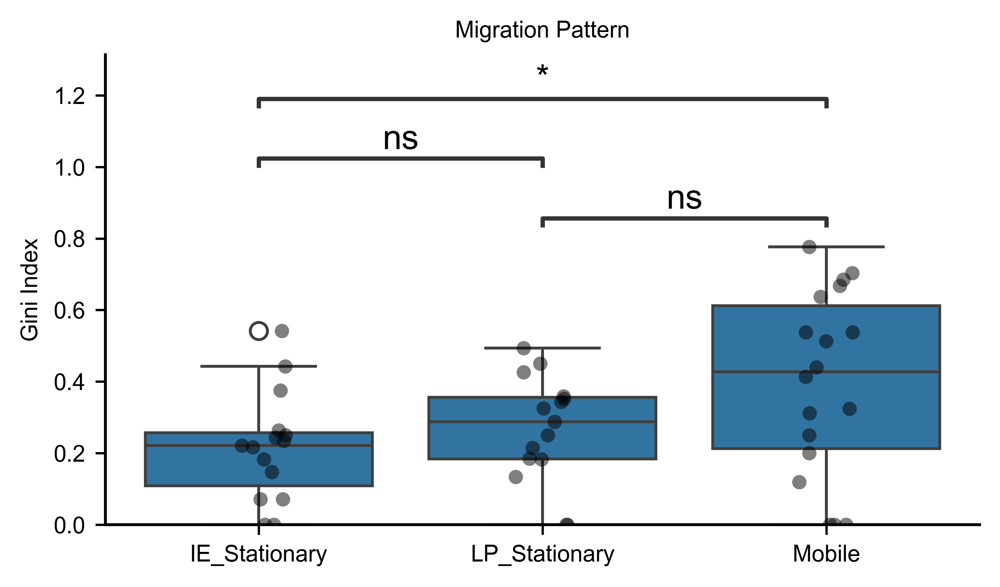

In [89]:
# Assuming tcell_ann_concat_tcr is your AnnData object
tcell_ann_concat_conv = tcell_ann_concat_f[tcell_ann_concat_f.obs['T_cell_subsets'].isin(['CD8+ tissue resident memory T cells','CD8+ effector T cells','CD8+ proliferatingT cells'])]
tcell_ann_concat_conv = tcell_ann_concat_conv[tcell_ann_concat_conv.obs['Migration'].isin(['Mobile','LP_Stationary','IE_Stationary'])]
tcell_ann_concat_conv.obs['SampleID_Grade'] = tcell_ann_concat_conv.obs['PatientID'].astype(str)+'_'+tcell_ann_concat_conv.obs['Migration_all'].astype(str)+tcell_ann_concat_conv.obs['Tissue_Location'].astype(str)
tcell_ann_concat_conv.obs['SampleID_Grade'] = tcell_ann_concat_conv.obs['SampleID_Grade'].astype(('category'))
for adata in [tcell_ann_concat_conv]:
    df = adata.obs
            # Group by 'SampleID_Grade' and then calculate the Gini index of 'cc_aa_alignment_same_v_size_norm'
    normalized_value_counts = df.groupby('SampleID_Grade')['cc_aa_identity'].value_counts(normalize=True)
    
                # Step 2: Iterate through each group, drop 0s, and calculate the Gini index
    gini_results = {}
            
    for group, counts in normalized_value_counts.groupby(level=0):
            # Step 2.1: Drop any zero frequencies
        non_zero_counts = counts[counts > 0]
            
            # Step 2.2: Calculate the Gini index for non-zero frequencies
        gini_index = gini(non_zero_counts.values)
            
            # Store the Gini index result for each group
        gini_results[group] = gini_index
            
            # Step 3: Convert the Gini index results to a DataFrame for display
        gini_df = pd.DataFrame(list(gini_results.items()), columns=['SampleID_Grade', 'Gini Index'])
        gini_df.set_index('SampleID_Grade', inplace=True)
    print(gini_df)
    
            # Display the resulting DataFrame
    df_obs2 = pd.DataFrame(gini_df).transpose()
    
            # Filter columns based on substrings
    def filter_columns(substring):
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns = df_obs2.loc[:, column_mask]
        return selected_columns.values[~np.isnan(selected_columns.values)]

    severe = filter_columns('Mobile')
    mild = filter_columns('LP')
    no = filter_columns('IE')

    # Create DataFrames for each grade
    def create_df(values, grade):
        df = pd.DataFrame()
        df['Value'] = values
        df['Grade'] = grade
        return df

    df_severe = create_df(severe, 'Mobile')
    df_mild = create_df(mild, 'LP_Stationary')
    df_no = create_df(no, 'IE_Stationary')


        # Concatenate all DataFrames
    result = pd.concat([ df_no, df_mild, df_severe])

    rcParams.update({'font.size': 12})
    fig, ax = plt.subplots(figsize=(5, 3), dpi=300)

    sns.boxplot(x='Grade', y='Value', data=result, ax=ax)
    sns.stripplot(x='Grade', y='Value', data=result, ax=ax, color='black', alpha=0.5, jitter=True)

    ax.spines[['right', 'top']].set_visible(False)
    ax.set_xlabel('')
    ax.set_ylabel('Gini Index')
    ax.set_title('Migration Pattern')
    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()

        # Set y-axis limits (adjust these values as needed)
    ax.set_ylim(0, 1)

        # Add statistical annotations
    pairs = [('Mobile', 'LP_Stationary'), ('LP_Stationary', 'IE_Stationary'), ('Mobile', 'IE_Stationary')]
    annotator = Annotator(ax, pairs, data=result, x='Grade', y='Value')
    annotator.configure(test='Kruskal')
    annotator.apply_and_annotate()
    plt.tight_layout()

    plt.savefig(FIGURES_SC_DIR / 'tcr_Gini_index_plot_Mobile.pdf', format='pdf', bbox_inches='tight', dpi=300)
    plt.savefig(FIGURES_SC_DIR / 'tcr_Gini_index_plot_Mobile.png', format='png', bbox_inches='tight', dpi=300)
    plt.show()

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_82003/1729370632.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=custom_palette)


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

LP_Stationary vs. Mobile: Kruskal-Wallis independent samples (pairwise between groups), P_val:1.237e-01 Stat=2.369e+00
IE_Stationary vs. LP_Stationary: Kruskal-Wallis independent samples (pairwise between groups), P_val:3.500e-01 Stat=8.735e-01
IE_Stationary vs. Mobile: Kruskal-Wallis independent samples (pairwise between groups), P_val:4.440e-02 Stat=4.041e+00


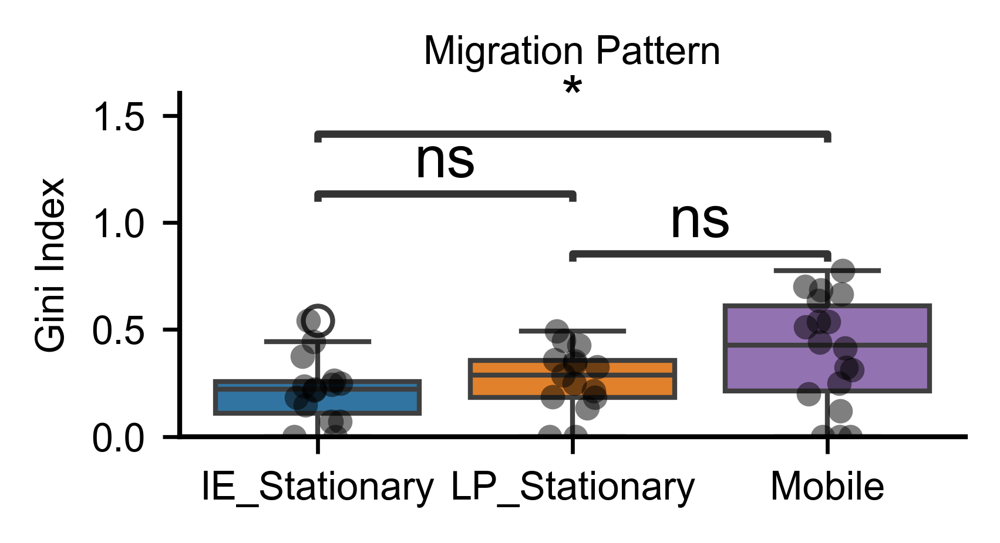

In [90]:
# Set custom colors for the boxplot
custom_palette = {
    'Mobile': '#9467bd',         # Blue for Mobile
    'LP_Stationary': '#ff7f0e',  # Orange for LP_Stationary
    'IE_Stationary': '#1f77b4'   # Purple for IE_Stationary (replacing green)
}

fig, ax = plt.subplots(figsize=(3, 1.7), dpi=300)

# Boxplot with custom palette
sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=custom_palette)

# Stripplot with custom color (black dots)
sns.stripplot(x='Grade', y='Value', data=result, ax=ax, color='black', alpha=0.5, jitter=True)

ax.spines[['right', 'top']].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('Gini Index')
ax.set_title('Migration Pattern')
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()

# Set y-axis limits (adjust these values as needed)
ax.set_ylim(0, 1)

# Add statistical annotations
pairs = [('Mobile', 'LP_Stationary'), ('LP_Stationary', 'IE_Stationary'), ('Mobile', 'IE_Stationary')]
annotator = Annotator(ax, pairs, data=result, x='Grade', y='Value')
annotator.configure(test='Kruskal')
annotator.apply_and_annotate()
plt.tight_layout()

plt.savefig(FIGURES_SC_DIR / 'tcr_Gini_index_plot_Mobile.pdf', format='pdf', bbox_inches='tight', dpi=300)
plt.savefig(FIGURES_SC_DIR / 'tcr_Gini_index_plot_Mobile.png', format='png', bbox_inches='tight', dpi=300)
plt.show()